In [36]:
from scipy.linalg import solve
# Define the equation parameters
from scipy.special import erfc

import numpy as np
import scipy.integrate
from numpy import exp
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.animation as FuncAnimation
from IPython.display import HTML
plt.rcParams['figure.figsize'] = [12, 9]

from matplotlib.animation import PillowWriter

In [4]:
# Analytical - du/dt = -v*du/dx+D*d2u/dx2

# with Initial Condition - C(x, 0) = Ci and BCs C(0, t) = Co and C(inf, t) = 0
# C(x, t) = ((Co-Ci)/2)*(erfc(x-vt)/(2sqrt(Dt/R))+exp(vx/(D/R))*erfc((x+vt)/(2*sqrt(Dt/R))))
# Ci = 1 mol/L; Co = 0 mol/L; R =1; D = 0.0048 m2/day; v = 0.24/m/day

Ci = 1; 
Co = 0
Cinf = 0;
R = 1; 
D = 0.2
v = 0.2

nx = 101;
nt = 1001;

L = 1;
T = 1;

x = np.linspace(0, L, nx);
t = np.linspace(0, T, nt);


C = np.zeros((nt, nx))
for i in range(nt):  
    for j in range(nx):      
        C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))

U_exact = np.transpose(C);

<ipython-input-4-55d9c20d8956>:27: RuntimeWarning: invalid value encountered in double_scalars
  C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))
<ipython-input-4-55d9c20d8956>:27: RuntimeWarning: divide by zero encountered in double_scalars
  C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))


In [5]:
np.shape(C)

(1001, 101)

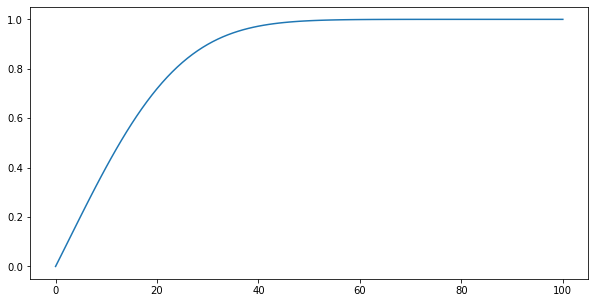

In [6]:
plt.plot(U_exact[:, 77])

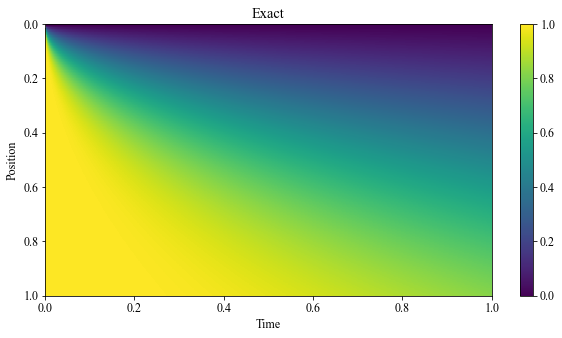

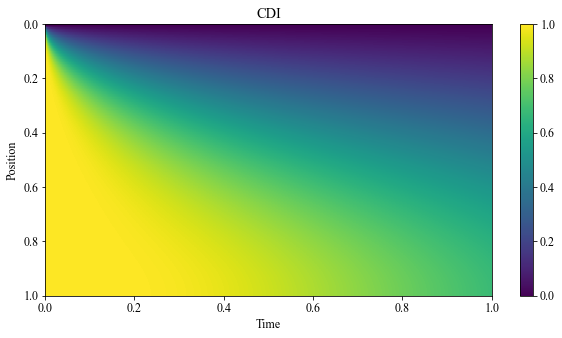

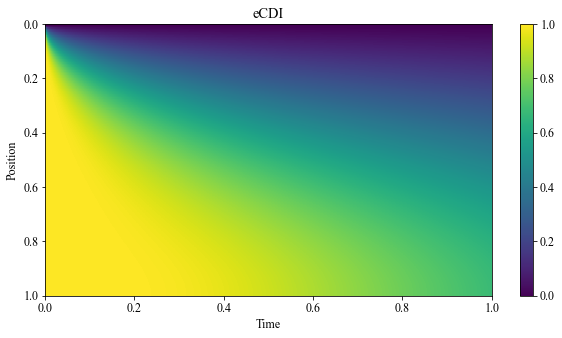

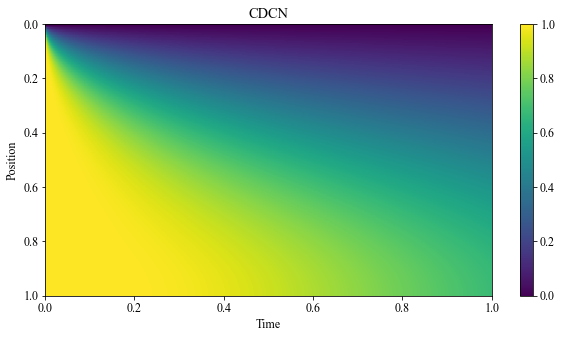

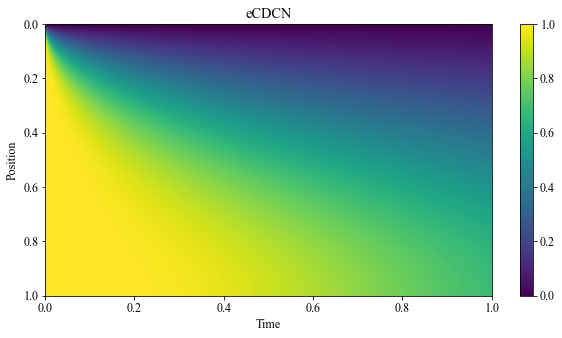

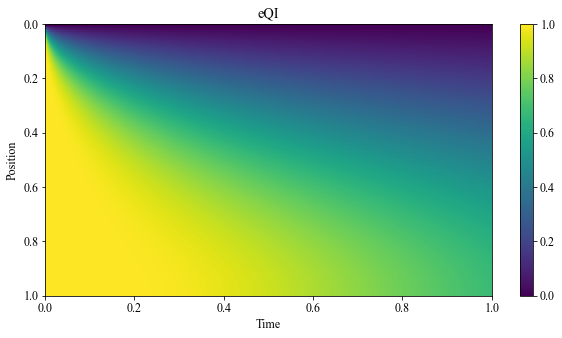

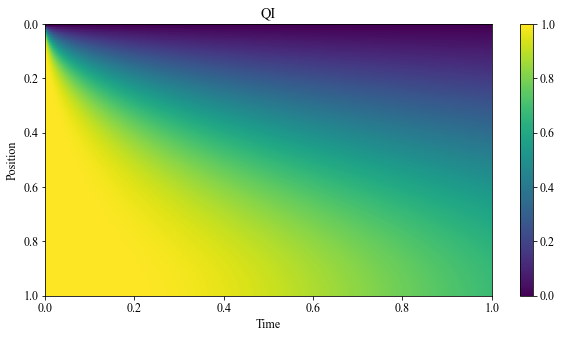

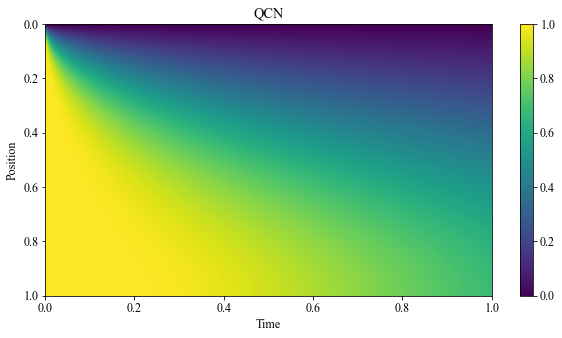

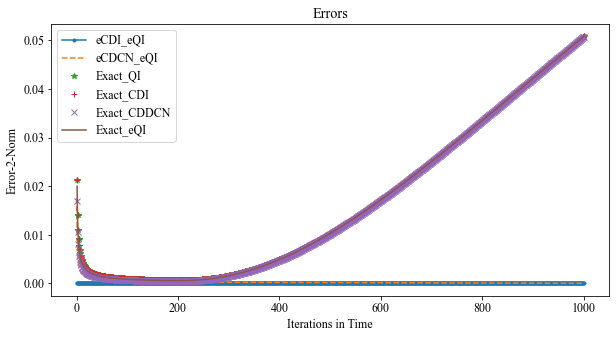

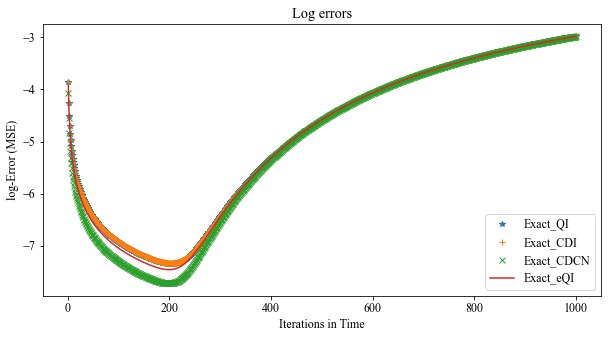

In [15]:
# Define the grid
a = -0.2;
b = 0.2;
c = 0.0;
d = 0.0;



nx = 101
nt = 1001
L = 1.0
T = 1.0
# Define x & t
x = np.linspace(0, L, nx)
t = np.linspace(0, T, nt)


# Dirichlet Boundary Condition
left = np.zeros(nt)
right = 0.5*np.ones(nt)


fig = plt.figure()  
plt.imshow(np.transpose(C), cmap='viridis', extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


# Discretization of space and time
dx = L/(nx-1)
dt = T/(nt-1)
u = np.ones(nx);
def numerical_scheme_CDI(u_CDI, dx, dt, l, r):
    alpha = a*dt/dx
    beta = b*dt/dx**2
    A = np.zeros((len(u_CDI), len(u_CDI)))
    bi = d*dt+u_CDI;

    for j in range(1, len(u_CDI)-1):

        A[j, j-1] = -(beta-alpha/2)
        A[j, j] = 1+2*beta-c*dt
        A[j, j+1] = -(beta+alpha/2)

    N = len(u_CDI)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0
    
    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r


    u_CDI = solve(A, bi)

    return u_CDI

def numerical_scheme_e_CDI(u_eCDI, dx, dt,a, b, c, d, l, r):

    frac = 0.1
    le = -np.log(1-l*frac)

    ke = -np.log(1-u_eCDI*frac)
    N = len(u_eCDI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((len(u_eCDI), len(u_eCDI)))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b
    #plt.legend()
    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    ce = -wk/(dx**2) + v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    be = -vk/(2*dx) - wk/(dx**2) - v2t*v2k/(4*(dx**2));
    ae = -u2k*np.exp(ke)/2 + 2*wk/(dx**2)

    de = np.zeros(N+1);

    for t in range(0, (N+1)):
        if(t==N):
            de[t] = ke[t];
        else:
            de[t] = ke[t]*(-u2k[t]*np.exp(ke[t])/2+1)+uk[t]+u2k[t]*np.exp(ke[t])

    bi = de;

    for j in range(1, len(u_eCDI)-1):
        A[j, j-1] = ce[j]
        A[j, j] = 1+ae[j]
        A[j, j+1] = be[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0


    bi[0] = le
    # bi[N] = r


    ke = solve(A, bi)
    u_eCDI = ((1-np.exp(-ke))/frac)
    return u_eCDI

def numerical_scheme_eCDCN(u_eCDCN, dx, dt,a, b, c, d, l, r):

    # frac = 0.1


    # ke = -np.log(1-u_eCDCN*frac)
    # N = len(u_eCDCN)-1

    # A = np.zeros((len(u_eCDCN), len(u_eCDCN)))
    # udterm = -c
    # ydterm = d
    # vdterm = -a
    # wdterm = b


    # uk = udterm*dt*np.ones(N+1); # f
    # u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    # vk = -vdterm*dt*np.ones(N+1); # a
    # v2k = -wdterm*dt*np.ones(N+1); #d
    # wk = wdterm*dt*np.ones(N+1); # b


    # v2t = np.zeros(N+1)

    # v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    # ccn = -wk/(dx**2)+ v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    # bcn = -vk/(2*dx)-wk/(dx**2)-v2t*v2k/(4*(dx**2));
    # acn = -u2k*np.exp(ke)/2 + 2*wk/((dx**2))

    # dcn = np.zeros(N+1);
    # for t in range(0, N+1):
    #     if(t==(N)):
    #         dcn[t] = ke[t];
    #     elif(t==0):
    #         dcn[t] = ke[t];
    #     else:
    #         dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDCN*frac)
    N = len(u_eCDCN)-1

    A = np.zeros((len(u_eCDCN), len(u_eCDCN)))

    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1]) 

    bcn = ((-a*dt)/(4*dx)) - ((b*dt)/(2*(dx**2))) + ((b*dt)/(8*(dx**2)))*(v2t)
    acn = ((b*dt)/(dx**2)) - ((d*frac + c)*dt*np.exp(ke)/4)
    ccn = (a*dt)/(4*dx) - ((b*dt)/(2*(dx**2))) -  ((b*dt)/(8*(dx**2)))*(v2t)

    dcn = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==(N)):
            dcn[t] = ke[t];
        elif(t==0):
            dcn[t] = ke[t];
        else:
            dcn[t] = ke[t] - c*dt + ((d*frac + c)*dt*np.exp(ke[t]))*(1-ke[t]/4)+ (1/2)*(((a*dt)/(2*dx))*(ke[t+1] - ke[t-1]) + ((b*dt)/(dx**2))*(ke[t+1]+ke[t-1]-2*ke[t]) - ((b*dt)/(4*(dx**2)))*((ke[t+1] - ke[t-1])**2))
            #dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    bi = dcn;

    for j in range(1, N):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = ccn[j]
        A[j, j] = 1+acn[j]
        A[j, j+1] = bcn[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r

    # print(A)
    ke = solve(A, bi)
    u_eCDCN = ((1-np.exp(-ke))/frac)
    return u_eCDCN

def numerical_scheme_CDCN(u_CDCN, dx, dt, l, r):
    alpha = a*dt/(4*dx)
    beta = b*dt/(2*dx**2)

    A = np.zeros((len(u_CDCN), len(u_CDCN)))

    bi = np.zeros(len(u_CDCN))
    for j in range(1, len(u_CDCN)-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = -(beta - alpha)
        A[j, j] = 1+(2*beta - c*dt/2)
        A[j, j+1] = -(beta + alpha)

        bi[j] = d*dt + u_CDCN[j]*(1-(2*beta - c*dt/2))+u_CDCN[j+1]*(alpha+beta)+u_CDCN[j-1]*(beta-alpha)

    N = len(u)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_CDCN = solve(A, bi)

    return u_CDCN

def numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, l, r):
    frac = 0.1
    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eQI*frac)
    N = len(u_eQI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((N+1, N+1))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b

    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    # yk = (bia*frac)*dt;#c+e+uk   *np.ones((1, int(N/2)+1)) #d
    v2t = np.zeros(N+1)
    # print(np.shape(v2t))
    v2t[1:N-1] = (7*ke[2:N]-3*ke[1:N-1] - ke[3:N+1] - 3*ke[0:N-2])

    v2t[N-1] = (3*ke[N]+3*ke[N-1]-7*ke[N-2]+ke[N-3])
    # v2t = (ke[1:int(N/2)+1]-ke[0:int(N/2)])
    # print(np.shape(v2t))
    #v2t = np.concatenate((v2t, v2t[0]))
    #print(np.shape(v2t))


    cq = 3*vk/(8*dx) - wk/(dx**2) + 3*v2k*v2t/((8*dx)**2)
    bq = -7*vk/(8*dx) - wk/(dx**2) - 7*v2k*v2t/((8*dx)**2)
    aq = 3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 + 3*v2k*v2t/((8*dx)**2)
    fq = vk/(8*dx) + v2k*v2t/((8*dx)**2)

    # USING LAST node Q with other side variation
    cnq = 7*vk/(8*dx) - wk/(dx**2) + 7*v2k*v2t/((8*dx)**2)
    bnq = -3*vk/(8*dx) - wk/(dx**2) - 3*v2k*v2t/((8*dx)**2)
    anq = -3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 - 3*v2k*v2t/((8*dx)**2)
    fnq = -vk/(8*dx) - v2k*v2t/((8*dx)**2)

    dq = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==N):
            dq[t] = (ke[t])#*((-u2k[0, t]*np.log(ke[t]))/2+1)+(uk[0, t])+(u2k[0, t]*np.exp(ke[t])) ; # currenty CD - I - CN terms - + (1/2)*(u2k[0, t]*np.exp(ke[t]) + 2*uk[0, t])+(ke[t+1]/2)*(vk[0, t]/(2*dx[t])+wk[0, t]/(dx[t]**2))+(v2k[0, t]/2)*(((ke[t+1]-ke[t-1])/2*dx[t])**2)+(ke[t]/2)*(1+ ((u2k[0, t]/(2*dx[t]))*np.exp(ke[t])) - (2*wk[0, t]/(dx[t]**2)))+(ke[t-1]/2)*(-vk[0, t]/(2*dx[t]) + wk[0, t]/(dx[t]**2))
        else:
            dq[t] = ke[t]*((-u2k[t]*np.exp(ke[t])/2)+1)+uk[t]+u2k[t]*np.exp(ke[t]) #(-c[t]*tau[0, t-1])+(1-b[t])*tau[0, t]-a[t]*tau[0, t+1]-e[t]*tau[0, t+2]


    bi = dq;

    for j in range(1, N-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cq[j]
        A[j, j] = 1+aq[j]
        A[j, j+1] = bq[j]
        A[j, j+2] = fq[j]


    A[N-1, N-2] = cnq[N-1] # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anq[N-1]
    A[N-1, N] = bnq[N-1]
    A[N-1, N-3] = fnq[N-1]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r


    # print(A)
    ke = solve(A, bi)
    u_eQI = ((1-np.exp(-ke))/frac)
    return u_eQI

def numerical_scheme_QI(u_QI, dx, dt, l, r):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QI), len(u_QI)))
    bi = d*dt+u_QI;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QI)-2):

        A[j, j-1] = cQ
        A[j, j] = 1+aQ
        A[j, j+1] = bQ
        A[j, j+2] = eQ

    N = len(u_QI)-1

    A[N-1, N-2] = cnQ  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ
    A[N-1, N] = bnQ
    A[N-1, N-3] = enQ


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QI = solve(A, bi)

    return u_QI


def numerical_scheme_QCN(u_QCN, dx, dt, l, r):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QCN), len(u_QCN)))
    bi = d*dt+u_QCN;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QCN)-2):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cQ/2
        A[j, j] = 1+aQ/2
        A[j, j+1] = bQ/2
        A[j, j+2] = eQ/2
        bi[j] = bi[j] - cQ*u_QCN[j-1]/2 - aQ*u_QCN[j]/2 - bQ*u_QCN[j+1]/2 - eQ*u_QCN[j+2]/2

    N = len(u_QCN)-1

    A[N-1, N-2] = cnQ/2  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ/2
    A[N-1, N] = bnQ/2
    A[N-1, N-3] = enQ/2
    bi[N-1] = bi[N-1] - cnQ*u_QCN[N-2]/2 - anQ*u_QCN[N-1]/2 - bnQ*u_QCN[N]/2 - enQ*u_QCN[N-3]/2


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QCN = solve(A, bi)

    return u_QCN


# u_init = u_exact(x, 1.0)

# Apply the numerical scheme

# U_FD = np.zeros((nx, nt))
U_CDI = np.zeros((nx, nt))
U_CDCN = np.zeros((nx, nt))
U_QI = np.zeros((nx, nt))
U_QCN = np.zeros((nx, nt))
U_eCDI = np.zeros((nx, nt))
U_eQI = np.zeros((nx, nt))

U_eCDCN = np.zeros((nx, nt))


# error_2norm_FD_CDI = np.zeros(nt)
error_2norm_CDI_CDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_CDCN_eCDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_QI_eQI = np.zeros(nt)

error_2norm_CDI_eCDI = np.zeros(nt)
error_2norm_CDI_QI = np.zeros(nt)
error_2norm_QI_QCN = np.zeros(nt)
error_2norm_CDCN_QCN = np.zeros(nt)
error_2norm_CDI_QCN = np.zeros(nt)


error_2norm_eCDCN_eCDI = np.zeros(nt)
error_2norm_eCDCN_eQI = np.zeros(nt)
error_2norm_eCDI_eQI = np.zeros(nt)

error_2norm_Qexact_QI = np.zeros(nt)
error_2norm_Qexact_eQI = np.zeros(nt)

error_2norm_Qexact_CDCN = np.zeros(nt)

error_2norm_Qexact_CDI = np.zeros(nt)
#error_2norm_FD_CDI = np.zeros(nt)


# u_FD = u;
u_CDI=u;
u_CDCN = u;
u_eQI = u;
u_eCDI = u;

u_QI=u;
u_QCN=u;
u_eCDCN=u;

for n in range(nt):
    # print(n)
    # u_FD = numerical_scheme(u_FD, dx, dt)
    # #print(u)
    # #print(str(n*dt)+" "+str(max(u)))
    # U_FD[:, n] = u_FD
    u_CDI = numerical_scheme_CDI(u_CDI, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDI[:, n] = u_CDI

    #error = u_FD - u_CDI
    #error_2norm_FD_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)




    u_eCDI = numerical_scheme_e_CDI(u_eCDI, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDI[:, n] = u_eCDI

    error = u_CDI - u_eCDI
    error_2norm_CDI_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_CDCN = numerical_scheme_CDCN(u_CDCN, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDCN[:, n] = u_CDCN
    error = u_CDI - u_CDCN
    error_2norm_CDI_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    u_eCDCN = numerical_scheme_eCDCN(u_eCDCN, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDCN[:, n] = u_eCDCN
    error = u_CDCN - u_eCDCN
    error_2norm_CDCN_eCDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QI = numerical_scheme_QI(u_QI, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QI[:, n] = u_QI
    error = u_CDCN - u_QI
    error_2norm_CDCN_QI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QI
    error_2norm_CDI_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_eQI = numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eQI[:, n] = u_eQI

    error = u_QI - u_eQI
    error_2norm_QI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDI - u_eQI
    error_2norm_eCDI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eQI
    error_2norm_eCDCN_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eCDI
    error_2norm_eCDCN_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QCN = numerical_scheme_QCN(u_QCN, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QCN[:, n] = u_QCN
    error = u_CDCN - u_QCN
    error_2norm_CDCN_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QCN
    error_2norm_CDI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_QI - u_QCN
    error_2norm_QI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    # Comparing with the exact solution
    error = U_exact[:, n] - u_QI
    error_2norm_Qexact_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDCN
    error_2norm_Qexact_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDI
    error_2norm_Qexact_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)
    
    error = U_exact[:, n] - u_eQI
    error_2norm_Qexact_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
# fig = plt.figure()  
# plt.imshow(U_FD, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
# plt.colorbar()
# plt.title("FD")
# plt.xlabel('Time')
# plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_FD.png', dpi = 900)
# plt.show()

fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_CDI, cmap='viridis', extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("CDI")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_eCDI, cmap='viridis', extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("eCDI")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eCDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_CDCN, cmap='viridis', extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("CDCN")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_eCDCN, cmap='viridis', extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("eCDCN")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_eQI, cmap='viridis', extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("eQI")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eQI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_QI, cmap='viridis', extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("QI")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_QI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_QCN, cmap='viridis', extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("QCN")
plt.xlabel('Time')
plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_QCN.png', dpi = 900)
plt.show()



fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
#plt.plot(error_2norm_CDI_CDCN, '-+', label = 'CDI_CDCN')
#plt.plot(error_2norm_CDCN_QI,'-*', label = 'CDCN_QI')
#plt.plot(error_2norm_CDI_QI, '--' ,label = 'CDI_QI')
#plt.plot(error_2norm_CDI_eCDI, '+' ,label = 'CDI_eCDI')
#plt.plot(error_2norm_CDCN_eCDCN, 'x' ,label = 'CDCN_eCDCN')

#plt.plot(error_2norm_QI_QCN, '-', label = 'QI_QCN')
#plt.plot(error_2norm_CDCN_QCN, '.', label='CDCN_QCN')
#plt.plot(error_2norm_QI_eQI, 'o', label='QI_eQI')
plt.plot(error_2norm_eCDI_eQI, '.-', label='eCDI_eQI')
plt.plot(error_2norm_eCDCN_eQI, '--', label='eCDCN_eQI')
#plt.plot(error_2norm_eCDCN_eCDI, '.', label='eCDCN_eCDI')

plt.plot(error_2norm_Qexact_QI, '*', label = 'Exact_QI')


plt.plot(error_2norm_Qexact_CDI, '+', label = 'Exact_CDI')
plt.plot(error_2norm_Qexact_CDCN, 'x', label = 'Exact_CDDCN')

plt.plot(error_2norm_Qexact_eQI, '-', label = 'Exact_eQI')
plt.title("Errors")
plt.legend(loc='best')
plt.xlabel('Iterations in Time')
plt.ylabel('Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Error_Norm.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc= 'best')
plt.title("Log errors")
plt.xlabel('Iterations in Time')
plt.ylabel('log-Error (MSE)')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
plt.show()


#fig = plt.figure() 
#plt.plot(U_exact[:, -1], '-+',label = 'U_exact')
#plt.plot(U_CDI[:, -1], '-*',label = 'U_CDI')
#plt.legend()
#plt.title("Comparison of U_exact and U_CDI")
#plt.xlabel('Length')
#plt.ylabel('U')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
#plt.show()


Text(0.5, 1.0, 'At 0.5 seconds - Pe = 100')

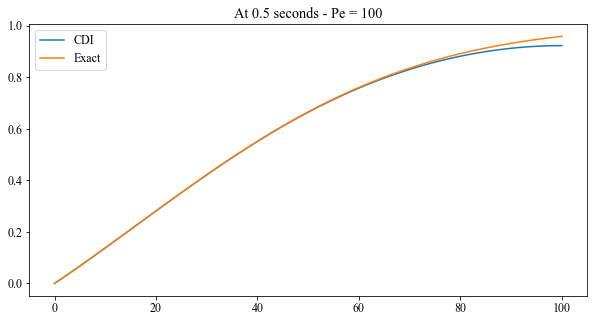

In [16]:
plt.plot(U_CDI[:, -500], label='CDI'); plt.plot(U_exact[:, -500], label='Exact'); plt.legend(); plt.title("At 0.5 seconds - Pe = 100")

The right-hand side boundary condition that is applied in simulated code, but it doesn't show in the analytical solution. 

# Second attempt with lower values of a and b

<ipython-input-17-c6b7e980f704>:28: RuntimeWarning: invalid value encountered in double_scalars
  C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))
<ipython-input-17-c6b7e980f704>:28: RuntimeWarning: divide by zero encountered in double_scalars
  C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))


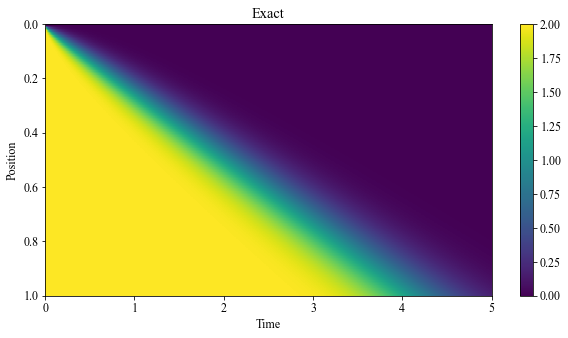

In [17]:
# Analytical - du/dt = -v*du/dx+D*d2u/dx2

# with Initial Condition - C(x, 0) = Ci and BCs C(0, t) = Co and C(inf, t) = 0
# C(x, t) = ((Co-Ci)/2)*(erfc(x-vt)/(2sqrt(Dt/R))+exp(vx/(D/R))*erfc((x+vt)/(2*sqrt(Dt/R))))

# Ci = 1 mol/L; Co = 0 mol/L; R =1; D = 0.0048 m2/day; v = 0.24/m/day

Ci = 2; 
Co = 0
Cinf = 0;
R = 1; 
D = 0.0024
v = 0.24

nx = 101;
nt = 1001;

L = 1;
T = 5.0;

x = np.linspace(0, L, nx);
t = np.linspace(0, T, nt);


C = np.zeros((nt, nx))
for i in range(nt):  
    for j in range(nx):      
        C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))

fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()



U_exact = np.transpose(C);

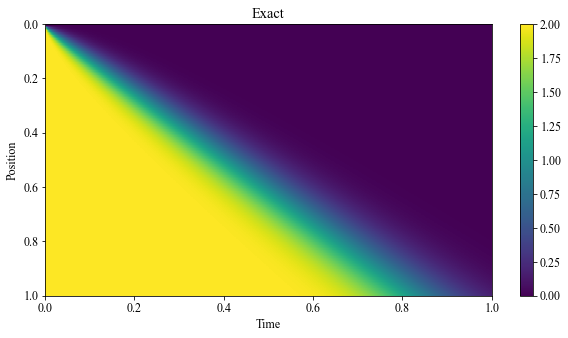

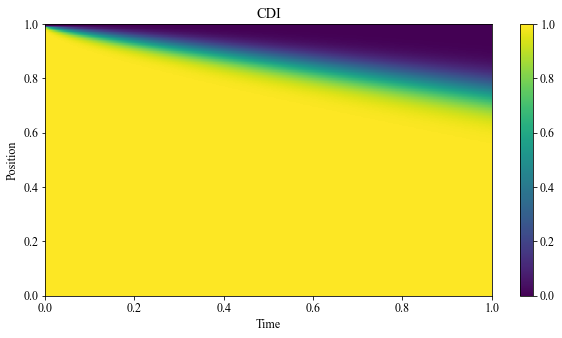

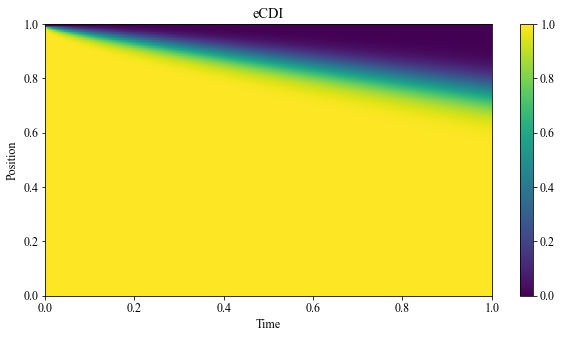

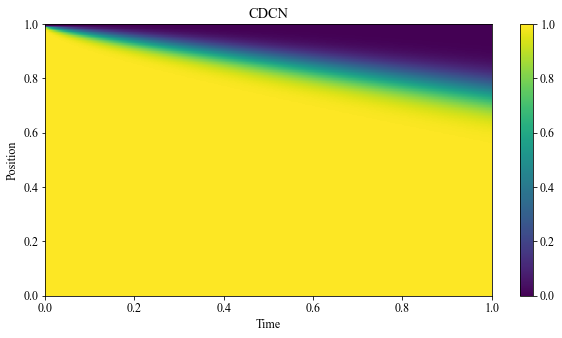

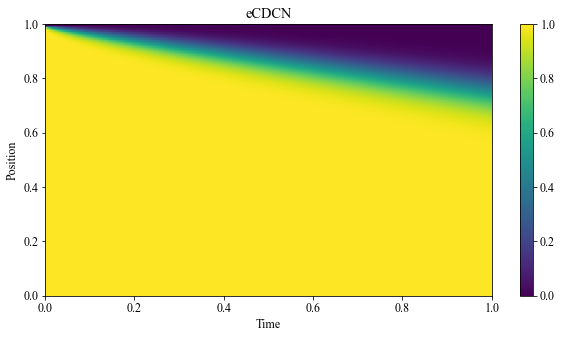

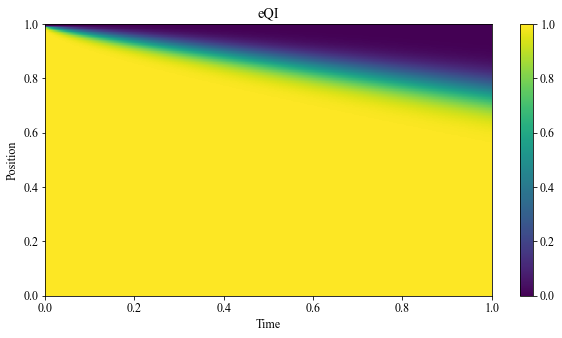

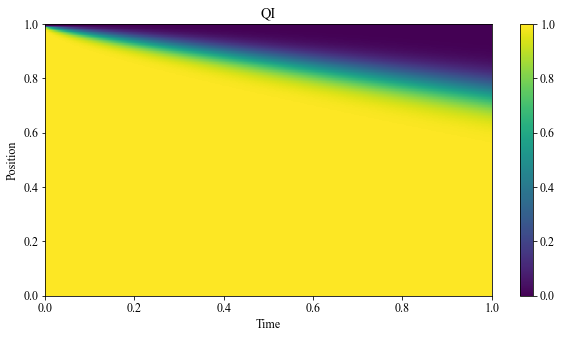

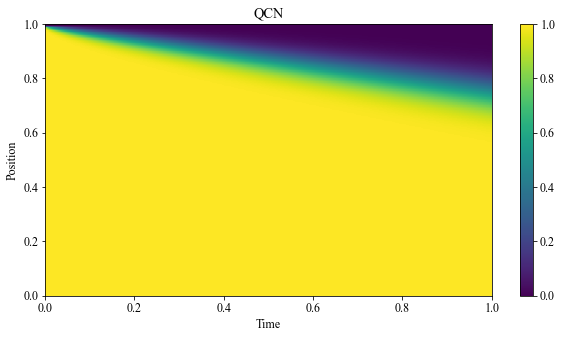

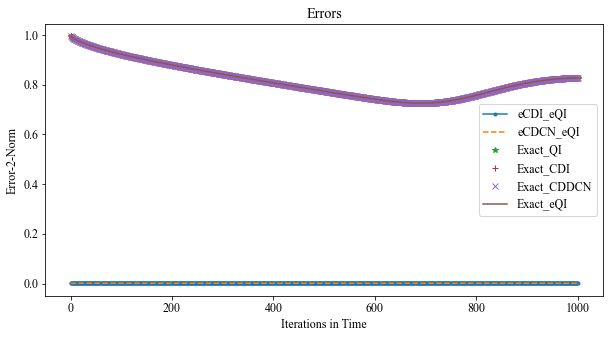

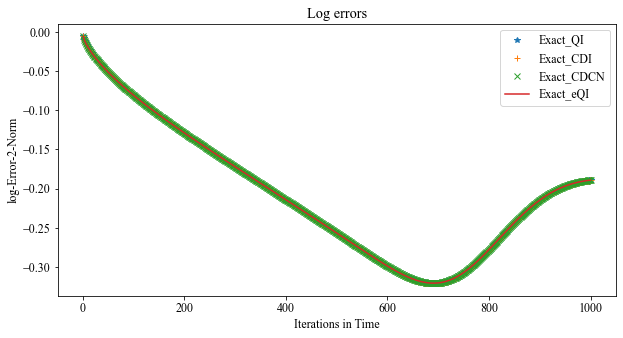

In [18]:
# Define the grid
a = -0.24;
b = 0.0024;
c = 0.0;
d = 0.0;



nx = 101
nt = 1001
L = 1.0
T = 1.0
# Define x & t
x = np.linspace(0, L, nx)
t = np.linspace(0, T, nt)


# Dirichlet Boundary Condition
left = np.zeros(nt)
right = np.ones(nt)

fig = plt.figure()  
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


# Discretization of space and time
dx = L/(nx-1)
dt = T/(nt-1)
u = np.ones(nx);
def numerical_scheme_CDI(u_CDI, dx, dt, l, r):
    alpha = a*dt/dx
    beta = b*dt/dx**2
    A = np.zeros((len(u_CDI), len(u_CDI)))
    bi = d*dt+u_CDI;

    for j in range(1, len(u_CDI)-1):

        A[j, j-1] = -(beta-alpha/2)
        A[j, j] = 1+2*beta-c*dt
        A[j, j+1] = -(beta+alpha/2)

    N = len(u_CDI)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0
    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r


    u_CDI = solve(A, bi)

    return u_CDI

def numerical_scheme_e_CDI(u_eCDI, dx, dt,a, b, c, d, l, r):

    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDI*frac)
    N = len(u_eCDI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((len(u_eCDI), len(u_eCDI)))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b
    #plt.legend()
    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    ce = -wk/(dx**2) + v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    be = -vk/(2*dx) - wk/(dx**2) - v2t*v2k/(4*(dx**2));
    ae = -u2k*np.exp(ke)/2 + 2*wk/(dx**2)

    de = np.zeros(N+1);

    for t in range(0, (N+1)):
        if(t==N):
            de[t] = ke[t];
        else:
            de[t] = ke[t]*(-u2k[t]*np.exp(ke[t])/2+1)+uk[t]+u2k[t]*np.exp(ke[t])

    bi = de;

    for j in range(1, len(u_eCDI)-1):
        A[j, j-1] = ce[j]
        A[j, j] = 1+ae[j]
        A[j, j+1] = be[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0


    bi[0] = l
    # bi[N] = r


    ke = solve(A, bi)
    u_eCDI = ((1-np.exp(-ke))/frac)
    return u_eCDI

def numerical_scheme_eCDCN(u_eCDCN, dx, dt,a, b, c, d, l, r):

    # frac = 0.1


    # ke = -np.log(1-u_eCDCN*frac)
    # N = len(u_eCDCN)-1

    # A = np.zeros((len(u_eCDCN), len(u_eCDCN)))
    # udterm = -c
    # ydterm = d
    # vdterm = -a
    # wdterm = b


    # uk = udterm*dt*np.ones(N+1); # f
    # u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    # vk = -vdterm*dt*np.ones(N+1); # a
    # v2k = -wdterm*dt*np.ones(N+1); #d
    # wk = wdterm*dt*np.ones(N+1); # b


    # v2t = np.zeros(N+1)

    # v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    # ccn = -wk/(dx**2)+ v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    # bcn = -vk/(2*dx)-wk/(dx**2)-v2t*v2k/(4*(dx**2));
    # acn = -u2k*np.exp(ke)/2 + 2*wk/((dx**2))

    # dcn = np.zeros(N+1);
    # for t in range(0, N+1):
    #     if(t==(N)):
    #         dcn[t] = ke[t];
    #     elif(t==0):
    #         dcn[t] = ke[t];
    #     else:
    #         dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDCN*frac)
    N = len(u_eCDCN)-1

    A = np.zeros((len(u_eCDCN), len(u_eCDCN)))

    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1]) 

    bcn = ((-a*dt)/(4*dx)) - ((b*dt)/(2*(dx**2))) + ((b*dt)/(8*(dx**2)))*(v2t)
    acn = ((b*dt)/(dx**2)) - ((d*frac + c)*dt*np.exp(ke)/4)
    ccn = (a*dt)/(4*dx) - ((b*dt)/(2*(dx**2))) -  ((b*dt)/(8*(dx**2)))*(v2t)

    dcn = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==(N)):
            dcn[t] = ke[t];
        elif(t==0):
            dcn[t] = ke[t];
        else:
            dcn[t] = ke[t] - c*dt + ((d*frac + c)*dt*np.exp(ke[t]))*(1-ke[t]/4)+ (1/2)*(((a*dt)/(2*dx))*(ke[t+1] - ke[t-1]) + ((b*dt)/(dx**2))*(ke[t+1]+ke[t-1]-2*ke[t]) - ((b*dt)/(4*(dx**2)))*((ke[t+1] - ke[t-1])**2))
            #dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    bi = dcn;

    for j in range(1, N):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = ccn[j]
        A[j, j] = 1+acn[j]
        A[j, j+1] = bcn[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r

    # print(A)
    ke = solve(A, bi)
    u_eCDCN = ((1-np.exp(-ke))/frac)
    return u_eCDCN

def numerical_scheme_CDCN(u_CDCN, dx, dt, l, r):
    alpha = a*dt/(4*dx)
    beta = b*dt/(2*dx**2)

    A = np.zeros((len(u_CDCN), len(u_CDCN)))

    bi = np.zeros(len(u_CDCN))
    for j in range(1, len(u_CDCN)-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = -(beta - alpha)
        A[j, j] = 1+(2*beta - c*dt/2)
        A[j, j+1] = -(beta + alpha)

        bi[j] = d*dt + u_CDCN[j]*(1-(2*beta - c*dt/2))+u_CDCN[j+1]*(alpha+beta)+u_CDCN[j-1]*(beta-alpha)

    N = len(u)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_CDCN = solve(A, bi)

    return u_CDCN

def numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, l, r):
    frac = 0.1
    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eQI*frac)
    N = len(u_eQI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((N+1, N+1))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b

    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    # yk = (bia*frac)*dt;#c+e+uk   *np.ones((1, int(N/2)+1)) #d
    v2t = np.zeros(N+1)
    # print(np.shape(v2t))
    v2t[1:N-1] = (7*ke[2:N]-3*ke[1:N-1] - ke[3:N+1] - 3*ke[0:N-2])

    v2t[N-1] = (3*ke[N]+3*ke[N-1]-7*ke[N-2]+ke[N-3])
    # v2t = (ke[1:int(N/2)+1]-ke[0:int(N/2)])
    # print(np.shape(v2t))
    #v2t = np.concatenate((v2t, v2t[0]))
    #print(np.shape(v2t))


    cq = 3*vk/(8*dx) - wk/(dx**2) + 3*v2k*v2t/((8*dx)**2)
    bq = -7*vk/(8*dx) - wk/(dx**2) - 7*v2k*v2t/((8*dx)**2)
    aq = 3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 + 3*v2k*v2t/((8*dx)**2)
    fq = vk/(8*dx) + v2k*v2t/((8*dx)**2)

    # USING LAST node Q with other side variation
    cnq = 7*vk/(8*dx) - wk/(dx**2) + 7*v2k*v2t/((8*dx)**2)
    bnq = -3*vk/(8*dx) - wk/(dx**2) - 3*v2k*v2t/((8*dx)**2)
    anq = -3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 - 3*v2k*v2t/((8*dx)**2)
    fnq = -vk/(8*dx) - v2k*v2t/((8*dx)**2)

    dq = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==N):
            dq[t] = (ke[t])#*((-u2k[0, t]*np.log(ke[t]))/2+1)+(uk[0, t])+(u2k[0, t]*np.exp(ke[t])) ; # currenty CD - I - CN terms - + (1/2)*(u2k[0, t]*np.exp(ke[t]) + 2*uk[0, t])+(ke[t+1]/2)*(vk[0, t]/(2*dx[t])+wk[0, t]/(dx[t]**2))+(v2k[0, t]/2)*(((ke[t+1]-ke[t-1])/2*dx[t])**2)+(ke[t]/2)*(1+ ((u2k[0, t]/(2*dx[t]))*np.exp(ke[t])) - (2*wk[0, t]/(dx[t]**2)))+(ke[t-1]/2)*(-vk[0, t]/(2*dx[t]) + wk[0, t]/(dx[t]**2))
        else:
            dq[t] = ke[t]*((-u2k[t]*np.exp(ke[t])/2)+1)+uk[t]+u2k[t]*np.exp(ke[t]) #(-c[t]*tau[0, t-1])+(1-b[t])*tau[0, t]-a[t]*tau[0, t+1]-e[t]*tau[0, t+2]


    bi = dq;

    for j in range(1, N-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cq[j]
        A[j, j] = 1+aq[j]
        A[j, j+1] = bq[j]
        A[j, j+2] = fq[j]


    A[N-1, N-2] = cnq[N-1] # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anq[N-1]
    A[N-1, N] = bnq[N-1]
    A[N-1, N-3] = fnq[N-1]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r


    # print(A)
    ke = solve(A, bi)
    u_eQI = ((1-np.exp(-ke))/frac)
    return u_eQI

def numerical_scheme_QI(u_QI, dx, dt, l, r):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QI), len(u_QI)))
    bi = d*dt+u_QI;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QI)-2):

        A[j, j-1] = cQ
        A[j, j] = 1+aQ
        A[j, j+1] = bQ
        A[j, j+2] = eQ

    N = len(u_QI)-1

    A[N-1, N-2] = cnQ  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ
    A[N-1, N] = bnQ
    A[N-1, N-3] = enQ


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QI = solve(A, bi)

    return u_QI


def numerical_scheme_QCN(u_QCN, dx, dt, l, r):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QCN), len(u_QCN)))
    bi = d*dt+u_QCN;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QCN)-2):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cQ/2
        A[j, j] = 1+aQ/2
        A[j, j+1] = bQ/2
        A[j, j+2] = eQ/2
        bi[j] = bi[j] - cQ*u_QCN[j-1]/2 - aQ*u_QCN[j]/2 - bQ*u_QCN[j+1]/2 - eQ*u_QCN[j+2]/2

    N = len(u_QCN)-1

    A[N-1, N-2] = cnQ/2  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ/2
    A[N-1, N] = bnQ/2
    A[N-1, N-3] = enQ/2
    bi[N-1] = bi[N-1] - cnQ*u_QCN[N-2]/2 - anQ*u_QCN[N-1]/2 - bnQ*u_QCN[N]/2 - enQ*u_QCN[N-3]/2


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QCN = solve(A, bi)

    return u_QCN


# u_init = u_exact(x, 1.0)

# Apply the numerical scheme

# U_FD = np.zeros((nx, nt))
U_CDI = np.zeros((nx, nt))
U_CDCN = np.zeros((nx, nt))
U_QI = np.zeros((nx, nt))
U_QCN = np.zeros((nx, nt))
U_eCDI = np.zeros((nx, nt))
U_eQI = np.zeros((nx, nt))

U_eCDCN = np.zeros((nx, nt))


# error_2norm_FD_CDI = np.zeros(nt)
error_2norm_CDI_CDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_CDCN_eCDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_QI_eQI = np.zeros(nt)

error_2norm_CDI_eCDI = np.zeros(nt)
error_2norm_CDI_QI = np.zeros(nt)
error_2norm_QI_QCN = np.zeros(nt)
error_2norm_CDCN_QCN = np.zeros(nt)
error_2norm_CDI_QCN = np.zeros(nt)


error_2norm_eCDCN_eCDI = np.zeros(nt)
error_2norm_eCDCN_eQI = np.zeros(nt)
error_2norm_eCDI_eQI = np.zeros(nt)

error_2norm_Qexact_QI = np.zeros(nt)
error_2norm_Qexact_eQI = np.zeros(nt)

error_2norm_Qexact_CDCN = np.zeros(nt)

error_2norm_Qexact_CDI = np.zeros(nt)
#error_2norm_FD_CDI = np.zeros(nt)


# u_FD = u;
u_CDI=u;
u_CDCN = u;
u_eQI = u;
u_eCDI = u;

u_QI=u;
u_QCN=u;
u_eCDCN=u;

for n in range(nt):
    # print(n)
    # u_FD = numerical_scheme(u_FD, dx, dt)
    # #print(u)
    # #print(str(n*dt)+" "+str(max(u)))
    # U_FD[:, n] = u_FD
    u_CDI = numerical_scheme_CDI(u_CDI, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDI[:, n] = u_CDI

    #error = u_FD - u_CDI
    #error_2norm_FD_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)




    u_eCDI = numerical_scheme_e_CDI(u_eCDI, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDI[:, n] = u_eCDI

    error = u_CDI - u_eCDI
    error_2norm_CDI_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_CDCN = numerical_scheme_CDCN(u_CDCN, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDCN[:, n] = u_CDCN
    error = u_CDI - u_CDCN
    error_2norm_CDI_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    u_eCDCN = numerical_scheme_eCDCN(u_eCDCN, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDCN[:, n] = u_eCDCN
    error = u_CDCN - u_eCDCN
    error_2norm_CDCN_eCDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QI = numerical_scheme_QI(u_QI, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QI[:, n] = u_QI
    error = u_CDCN - u_QI
    error_2norm_CDCN_QI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QI
    error_2norm_CDI_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_eQI = numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eQI[:, n] = u_eQI

    error = u_QI - u_eQI
    error_2norm_QI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDI - u_eQI
    error_2norm_eCDI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eQI
    error_2norm_eCDCN_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eCDI
    error_2norm_eCDCN_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QCN = numerical_scheme_QCN(u_QCN, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QCN[:, n] = u_QCN
    error = u_CDCN - u_QCN
    error_2norm_CDCN_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QCN
    error_2norm_CDI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_QI - u_QCN
    error_2norm_QI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    # Comparing with the exact solution
    error = U_exact[:, n] - u_QI
    error_2norm_Qexact_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDCN
    error_2norm_Qexact_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDI
    error_2norm_Qexact_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)
    
    error = U_exact[:, n] - u_eQI
    error_2norm_Qexact_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    

# fig = plt.figure()  
# plt.imshow(U_FD, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
# plt.colorbar()
# plt.title("FD")
# plt.xlabel('Time')
# plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_FD.png', dpi = 900)
# plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_CDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDI")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_eCDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDI")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eCDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_CDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDCN")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_eCDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDCN")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.imshow(U_eQI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eQI")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eQI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_QI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QI")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_QI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_QCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QCN")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_QCN.png', dpi = 900)
plt.show()



fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
#plt.plot(error_2norm_CDI_CDCN, '-+', label = 'CDI_CDCN')
#plt.plot(error_2norm_CDCN_QI,'-*', label = 'CDCN_QI')
#plt.plot(error_2norm_CDI_QI, '--' ,label = 'CDI_QI')
#plt.plot(error_2norm_CDI_eCDI, '+' ,label = 'CDI_eCDI')
#plt.plot(error_2norm_CDCN_eCDCN, 'x' ,label = 'CDCN_eCDCN')

#plt.plot(error_2norm_QI_QCN, '-', label = 'QI_QCN')
#plt.plot(error_2norm_CDCN_QCN, '.', label='CDCN_QCN')
#plt.plot(error_2norm_QI_eQI, 'o', label='QI_eQI')
plt.plot(error_2norm_eCDI_eQI, '.-', label='eCDI_eQI')
plt.plot(error_2norm_eCDCN_eQI, '--', label='eCDCN_eQI')
#plt.plot(error_2norm_eCDCN_eCDI, '.', label='eCDCN_eCDI')

plt.plot(error_2norm_Qexact_QI, '*', label = 'Exact_QI')


plt.plot(error_2norm_Qexact_CDI, '+', label = 'Exact_CDI')
plt.plot(error_2norm_Qexact_CDCN, 'x', label = 'Exact_CDDCN')

plt.plot(error_2norm_Qexact_eQI, '-', label = 'Exact_eQI')
plt.title("Errors")
plt.legend(loc='best')
plt.xlabel('Iterations in Time')
plt.ylabel('Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Error_Norm.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log errors")
plt.xlabel('Iterations in Time')
plt.ylabel('log-Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
plt.show()


#fig = plt.figure() 
#plt.plot(U_exact[:, -1], '-+',label = 'U_exact')
#plt.plot(U_CDI[:, -1], '-*',label = 'U_CDI')
#plt.legend()
#plt.title("Comparison of U_exact and U_CDI")
#plt.xlabel('Length')
#plt.ylabel('U')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
#plt.show()


Text(0.5, 1.0, 'At 0.5 seconds - Pe = 100')

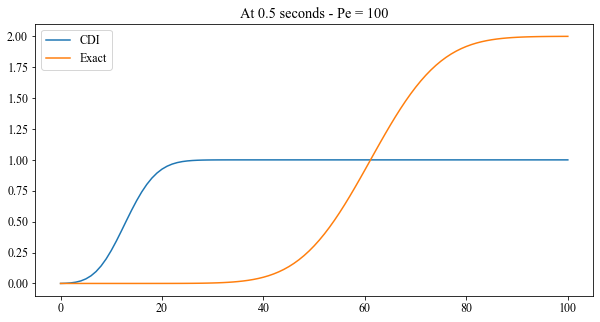

In [19]:
plt.plot(U_CDI[:, -500], label='CDI'); plt.plot(U_exact[:, -500], label='Exact'); plt.legend(); plt.title("At 0.5 seconds - Pe = 100")

Here the accuracy is better, as the values end at 1. 

# This shows a very good accuracy with Pe = 100. This is without any first order or source terms. 

## This is the other way around starting with C_i = 0 and C_o = 2

<ipython-input-8-e965879a5486>:28: RuntimeWarning: invalid value encountered in double_scalars
  C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))
<ipython-input-8-e965879a5486>:28: RuntimeWarning: divide by zero encountered in double_scalars
  C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))


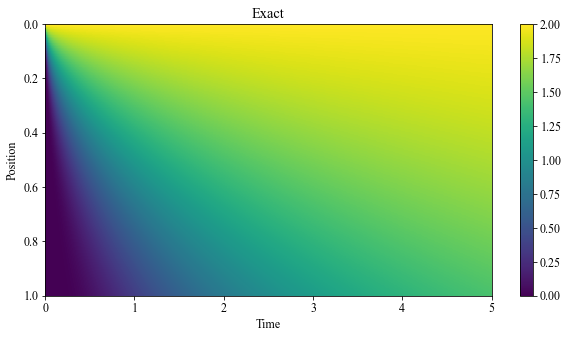

In [8]:
# Analytical - du/dt = -v*du/dx+D*d2u/dx2

# with Initial Condition - C(x, 0) = Ci and BCs C(0, t) = Co and C(inf, t) = 0
# C(x, t) = ((Co-Ci)/2)*(erfc(x-vt)/(2sqrt(Dt/R))+exp(vx/(D/R))*erfc((x+vt)/(2*sqrt(Dt/R))))
# Ci = 0 mol/L; Co = 1.2 mol/L; R =1; D = 0.0048 m2/day; v = 0.24/m/day


Ci = 0; 
Co = 2;
Cinf = 0;
R = 1; 
D = 0.2
v = 0.2

nx = 101;
nt = 5001;

L = 1;
T = 5;

x = np.linspace(0, L, nx);
t = np.linspace(0, T, nt);


C = np.zeros((nt, nx))
for i in range(nt):  
    for j in range(nx):      
        C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))

U_exact = np.transpose(C);

fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()

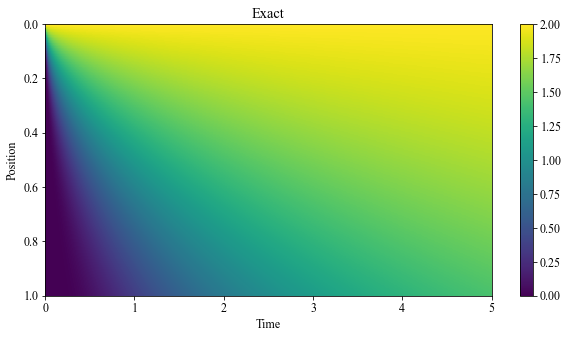

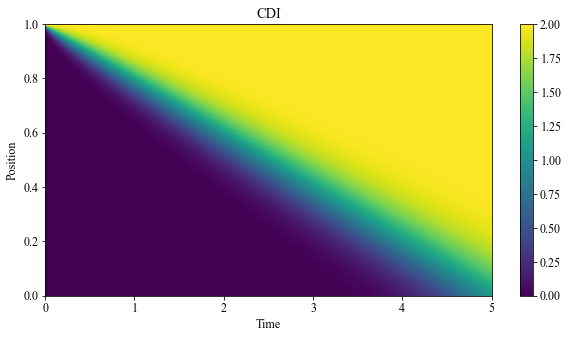

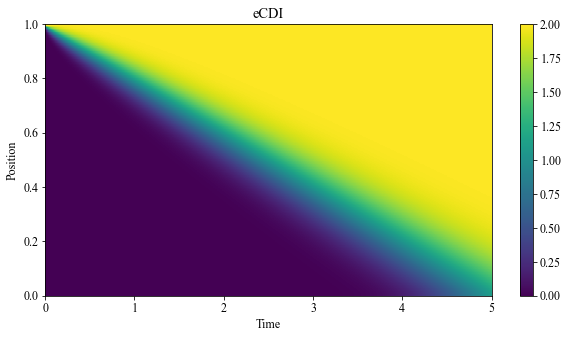

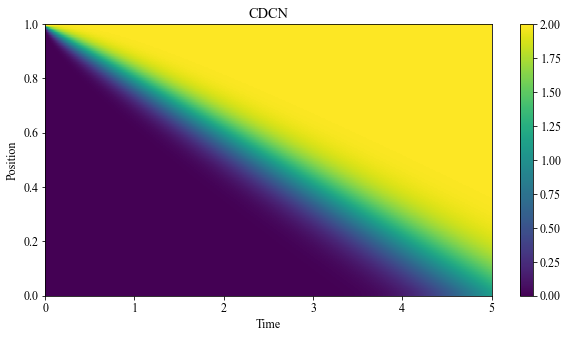

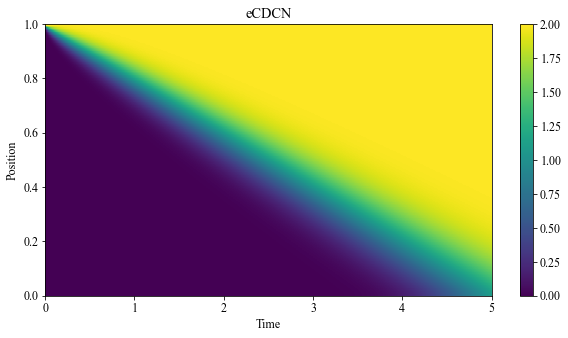

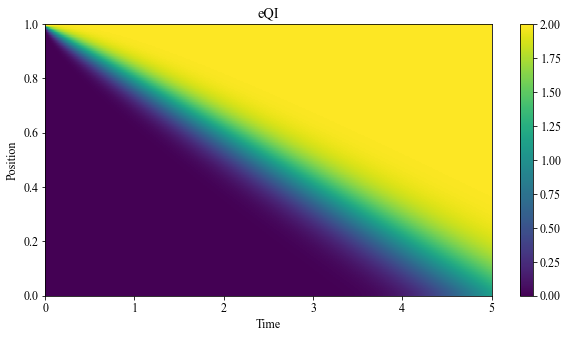

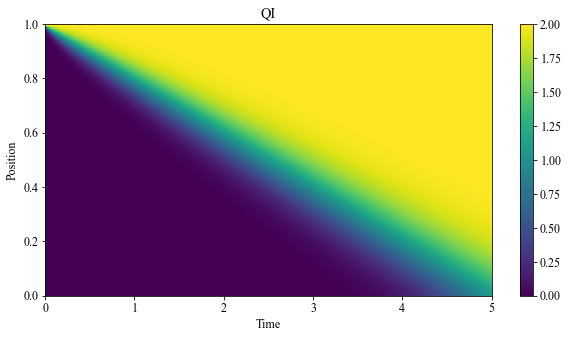

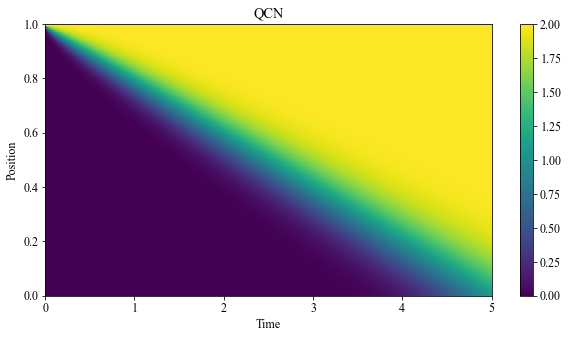

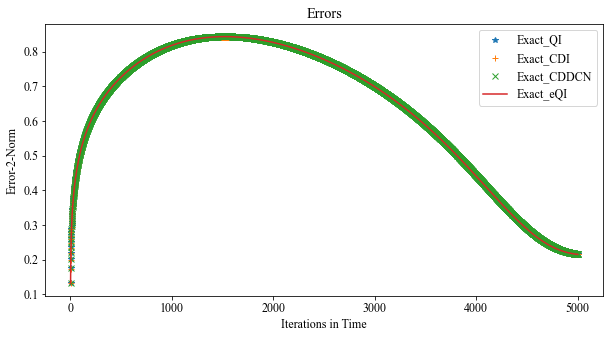

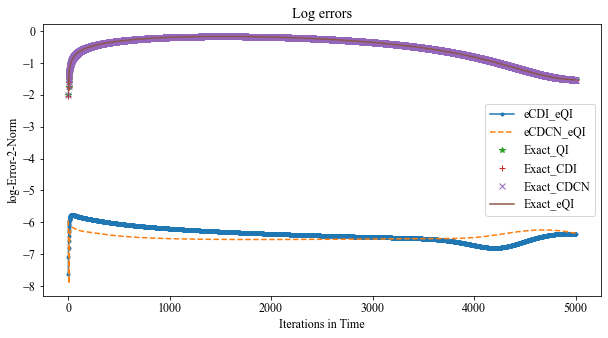

In [9]:
# Define the grid
a = -0.2;
b = 0.002;
c = 0.0;
d = 0.0;



nx = 101
nt = 5001
L = 1.0
T = 5.0
# Define x & t
x = np.linspace(0, L, nx)
t = np.linspace(0, T, nt)


# Dirichlet Boundary Condition
left = 2.0*np.ones(nt)
right = np.zeros(nt)

fig = plt.figure()  
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


# Discretization of space and time
dx = L/(nx-1)
dt = T/(nt-1)
u = np.zeros(nx);
def numerical_scheme_CDI(u_CDI, dx, dt, l, r):
    alpha = a*dt/dx
    beta = b*dt/dx**2
    A = np.zeros((len(u_CDI), len(u_CDI)))
    bi = d*dt+u_CDI;

    for j in range(1, len(u_CDI)-1):

        A[j, j-1] = -(beta-alpha/2)
        A[j, j] = 1+2*beta-c*dt
        A[j, j+1] = -(beta+alpha/2)

    N = len(u_CDI)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0
    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r


    u_CDI = solve(A, bi)

    return u_CDI

def numerical_scheme_e_CDI(u_eCDI, dx, dt,a, b, c, d, l, r):

    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDI*frac)
    N = len(u_eCDI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((len(u_eCDI), len(u_eCDI)))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b
    #plt.legend()
    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    ce = -wk/(dx**2) + v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    be = -vk/(2*dx) - wk/(dx**2) - v2t*v2k/(4*(dx**2));
    ae = -u2k*np.exp(ke)/2 + 2*wk/(dx**2)

    de = np.zeros(N+1);

    for t in range(0, (N+1)):
        if(t==N):
            de[t] = ke[t];
        else:
            de[t] = ke[t]*(-u2k[t]*np.exp(ke[t])/2+1)+uk[t]+u2k[t]*np.exp(ke[t])

    bi = de;

    for j in range(1, len(u_eCDI)-1):
        A[j, j-1] = ce[j]
        A[j, j] = 1+ae[j]
        A[j, j+1] = be[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0


    bi[0] = le
    # bi[N] = r


    ke = solve(A, bi)
    u_eCDI = ((1-np.exp(-ke))/frac)
    return u_eCDI

def numerical_scheme_eCDCN(u_eCDCN, dx, dt,a, b, c, d, l, r):

    # frac = 0.1


    # ke = -np.log(1-u_eCDCN*frac)
    # N = len(u_eCDCN)-1

    # A = np.zeros((len(u_eCDCN), len(u_eCDCN)))
    # udterm = -c
    # ydterm = d
    # vdterm = -a
    # wdterm = b


    # uk = udterm*dt*np.ones(N+1); # f
    # u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    # vk = -vdterm*dt*np.ones(N+1); # a
    # v2k = -wdterm*dt*np.ones(N+1); #d
    # wk = wdterm*dt*np.ones(N+1); # b


    # v2t = np.zeros(N+1)

    # v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    # ccn = -wk/(dx**2)+ v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    # bcn = -vk/(2*dx)-wk/(dx**2)-v2t*v2k/(4*(dx**2));
    # acn = -u2k*np.exp(ke)/2 + 2*wk/((dx**2))

    # dcn = np.zeros(N+1);
    # for t in range(0, N+1):
    #     if(t==(N)):
    #         dcn[t] = ke[t];
    #     elif(t==0):
    #         dcn[t] = ke[t];
    #     else:
    #         dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDCN*frac)
    N = len(u_eCDCN)-1

    A = np.zeros((len(u_eCDCN), len(u_eCDCN)))

    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1]) 

    bcn = ((-a*dt)/(4*dx)) - ((b*dt)/(2*(dx**2))) + ((b*dt)/(8*(dx**2)))*(v2t)
    acn = ((b*dt)/(dx**2)) - ((d*frac + c)*dt*np.exp(ke)/4)
    ccn = (a*dt)/(4*dx) - ((b*dt)/(2*(dx**2))) -  ((b*dt)/(8*(dx**2)))*(v2t)

    dcn = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==(N)):
            dcn[t] = ke[t];
        elif(t==0):
            dcn[t] = ke[t];
        else:
            dcn[t] = ke[t] - c*dt + ((d*frac + c)*dt*np.exp(ke[t]))*(1-ke[t]/4)+ (1/2)*(((a*dt)/(2*dx))*(ke[t+1] - ke[t-1]) + ((b*dt)/(dx**2))*(ke[t+1]+ke[t-1]-2*ke[t]) - ((b*dt)/(4*(dx**2)))*((ke[t+1] - ke[t-1])**2))
            #dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    bi = dcn;

    for j in range(1, N):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = ccn[j]
        A[j, j] = 1+acn[j]
        A[j, j+1] = bcn[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r

    # print(A)
    ke = solve(A, bi)
    u_eCDCN = ((1-np.exp(-ke))/frac)
    return u_eCDCN

def numerical_scheme_CDCN(u_CDCN, dx, dt, l, r):
    alpha = a*dt/(4*dx)
    beta = b*dt/(2*dx**2)

    A = np.zeros((len(u_CDCN), len(u_CDCN)))

    bi = np.zeros(len(u_CDCN))
    for j in range(1, len(u_CDCN)-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = -(beta - alpha)
        A[j, j] = 1+(2*beta - c*dt/2)
        A[j, j+1] = -(beta + alpha)

        bi[j] = d*dt + u_CDCN[j]*(1-(2*beta - c*dt/2))+u_CDCN[j+1]*(alpha+beta)+u_CDCN[j-1]*(beta-alpha)

    N = len(u)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_CDCN = solve(A, bi)

    return u_CDCN

def numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, l, r):
    frac = 0.1
    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eQI*frac)
    N = len(u_eQI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((N+1, N+1))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b

    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    # yk = (bia*frac)*dt;#c+e+uk   *np.ones((1, int(N/2)+1)) #d
    v2t = np.zeros(N+1)
    # print(np.shape(v2t))
    v2t[1:N-1] = (7*ke[2:N]-3*ke[1:N-1] - ke[3:N+1] - 3*ke[0:N-2])

    v2t[N-1] = (3*ke[N]+3*ke[N-1]-7*ke[N-2]+ke[N-3])
    # v2t = (ke[1:int(N/2)+1]-ke[0:int(N/2)])
    # print(np.shape(v2t))
    #v2t = np.concatenate((v2t, v2t[0]))
    #print(np.shape(v2t))


    cq = 3*vk/(8*dx) - wk/(dx**2) + 3*v2k*v2t/((8*dx)**2)
    bq = -7*vk/(8*dx) - wk/(dx**2) - 7*v2k*v2t/((8*dx)**2)
    aq = 3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 + 3*v2k*v2t/((8*dx)**2)
    fq = vk/(8*dx) + v2k*v2t/((8*dx)**2)

    # USING LAST node Q with other side variation
    cnq = 7*vk/(8*dx) - wk/(dx**2) + 7*v2k*v2t/((8*dx)**2)
    bnq = -3*vk/(8*dx) - wk/(dx**2) - 3*v2k*v2t/((8*dx)**2)
    anq = -3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 - 3*v2k*v2t/((8*dx)**2)
    fnq = -vk/(8*dx) - v2k*v2t/((8*dx)**2)

    dq = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==N):
            dq[t] = (ke[t])#*((-u2k[0, t]*np.log(ke[t]))/2+1)+(uk[0, t])+(u2k[0, t]*np.exp(ke[t])) ; # currenty CD - I - CN terms - + (1/2)*(u2k[0, t]*np.exp(ke[t]) + 2*uk[0, t])+(ke[t+1]/2)*(vk[0, t]/(2*dx[t])+wk[0, t]/(dx[t]**2))+(v2k[0, t]/2)*(((ke[t+1]-ke[t-1])/2*dx[t])**2)+(ke[t]/2)*(1+ ((u2k[0, t]/(2*dx[t]))*np.exp(ke[t])) - (2*wk[0, t]/(dx[t]**2)))+(ke[t-1]/2)*(-vk[0, t]/(2*dx[t]) + wk[0, t]/(dx[t]**2))
        else:
            dq[t] = ke[t]*((-u2k[t]*np.exp(ke[t])/2)+1)+uk[t]+u2k[t]*np.exp(ke[t]) #(-c[t]*tau[0, t-1])+(1-b[t])*tau[0, t]-a[t]*tau[0, t+1]-e[t]*tau[0, t+2]


    bi = dq;

    for j in range(1, N-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cq[j]
        A[j, j] = 1+aq[j]
        A[j, j+1] = bq[j]
        A[j, j+2] = fq[j]


    A[N-1, N-2] = cnq[N-1] # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anq[N-1]
    A[N-1, N] = bnq[N-1]
    A[N-1, N-3] = fnq[N-1]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    #A[N,N] = 1.0

    bi[0] = le
    #bi[N] = r


    # print(A)
    ke = solve(A, bi)
    u_eQI = ((1-np.exp(-ke))/frac)
    return u_eQI

def numerical_scheme_QI(u_QI, dx, dt, l, r):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QI), len(u_QI)))
    bi = d*dt+u_QI;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QI)-2):

        A[j, j-1] = cQ
        A[j, j] = 1+aQ
        A[j, j+1] = bQ
        A[j, j+2] = eQ

    N = len(u_QI)-1

    A[N-1, N-2] = cnQ  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ
    A[N-1, N] = bnQ
    A[N-1, N-3] = enQ


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QI = solve(A, bi)

    return u_QI


def numerical_scheme_QCN(u_QCN, dx, dt, l, r):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QCN), len(u_QCN)))
    bi = d*dt+u_QCN;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QCN)-2):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cQ/2
        A[j, j] = 1+aQ/2
        A[j, j+1] = bQ/2
        A[j, j+2] = eQ/2
        bi[j] = bi[j] - cQ*u_QCN[j-1]/2 - aQ*u_QCN[j]/2 - bQ*u_QCN[j+1]/2 - eQ*u_QCN[j+2]/2

    N = len(u_QCN)-1

    A[N-1, N-2] = cnQ/2  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ/2
    A[N-1, N] = bnQ/2
    A[N-1, N-3] = enQ/2
    bi[N-1] = bi[N-1] - cnQ*u_QCN[N-2]/2 - anQ*u_QCN[N-1]/2 - bnQ*u_QCN[N]/2 - enQ*u_QCN[N-3]/2


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QCN = solve(A, bi)

    return u_QCN


# u_init = u_exact(x, 1.0)

# Apply the numerical scheme

# U_FD = np.zeros((nx, nt))
U_CDI = np.zeros((nx, nt))
U_CDCN = np.zeros((nx, nt))
U_QI = np.zeros((nx, nt))
U_QCN = np.zeros((nx, nt))
U_eCDI = np.zeros((nx, nt))
U_eQI = np.zeros((nx, nt))

U_eCDCN = np.zeros((nx, nt))


# error_2norm_FD_CDI = np.zeros(nt)
error_2norm_CDI_CDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_CDCN_eCDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_QI_eQI = np.zeros(nt)

error_2norm_CDI_eCDI = np.zeros(nt)
error_2norm_CDI_QI = np.zeros(nt)
error_2norm_QI_QCN = np.zeros(nt)
error_2norm_CDCN_QCN = np.zeros(nt)
error_2norm_CDI_QCN = np.zeros(nt)


error_2norm_eCDCN_eCDI = np.zeros(nt)
error_2norm_eCDCN_eQI = np.zeros(nt)
error_2norm_eCDI_eQI = np.zeros(nt)

error_2norm_Qexact_QI = np.zeros(nt)
error_2norm_Qexact_eQI = np.zeros(nt)

error_2norm_Qexact_CDCN = np.zeros(nt)

error_2norm_Qexact_CDI = np.zeros(nt)
#error_2norm_FD_CDI = np.zeros(nt)


# u_FD = u;
u_CDI=u;
u_CDCN = u;
u_eQI = u;
u_eCDI = u;

u_QI=u;
u_QCN=u;
u_eCDCN=u;

for n in range(nt):
    # print(n)
    # u_FD = numerical_scheme(u_FD, dx, dt)
    # #print(u)
    # #print(str(n*dt)+" "+str(max(u)))
    # U_FD[:, n] = u_FD
    u_CDI = numerical_scheme_CDI(u_CDI, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDI[:, n] = u_CDI

    #error = u_FD - u_CDI
    #error_2norm_FD_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)




    u_eCDI = numerical_scheme_e_CDI(u_eCDI, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDI[:, n] = u_eCDI

    error = u_CDI - u_eCDI
    error_2norm_CDI_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_CDCN = numerical_scheme_CDCN(u_CDCN, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDCN[:, n] = u_CDCN
    error = u_CDI - u_CDCN
    error_2norm_CDI_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    u_eCDCN = numerical_scheme_eCDCN(u_eCDCN, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDCN[:, n] = u_eCDCN
    error = u_CDCN - u_eCDCN
    error_2norm_CDCN_eCDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QI = numerical_scheme_QI(u_QI, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QI[:, n] = u_QI
    error = u_CDCN - u_QI
    error_2norm_CDCN_QI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QI
    error_2norm_CDI_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_eQI = numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eQI[:, n] = u_eQI

    error = u_QI - u_eQI
    error_2norm_QI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDI - u_eQI
    error_2norm_eCDI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eQI
    error_2norm_eCDCN_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eCDI
    error_2norm_eCDCN_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QCN = numerical_scheme_QCN(u_QCN, dx, dt, left[n], right[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QCN[:, n] = u_QCN
    error = u_CDCN - u_QCN
    error_2norm_CDCN_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QCN
    error_2norm_CDI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_QI - u_QCN
    error_2norm_QI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    # Comparing with the exact solution
    error = U_exact[:, n] - u_QI
    error_2norm_Qexact_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDCN
    error_2norm_Qexact_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDI
    error_2norm_Qexact_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)
    
    error = U_exact[:, n] - u_eQI
    error_2norm_Qexact_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    
# plt.rcParams['font.size'] = 18
# fig = plt.figure()  
# plt.imshow(U_FD, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
# plt.colorbar()
# plt.title("FD")
# plt.xlabel('Time')
# plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_FD.png', dpi = 900)
# plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_CDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDI")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_eCDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDI")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eCDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_CDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDCN")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_eCDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDCN")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_eQI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eQI")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eQI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_QI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QI")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_QI.png', dpi = 900)
plt.show()

fig = plt.figure()
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(U_QCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QCN")
plt.xlabel('Time')
plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_QCN.png', dpi = 900)
plt.show()



fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
#plt.plot(error_2norm_CDI_CDCN, '-+', label = 'CDI_CDCN')
#plt.plot(error_2norm_CDCN_QI,'-*', label = 'CDCN_QI')
#plt.plot(error_2norm_CDI_QI, '--' ,label = 'CDI_QI')
#plt.plot(error_2norm_CDI_eCDI, '+' ,label = 'CDI_eCDI')
#plt.plot(error_2norm_CDCN_eCDCN, 'x' ,label = 'CDCN_eCDCN')

#plt.plot(error_2norm_QI_QCN, '-', label = 'QI_QCN')
#plt.plot(error_2norm_CDCN_QCN, '.', label='CDCN_QCN')
#plt.plot(error_2norm_QI_eQI, 'o', label='QI_eQI')
#plt.plot(error_2norm_eCDI_eQI, '.-', label='eCDI_eQI')
#plt.plot(error_2norm_eCDCN_eQI, '--', label='eCDCN_eQI')
#plt.plot(error_2norm_eCDCN_eCDI, '.', label='eCDCN_eCDI')

plt.plot(error_2norm_Qexact_QI, '*', label = 'Exact_QI')


plt.plot(error_2norm_Qexact_CDI, '+', label = 'Exact_CDI')
plt.plot(error_2norm_Qexact_CDCN, 'x', label = 'Exact_CDDCN')

plt.plot(error_2norm_Qexact_eQI, '-', label = 'Exact_eQI')
plt.title("Errors")
plt.legend(loc='best')
plt.xlabel('Iterations in Time')
plt.ylabel('Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Error_Norm.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log errors")
plt.xlabel('Iterations in Time')
plt.ylabel('log-Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
plt.show()


#fig = plt.figure() 
#plt.plot(U_exact[:, -1], '-+',label = 'U_exact')
#plt.plot(U_CDI[:, -1], '-*',label = 'U_CDI')
#plt.legend()
#plt.title("Comparison of U_exact and U_CDI")
#plt.xlabel('Length')
#plt.ylabel('U')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
#plt.show()


Text(0.5, 1.0, 'At 2.5 seconds - Pe = 100')

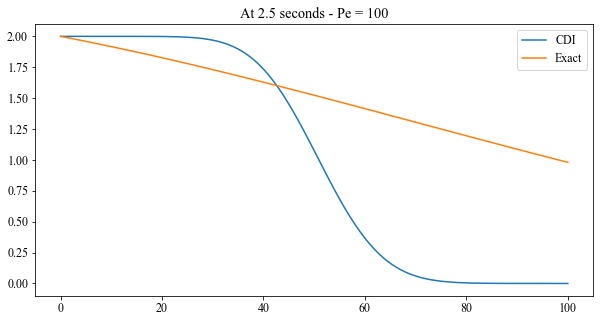

In [10]:
plt.plot(U_CDI[:, -2500], label='CDI'); plt.plot(U_exact[:, -2500], label='Exact'); plt.legend(); plt.title("At 2.5 seconds - Pe = 100")

Comparison with exact solution at the end for 5 seconds: 
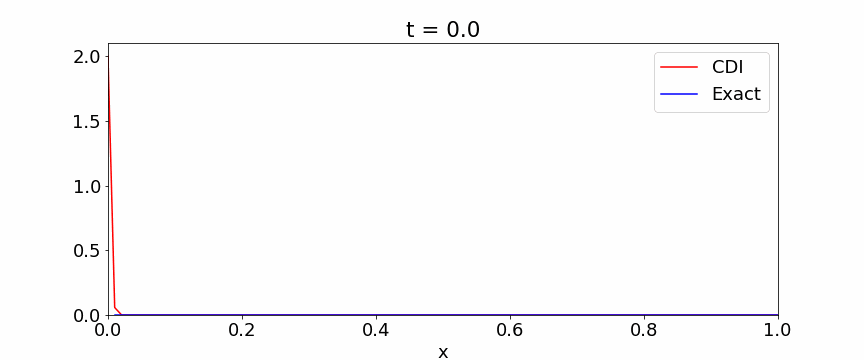

In [11]:
%matplotlib inline
%matplotlib inline

from matplotlib import animation, rc
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import seaborn as sns

# Accuracy looks good at 2 seconds - Keeping Pe = 100

KeyboardInterrupt: 

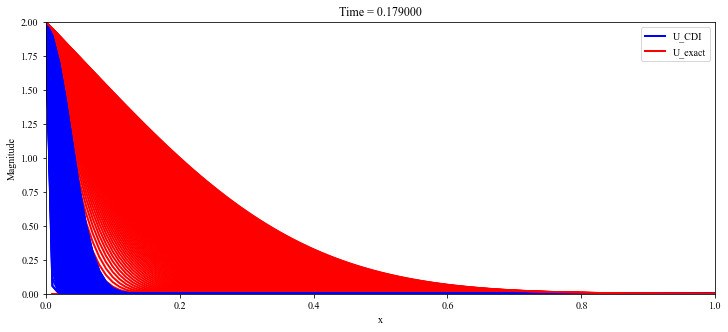

In [13]:
# Making an animation of accuracy over time. 
fig = plt.figure(figsize=(12,5))
ax1 = plt.subplot(1, 1, 1)
#ax2 = plt.subplot(1,, 1, 2)
ax1.set_xlim(( 0, L))            
ax1.set_ylim((0, Co))
ax1.set_xlabel('x')
ax1.set_ylabel('Magnitude')

def drawframe(n):
    kn = n/1000
    txt_title = ax1.set_title('Time = {0:f}'.format(kn))
    
    line1, = ax1.plot(x, U_CDI[:, n], 'b', lw=2)     # ax.plot returns a list of 2D line objects
    line2, = ax1.plot(x, U_exact[:, n], 'r', lw=2)
    ax1.legend(['U_CDI', 'U_exact']);
    return (line1, line2)    

ani = animation.FuncAnimation(fig, drawframe, frames = 1000, interval=10, blit = False)

ani.save("Comparison_OB_Pe100.gif",writer=PillowWriter(fps=24))


In [ ]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(12,5))
ax.set_xlabel('x')

plotLine1, = ax.plot(x, np.zeros(len(x))*np.NaN, 'r-', label = 'CDI')
plotLine2, = ax.plot(x, np.zeros(len(x))*np.NaN, 'b-', label = 'Exact')

#plotLine1.set_label('CDI')
#plotLine2.set_label('Exact')

ax.legend(handles = [plotLine1, plotLine2]);
plotTitle = ax.set_title("t=0")
ax.legend('')
ax.set_ylim(0, 2.1)
ax.set_xlim(0, L)
# def drawframe(kn):
#     n = kn/1000.0
#     print(n)
#     txt_title = ax1.set_title('Time = {0:f}'.format(n))
    
#     line1, = ax1.plot(x, U_CDI[:, n], 'b', lw=2)     # ax.plot returns a list of 2D line objects
#     line2, = ax1.plot(x, U_exact[:, n], 'r', lw=2)
#     ax1.legend(['U_CDI', 'U_exact']);
#     return (line1, txt_title)    

def animate(t):
    plotLine1.set_ydata( U_CDI[:, t])
    
    plotLine2.set_ydata( U_exact[:, t])
    ax.legend(handles = [plotLine1, plotLine2]);
    plotTitle.set_text('t = ' + str(round(t/1000,3)))
    return [plotLine1, plotLine2, plotTitle]
ani = animation.FuncAnimation(fig, func = animate, frames = np.arange(0, 5000, 10),  blit = False)
plt.show()


In [ ]:
ani.save("Comparison_OB_Pe100.gif",writer=PillowWriter(fps=24))

# Solution for No Production Decay
    Lapidus and Amundson 1952
    Ogata and Banks 1961
    Equation: R*dC/dt = D*d2C/dx2 - v*dC/dx
    IC: C(x, 0) = Ci
    BCs:Dirichlet for 0<t<to: C(0, t) = Co
    Neumann: dC/dx(inf, t) = 0
 

$$ \frac {\partial U}{\partial t} = D\frac {\partial^2 U}{\partial x^2} - v\frac {\partial U}{\partial x} + c*U + d $$
$$ IC: U(x, 0) = C_i  $$
 $$  BC - Left: U(0, t) = C_o \ \ \   \ 0<t<t_o $$
 $$  BC - Right: \frac {dU(\infty, t)}{dx} = 0 $$
    $$  c = 0 $$
    $$  d = 0 $$

<ipython-input-105-9510095d43e8>:23: RuntimeWarning: invalid value encountered in double_scalars
  C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))
<ipython-input-105-9510095d43e8>:23: RuntimeWarning: divide by zero encountered in double_scalars
  C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))


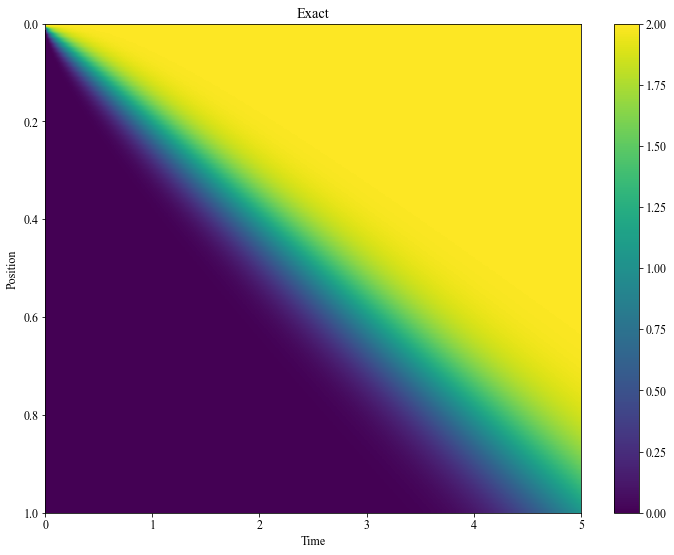

In [105]:
# Analytical - du/dt = -v*du/dx+D*d2u/dx2

Ci = 0; 
Co = 2;
# dCinf/dx = 0;
R = 1; 
D = 0.002
v = 0.2

nx = 101;
nt = 5001;

L = 1.0;
T = 5.0;

x = np.linspace(0, L, nx);
t = np.linspace(0, T, nt);


C = np.zeros((nt, nx))
for i in range(nt):  
    for j in range(nx):      
        C[i, j] = Ci + ((Co-Ci)/2)*(erfc((x[j]-v*t[i])/(2*np.sqrt(D*t[i]/R))) + (np.exp(v*x[j]/(D/R)))*(erfc((x[j]+v*t[i])/(2*np.sqrt(D*t[i]/R)))))

U_exact = np.transpose(C);

fig = plt.figure()
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()

Code with Dirichlet one side C(0, t) = Co and dC(inf, t)/dx = 0

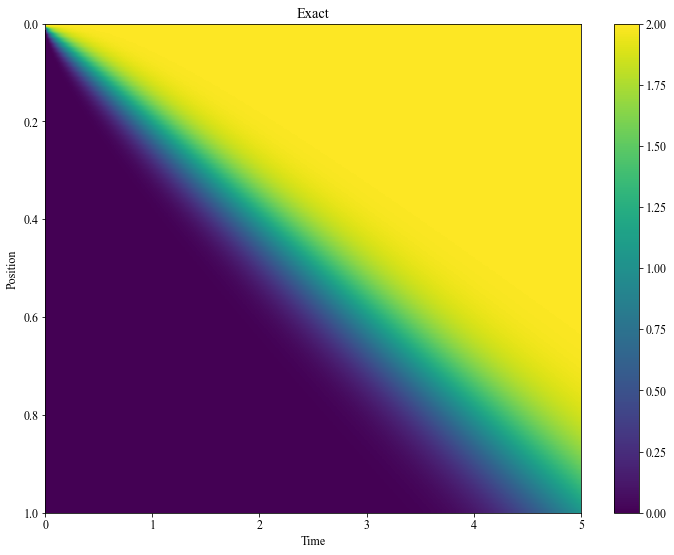

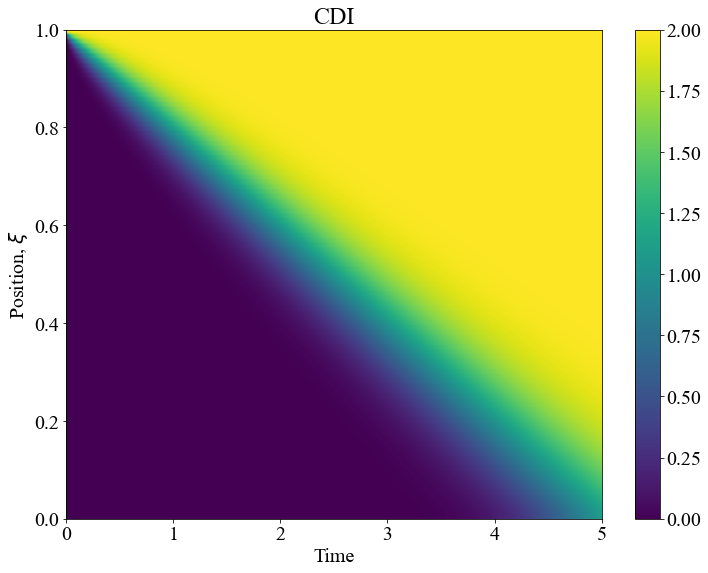

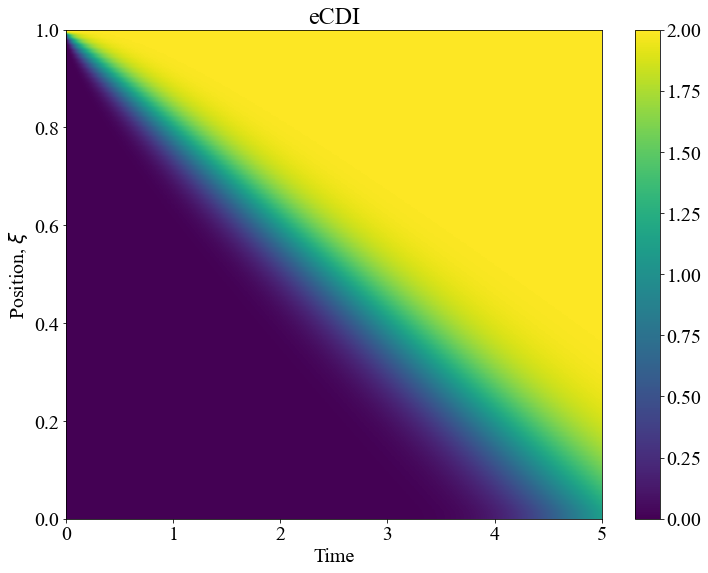

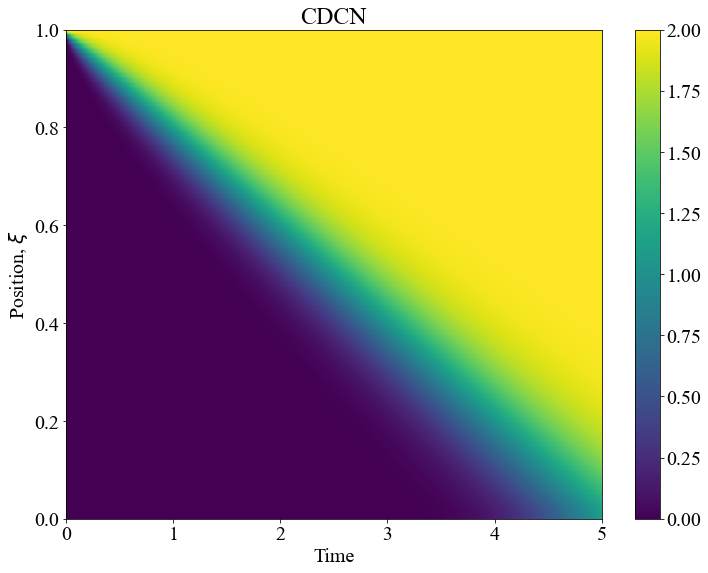

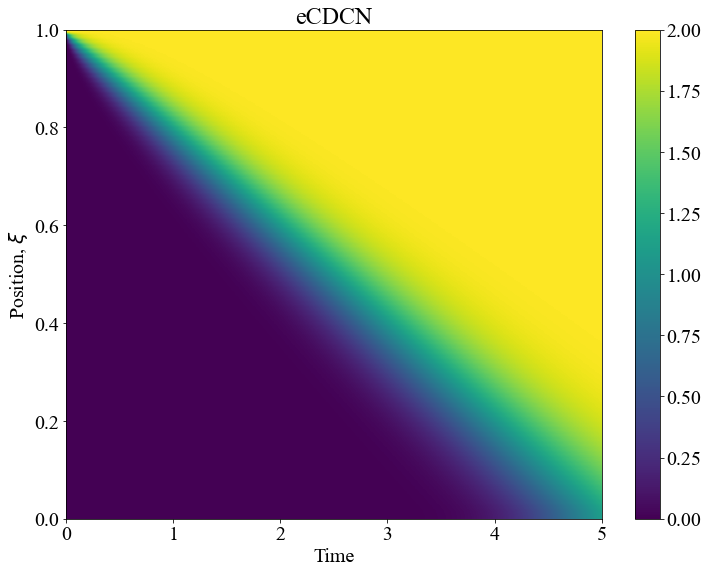

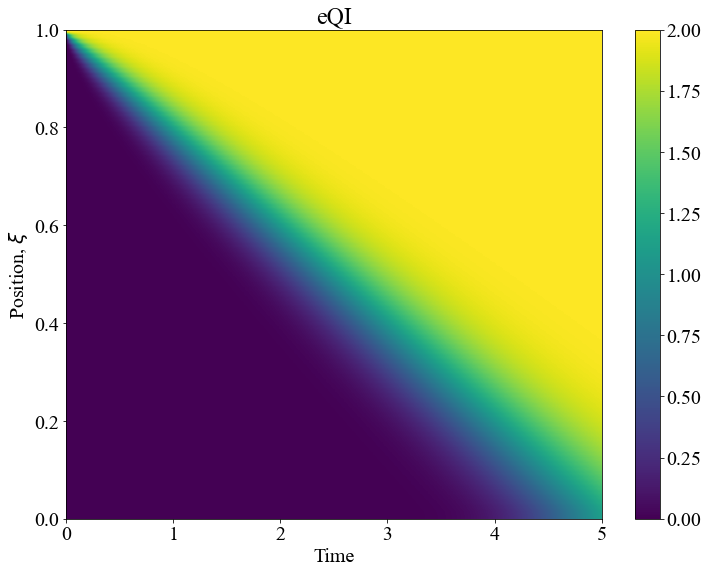

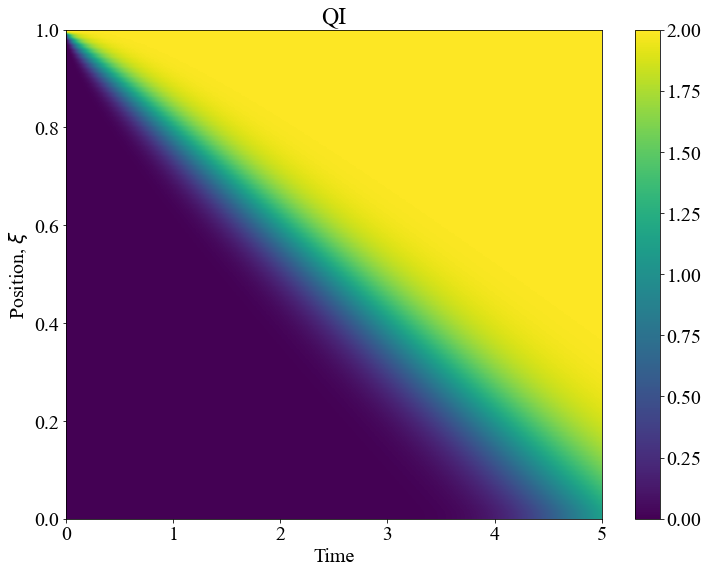

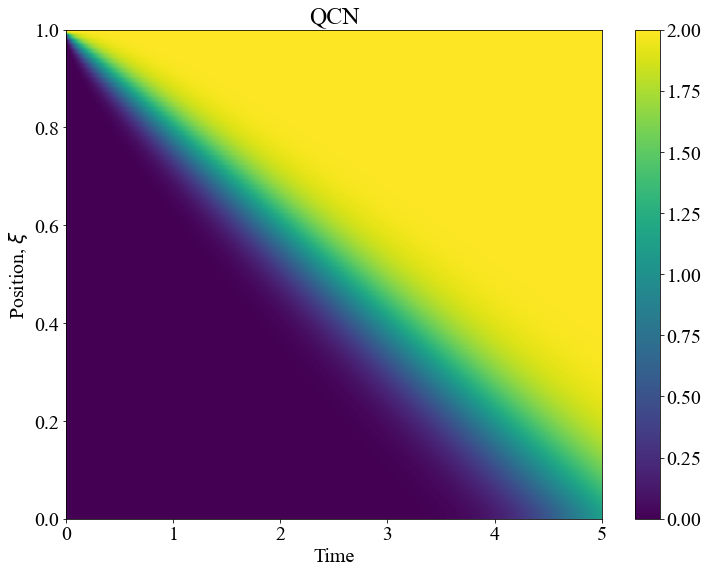

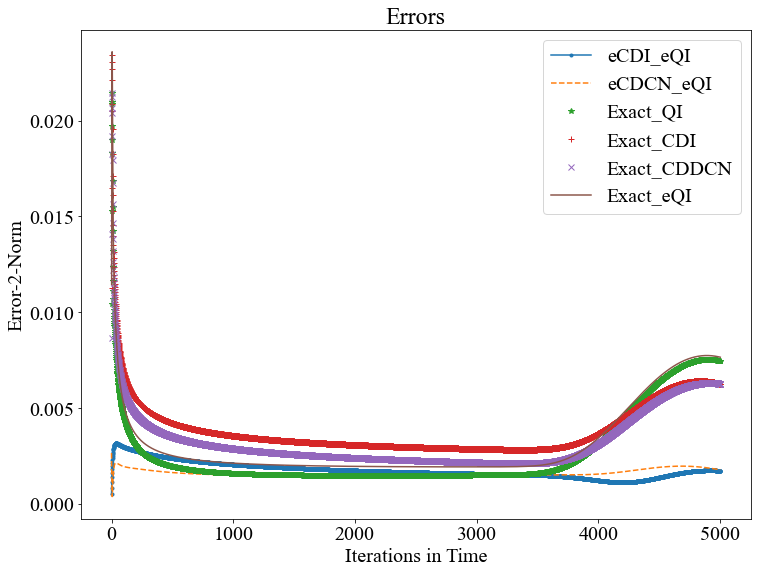

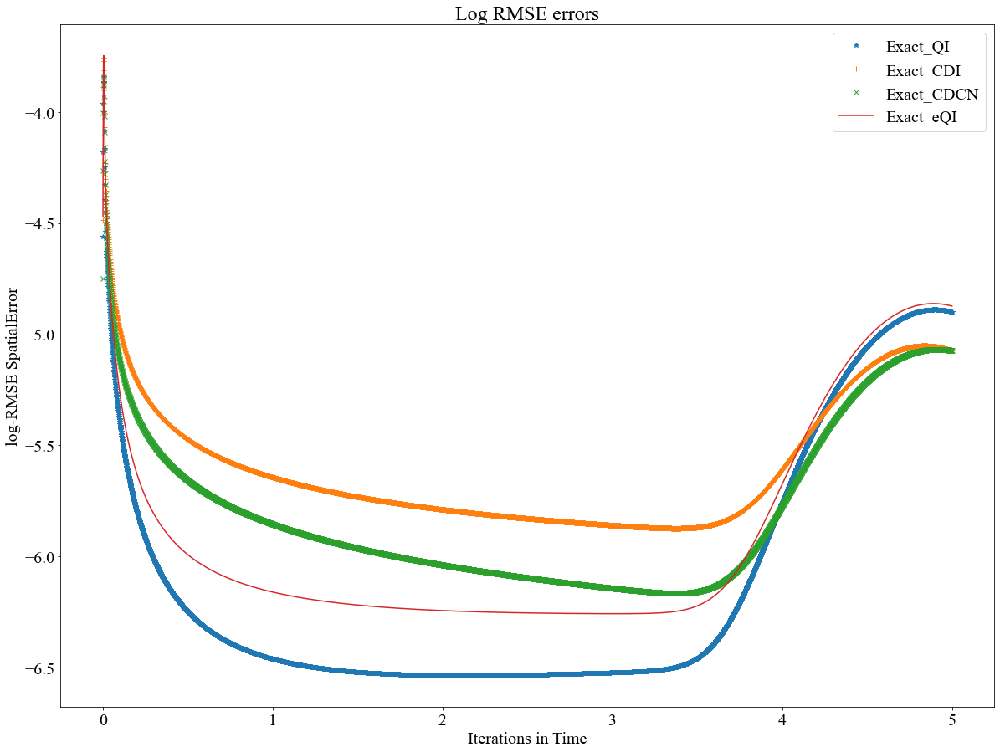

In [106]:
# Define the grid
a = -0.2;
b = 0.002;
c = 0.0;
d = 0.0;



nx = 101
nt = 5001
L = 1.0
T = 5.0
# Define x & t
x = np.linspace(0, L, nx)
t = np.linspace(0, T, nt)


# Dirichlet Boundary Condition
left = 2.0*np.ones(nt)
# right = np.zeros(nt)

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 12})
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


# Discretization of space and time
dx = L/(nx-1)
dt = T/(nt-1)
u = np.zeros(nx);
def numerical_scheme_CDI(u_CDI, dx, dt, l):
    alpha = a*dt/dx
    beta = b*dt/dx**2
    A = np.zeros((len(u_CDI), len(u_CDI)))
    bi = d*dt+u_CDI;

    for j in range(1, len(u_CDI)-1):

        A[j, j-1] = -(beta-alpha/2)
        A[j, j] = 1+2*beta-c*dt
        A[j, j+1] = -(beta+alpha/2)

    N = len(u_CDI)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0
    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r


    u_CDI = solve(A, bi)

    return u_CDI

def numerical_scheme_e_CDI(u_eCDI, dx, dt,a, b, c, d, l):

    frac = 0.1
    le = -np.log(1-l*frac)

    ke = -np.log(1-u_eCDI*frac)
    N = len(u_eCDI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((len(u_eCDI), len(u_eCDI)))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b
    #plt.legend()
    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    ce = -wk/(dx**2) + v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    be = -vk/(2*dx) - wk/(dx**2) - v2t*v2k/(4*(dx**2));
    ae = -u2k*np.exp(ke)/2 + 2*wk/(dx**2)

    de = np.zeros(N+1);

    for t in range(0, (N+1)):
        if(t==N):
            de[t] = ke[t];
        else:
            de[t] = ke[t]*(-u2k[t]*np.exp(ke[t])/2+1)+uk[t]+u2k[t]*np.exp(ke[t])

    bi = de;

    for j in range(1, len(u_eCDI)-1):
        A[j, j-1] = ce[j]
        A[j, j] = 1+ae[j]
        A[j, j+1] = be[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0


    bi[0] = le
    # bi[N] = r


    ke = solve(A, bi)
    u_eCDI = ((1-np.exp(-ke))/frac)
    return u_eCDI

def numerical_scheme_eCDCN(u_eCDCN, dx, dt,a, b, c, d, l):

    # frac = 0.1


    # ke = -np.log(1-u_eCDCN*frac)
    # N = len(u_eCDCN)-1

    # A = np.zeros((len(u_eCDCN), len(u_eCDCN)))
    # udterm = -c
    # ydterm = d
    # vdterm = -a
    # wdterm = b


    # uk = udterm*dt*np.ones(N+1); # f
    # u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    # vk = -vdterm*dt*np.ones(N+1); # a
    # v2k = -wdterm*dt*np.ones(N+1); #d
    # wk = wdterm*dt*np.ones(N+1); # b


    # v2t = np.zeros(N+1)

    # v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    # ccn = -wk/(dx**2)+ v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    # bcn = -vk/(2*dx)-wk/(dx**2)-v2t*v2k/(4*(dx**2));
    # acn = -u2k*np.exp(ke)/2 + 2*wk/((dx**2))

    # dcn = np.zeros(N+1);
    # for t in range(0, N+1):
    #     if(t==(N)):
    #         dcn[t] = ke[t];
    #     elif(t==0):
    #         dcn[t] = ke[t];
    #     else:
    #         dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDCN*frac)
    N = len(u_eCDCN)-1

    A = np.zeros((len(u_eCDCN), len(u_eCDCN)))

    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1]) 

    bcn = ((-a*dt)/(4*dx)) - ((b*dt)/(2*(dx**2))) + ((b*dt)/(8*(dx**2)))*(v2t)
    acn = ((b*dt)/(dx**2)) - ((d*frac + c)*dt*np.exp(ke)/4)
    ccn = (a*dt)/(4*dx) - ((b*dt)/(2*(dx**2))) -  ((b*dt)/(8*(dx**2)))*(v2t)

    dcn = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==(N)):
            dcn[t] = ke[t];
        elif(t==0):
            dcn[t] = ke[t];
        else:
            dcn[t] = ke[t] - c*dt + ((d*frac + c)*dt*np.exp(ke[t]))*(1-ke[t]/4)+ (1/2)*(((a*dt)/(2*dx))*(ke[t+1] - ke[t-1]) + ((b*dt)/(dx**2))*(ke[t+1]+ke[t-1]-2*ke[t]) - ((b*dt)/(4*(dx**2)))*((ke[t+1] - ke[t-1])**2))
            #dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    bi = dcn;

    for j in range(1, N):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = ccn[j]
        A[j, j] = 1+acn[j]
        A[j, j+1] = bcn[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r

    # print(A)
    ke = solve(A, bi)
    u_eCDCN = ((1-np.exp(-ke))/frac)
    return u_eCDCN

def numerical_scheme_CDCN(u_CDCN, dx, dt, l):
    alpha = a*dt/(4*dx)
    beta = b*dt/(2*dx**2)

    A = np.zeros((len(u_CDCN), len(u_CDCN)))

    bi = np.zeros(len(u_CDCN))
    for j in range(1, len(u_CDCN)-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = -(beta - alpha)
        A[j, j] = 1+(2*beta - c*dt/2)
        A[j, j+1] = -(beta + alpha)

        bi[j] = d*dt + u_CDCN[j]*(1-(2*beta - c*dt/2))+u_CDCN[j+1]*(alpha+beta)+u_CDCN[j-1]*(beta-alpha)

    N = len(u)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_CDCN = solve(A, bi)

    return u_CDCN

def numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, l):
    frac = 0.1
    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eQI*frac)
    N = len(u_eQI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((N+1, N+1))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b

    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    # yk = (bia*frac)*dt;#c+e+uk   *np.ones((1, int(N/2)+1)) #d
    v2t = np.zeros(N+1)
    # print(np.shape(v2t))
    v2t[1:N-1] = (7*ke[2:N]-3*ke[1:N-1] - ke[3:N+1] - 3*ke[0:N-2])

    v2t[N-1] = (3*ke[N]+3*ke[N-1]-7*ke[N-2]+ke[N-3])
    # v2t = (ke[1:int(N/2)+1]-ke[0:int(N/2)])
    # print(np.shape(v2t))
    #v2t = np.concatenate((v2t, v2t[0]))
    #print(np.shape(v2t))


    cq = 3*vk/(8*dx) - wk/(dx**2) + 3*v2k*v2t/((8*dx)**2)
    bq = -7*vk/(8*dx) - wk/(dx**2) - 7*v2k*v2t/((8*dx)**2)
    aq = 3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 + 3*v2k*v2t/((8*dx)**2)
    fq = vk/(8*dx) + v2k*v2t/((8*dx)**2)

    # USING LAST node Q with other side variation
    cnq = 7*vk/(8*dx) - wk/(dx**2) + 7*v2k*v2t/((8*dx)**2)
    bnq = -3*vk/(8*dx) - wk/(dx**2) - 3*v2k*v2t/((8*dx)**2)
    anq = -3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 - 3*v2k*v2t/((8*dx)**2)
    fnq = -vk/(8*dx) - v2k*v2t/((8*dx)**2)

    dq = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==N):
            dq[t] = (ke[t])#*((-u2k[0, t]*np.log(ke[t]))/2+1)+(uk[0, t])+(u2k[0, t]*np.exp(ke[t])) ; # currenty CD - I - CN terms - + (1/2)*(u2k[0, t]*np.exp(ke[t]) + 2*uk[0, t])+(ke[t+1]/2)*(vk[0, t]/(2*dx[t])+wk[0, t]/(dx[t]**2))+(v2k[0, t]/2)*(((ke[t+1]-ke[t-1])/2*dx[t])**2)+(ke[t]/2)*(1+ ((u2k[0, t]/(2*dx[t]))*np.exp(ke[t])) - (2*wk[0, t]/(dx[t]**2)))+(ke[t-1]/2)*(-vk[0, t]/(2*dx[t]) + wk[0, t]/(dx[t]**2))
        else:
            dq[t] = ke[t]*((-u2k[t]*np.exp(ke[t])/2)+1)+uk[t]+u2k[t]*np.exp(ke[t]) #(-c[t]*tau[0, t-1])+(1-b[t])*tau[0, t]-a[t]*tau[0, t+1]-e[t]*tau[0, t+2]


    bi = dq;

    for j in range(1, N-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cq[j]
        A[j, j] = 1+aq[j]
        A[j, j+1] = bq[j]
        A[j, j+2] = fq[j]


    A[N-1, N-2] = cnq[N-1] # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anq[N-1]
    A[N-1, N] = bnq[N-1]
    A[N-1, N-3] = fnq[N-1]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r


    # print(A)
    ke = solve(A, bi)
    u_eQI = ((1-np.exp(-ke))/frac)
    return u_eQI

def numerical_scheme_QI(u_QI, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QI), len(u_QI)))
    bi = d*dt+u_QI;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QI)-2):

        A[j, j-1] = cQ
        A[j, j] = 1+aQ
        A[j, j+1] = bQ
        A[j, j+2] = eQ

    N = len(u_QI)-1

    A[N-1, N-2] = cnQ  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ
    A[N-1, N] = bnQ
    A[N-1, N-3] = enQ


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QI = solve(A, bi)

    return u_QI


def numerical_scheme_QCN(u_QCN, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QCN), len(u_QCN)))
    bi = d*dt+u_QCN;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QCN)-2):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cQ/2
        A[j, j] = 1+aQ/2
        A[j, j+1] = bQ/2
        A[j, j+2] = eQ/2
        bi[j] = bi[j] - cQ*u_QCN[j-1]/2 - aQ*u_QCN[j]/2 - bQ*u_QCN[j+1]/2 - eQ*u_QCN[j+2]/2

    N = len(u_QCN)-1

    A[N-1, N-2] = cnQ/2  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ/2
    A[N-1, N] = bnQ/2
    A[N-1, N-3] = enQ/2
    bi[N-1] = bi[N-1] - cnQ*u_QCN[N-2]/2 - anQ*u_QCN[N-1]/2 - bnQ*u_QCN[N]/2 - enQ*u_QCN[N-3]/2


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QCN = solve(A, bi)

    return u_QCN


# u_init = u_exact(x, 1.0)

# Apply the numerical scheme

# U_FD = np.zeros((nx, nt))
U_CDI = np.zeros((nx, nt))
U_CDCN = np.zeros((nx, nt))
U_QI = np.zeros((nx, nt))
U_QCN = np.zeros((nx, nt))
U_eCDI = np.zeros((nx, nt))
U_eQI = np.zeros((nx, nt))

U_eCDCN = np.zeros((nx, nt))


# error_2norm_FD_CDI = np.zeros(nt)
error_2norm_CDI_CDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_CDCN_eCDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_QI_eQI = np.zeros(nt)

error_2norm_CDI_eCDI = np.zeros(nt)
error_2norm_CDI_QI = np.zeros(nt)
error_2norm_QI_QCN = np.zeros(nt)
error_2norm_CDCN_QCN = np.zeros(nt)
error_2norm_CDI_QCN = np.zeros(nt)


error_2norm_eCDCN_eCDI = np.zeros(nt)
error_2norm_eCDCN_eQI = np.zeros(nt)
error_2norm_eCDI_eQI = np.zeros(nt)

error_2norm_Qexact_QI = np.zeros(nt)
error_2norm_Qexact_eQI = np.zeros(nt)

error_2norm_Qexact_CDCN = np.zeros(nt)

error_2norm_Qexact_CDI = np.zeros(nt)
#error_2norm_FD_CDI = np.zeros(nt)


# u_FD = u;
u_CDI=u;
u_CDCN = u;
u_eQI = u;
u_eCDI = u;

u_QI=u;
u_QCN=u;
u_eCDCN=u;

for n in range(nt):
    # print(n)
    # u_FD = numerical_scheme(u_FD, dx, dt)
    # #print(u)
    # #print(str(n*dt)+" "+str(max(u)))
    # U_FD[:, n] = u_FD
    u_CDI = numerical_scheme_CDI(u_CDI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDI[:, n] = u_CDI

    #error = u_FD - u_CDI
    #error_2norm_FD_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)




    u_eCDI = numerical_scheme_e_CDI(u_eCDI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDI[:, n] = u_eCDI

    error = u_CDI - u_eCDI
    error_2norm_CDI_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_CDCN = numerical_scheme_CDCN(u_CDCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDCN[:, n] = u_CDCN
    error = u_CDI - u_CDCN
    error_2norm_CDI_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    u_eCDCN = numerical_scheme_eCDCN(u_eCDCN, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDCN[:, n] = u_eCDCN
    error = u_CDCN - u_eCDCN
    error_2norm_CDCN_eCDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QI = numerical_scheme_QI(u_QI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QI[:, n] = u_QI
    error = u_CDCN - u_QI
    error_2norm_CDCN_QI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QI
    error_2norm_CDI_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_eQI = numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eQI[:, n] = u_eQI

    error = u_QI - u_eQI
    error_2norm_QI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDI - u_eQI
    error_2norm_eCDI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eQI
    error_2norm_eCDCN_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eCDI
    error_2norm_eCDCN_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QCN = numerical_scheme_QCN(u_QCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QCN[:, n] = u_QCN
    error = u_CDCN - u_QCN
    error_2norm_CDCN_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QCN
    error_2norm_CDI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_QI - u_QCN
    error_2norm_QI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    # Comparing with the exact solution
    error = U_exact[:, n] - u_QI
    error_2norm_Qexact_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDCN
    error_2norm_Qexact_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDI
    error_2norm_Qexact_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)
    
    error = U_exact[:, n] - u_eQI
    error_2norm_Qexact_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    
# plt.rcParams['font.size'] = 18
# fig = plt.figure()  
# plt.imshow(U_FD, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
# plt.colorbar()
# plt.title("FD")
# plt.xlabel('Time')
# plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_FD.png', dpi = 900)
# plt.show()

fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_CDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDI")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eCDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDI")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eCDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_CDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDCN")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eCDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDCN")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eQI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eQI")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eQI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_QI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QI")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_QI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_QCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QCN")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_QCN.png', dpi = 900)
plt.show()



fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
#plt.plot(error_2norm_CDI_CDCN, '-+', label = 'CDI_CDCN')
#plt.plot(error_2norm_CDCN_QI,'-*', label = 'CDCN_QI')
#plt.plot(error_2norm_CDI_QI, '--' ,label = 'CDI_QI')
#plt.plot(error_2norm_CDI_eCDI, '+' ,label = 'CDI_eCDI')
#plt.plot(error_2norm_CDCN_eCDCN, 'x' ,label = 'CDCN_eCDCN')

#plt.plot(error_2norm_QI_QCN, '-', label = 'QI_QCN')
#plt.plot(error_2norm_CDCN_QCN, '.', label='CDCN_QCN')
#plt.plot(error_2norm_QI_eQI, 'o', label='QI_eQI')
plt.plot(error_2norm_eCDI_eQI, '.-', label='eCDI_eQI')
plt.plot(error_2norm_eCDCN_eQI, '--', label='eCDCN_eQI')
#plt.plot(error_2norm_eCDCN_eCDI, '.', label='eCDCN_eCDI')

plt.plot(error_2norm_Qexact_QI, '*', label = 'Exact_QI')


plt.plot(error_2norm_Qexact_CDI, '+', label = 'Exact_CDI')
plt.plot(error_2norm_Qexact_CDCN, 'x', label = 'Exact_CDDCN')

plt.plot(error_2norm_Qexact_eQI, '-', label = 'Exact_eQI')
plt.title("Errors")
plt.legend(loc='best')
plt.xlabel('Iterations in Time')
plt.ylabel('Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Error_Norm.png', dpi = 900)
plt.show()
ntt = np.linspace(0, T, nt)
fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(ntt, np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(ntt, np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(ntt, np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(ntt, np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log RMSE errors")
plt.xlabel('Iterations in Time')
plt.ylabel('log-RMSE SpatialError')

fig.set_size_inches(20.,15.)
plt.savefig('Log-ErrorNorm_OB_Pe100.png', dpi = 900)
plt.show()


#fig = plt.figure() 
#plt.plot(U_exact[:, -1], '-+',label = 'U_exact')
#plt.plot(U_CDI[:, -1], '-*',label = 'U_CDI')
#plt.legend()
#plt.title("Comparison of U_exact and U_CDI")
#plt.xlabel('Length')
#plt.ylabel('U')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
#plt.show()


Text(0.5, 1.0, 'At 2.5 seconds - Pe = 100')

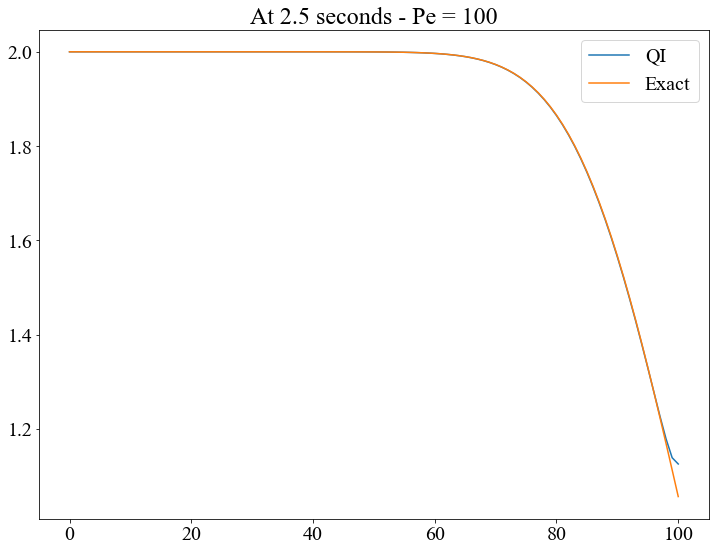

In [107]:
plt.plot(U_QI[:, 5000], label='QI'); plt.plot(U_exact[:, 5000], label='Exact'); plt.legend(); plt.title("At 2.5 seconds - Pe = 100")

Text(0.5, 1.0, 'At 2.5 seconds - Pe = 100')

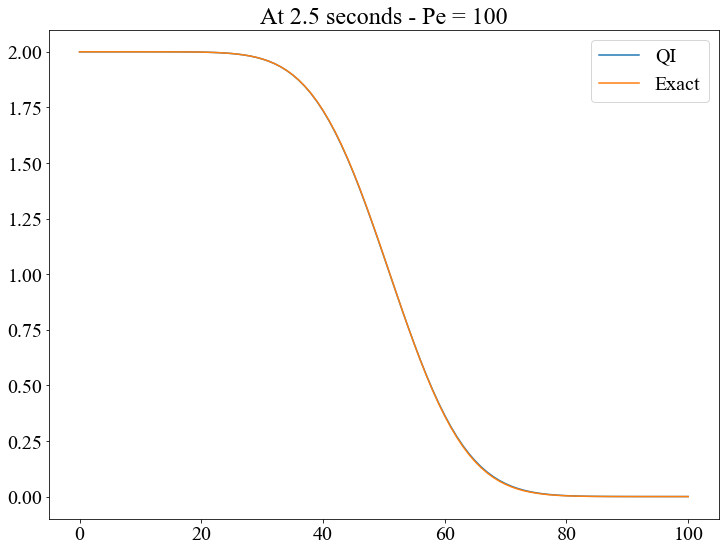

In [108]:
plt.plot(U_QI[:, -2500], label='QI'); plt.plot(U_exact[:, -2500], label='Exact'); plt.legend(); plt.title("At 2.5 seconds - Pe = 100")

## With Zero Order Production Only
    Carslaw and Jaegar 1959, Pg.388
    R*dC/dt = D*d2C/dx2 - v*dC/dx + d

    IC: C(x, 0) = Ci
    BCs:C(0,t) = Co 0<t<to
        dc(inf,t)/dx = finite (0)
                        

$$ \frac {\partial U}{\partial t} = D\frac {\partial^2 U}{\partial x^2} - v\frac {\partial U}{\partial x} + c*U + d $$
$ IC: U(x, 0) = C_i $
$ BC - Left: U(0, t) = C_o \ \ \   \ 0<t<t_o$
$ BC - Right: \frac {dU(\infty, t)}{dx} = 0 $ 
    $$ c = 0 $$
    $$ d \not= 0 $$

<ipython-input-109-69dc8f6fcdf5>:24: RuntimeWarning: invalid value encountered in double_scalars
  An = (1/2)*(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))) + (np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-109-69dc8f6fcdf5>:25: RuntimeWarning: invalid value encountered in double_scalars
  Bn = (d/R)*(t[i] + ((R*x[j]-v*t[i])/(2*v))*erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))) - ((R*x[j]+v*t[i])/(2*v))*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-109-69dc8f6fcdf5>:24: RuntimeWarning: divide by zero encountered in double_scalars
  An = (1/2)*(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))) + (np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-109-69dc8f6fcdf5>:25: RuntimeWarning: divide by zero encountered in double_scalars
  Bn = (d/R)*(t[i] + ((R*x[j]-v*t[i])/(2*v))*erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))) - ((R*x[j]+v*t[i])/(2*v))*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*

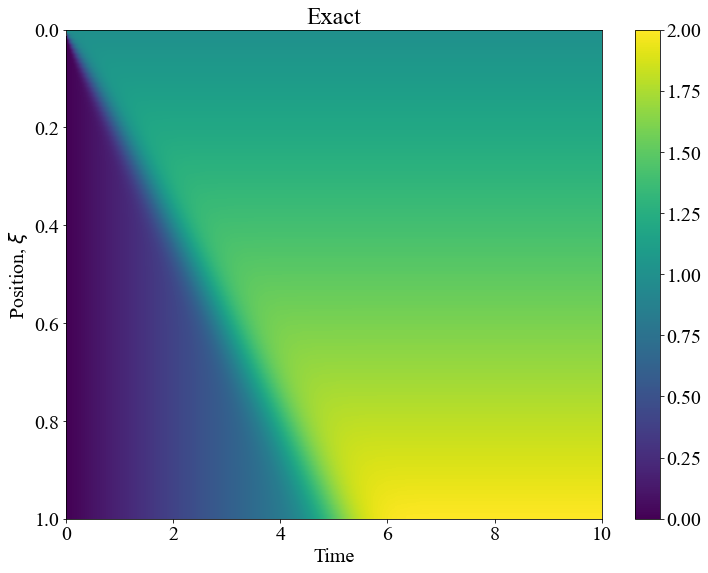

In [109]:
# Analytical - du/dt = -v*du/dx+D*d2u/dx2 + d

Ci = 0; 
Co = 1;
# dCinf/dx = 0;
R = 1; 
D = 0.001
v = 0.2
d = 0.2
nx = 101;
nt = 10001;

L = 1.0;
T = 10.0;

x = np.linspace(0, L, nx);
t = np.linspace(0, T, nt);


C = np.zeros((nt, nx))

for i in range(nt):  
    for j in range(nx):
        An = (1/2)*(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))) + (np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
        Bn = (d/R)*(t[i] + ((R*x[j]-v*t[i])/(2*v))*erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))) - ((R*x[j]+v*t[i])/(2*v))*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
        #print(An, Bn)
        C[i, j] = Ci + ((Co-Ci))*An + Bn

U_exact = np.transpose(C);

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()

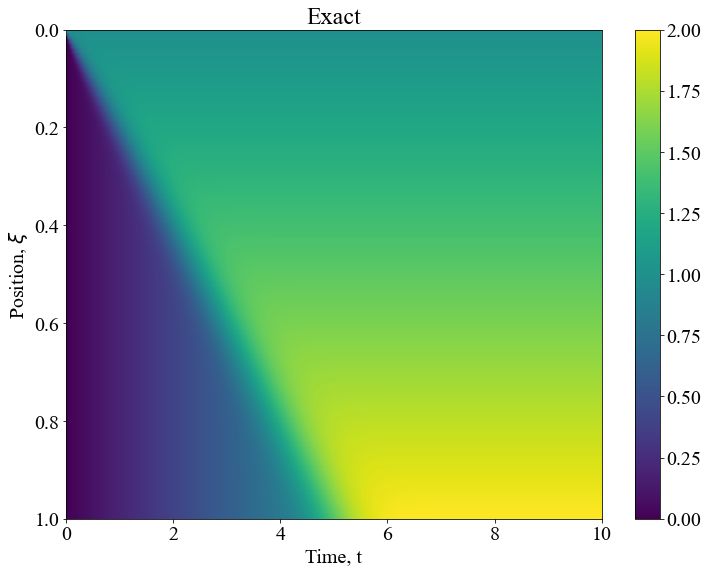

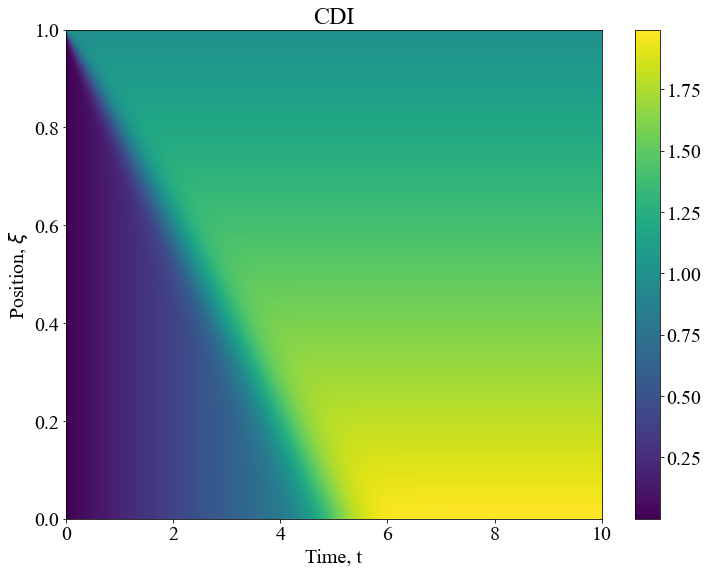

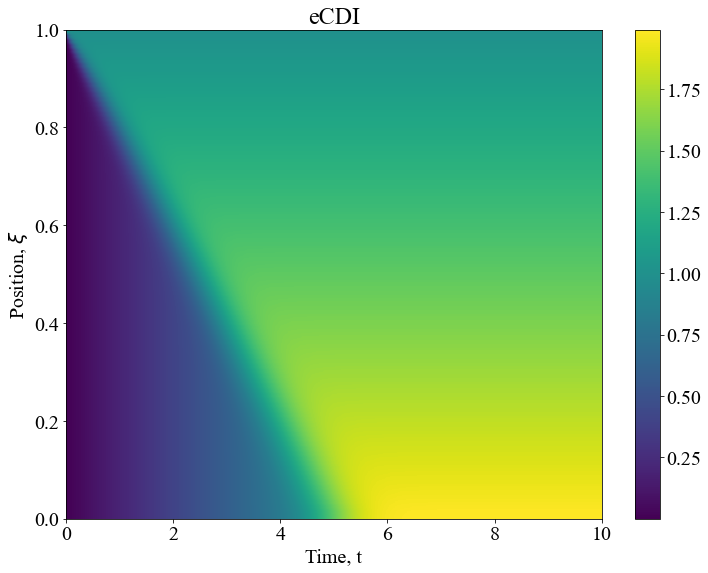

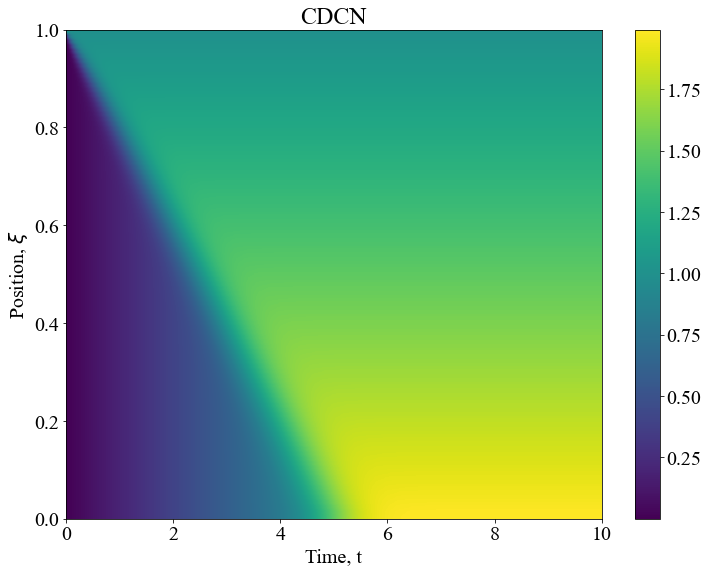

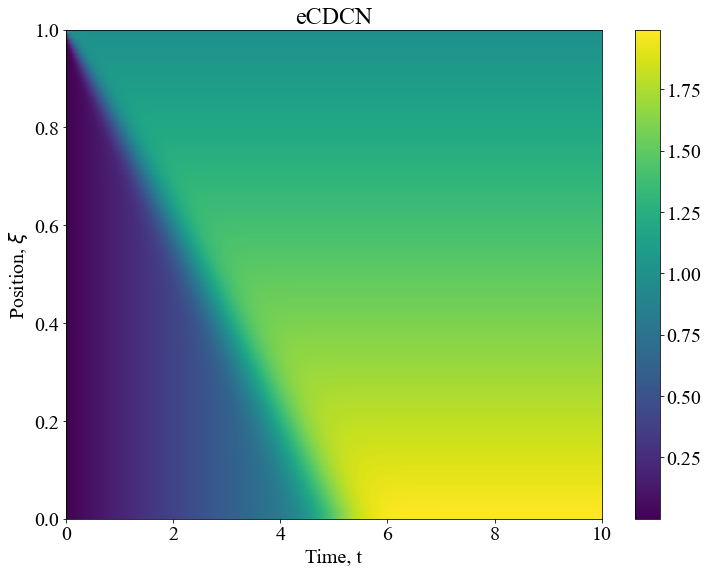

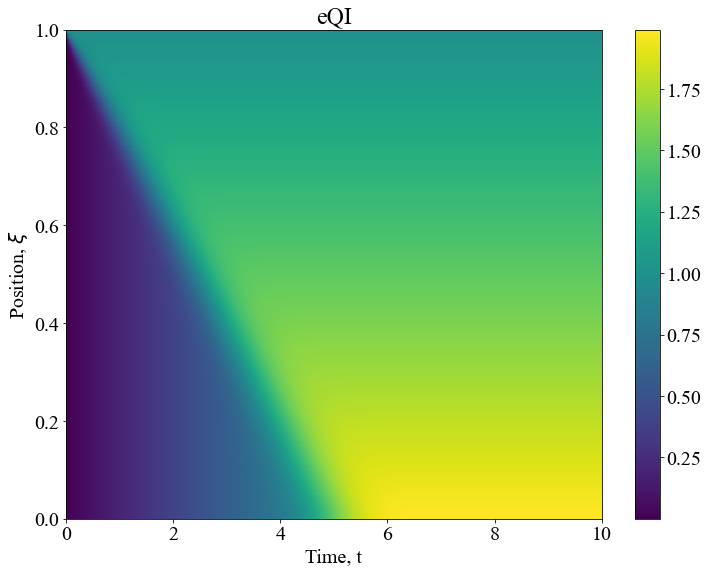

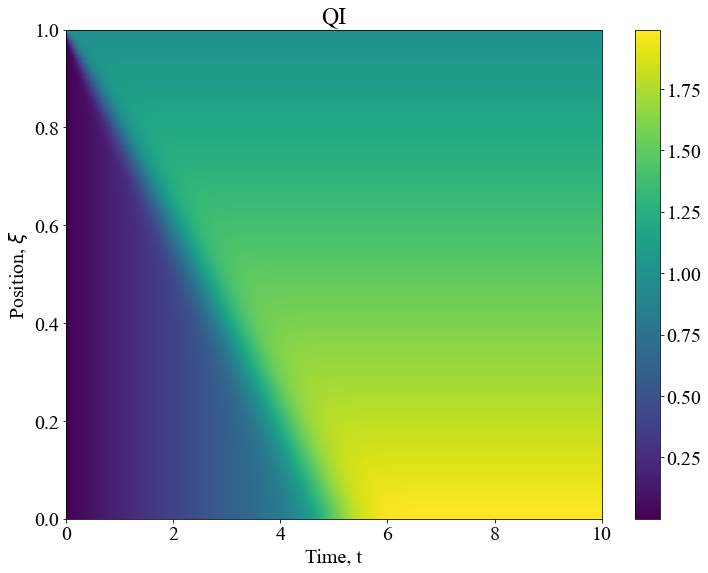

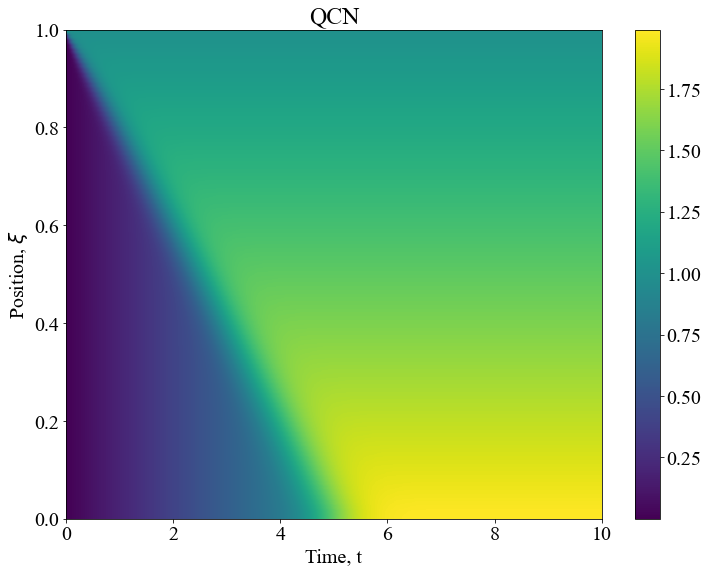

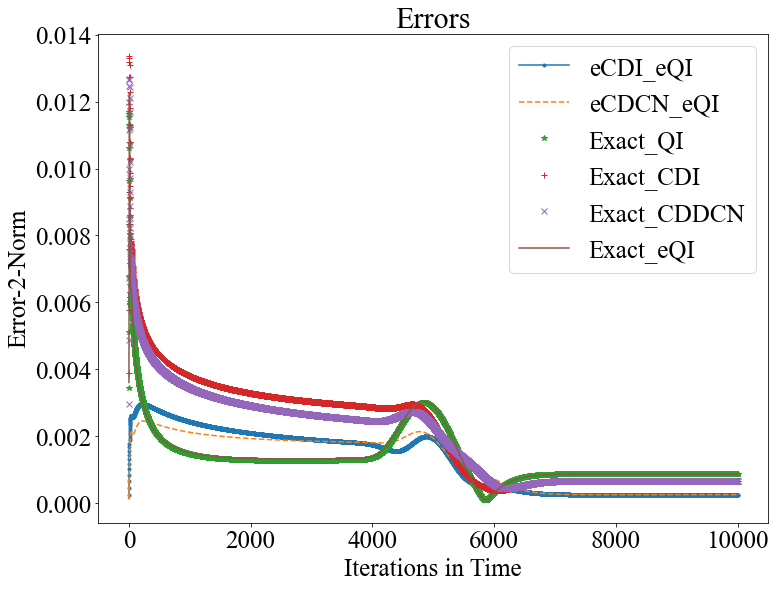

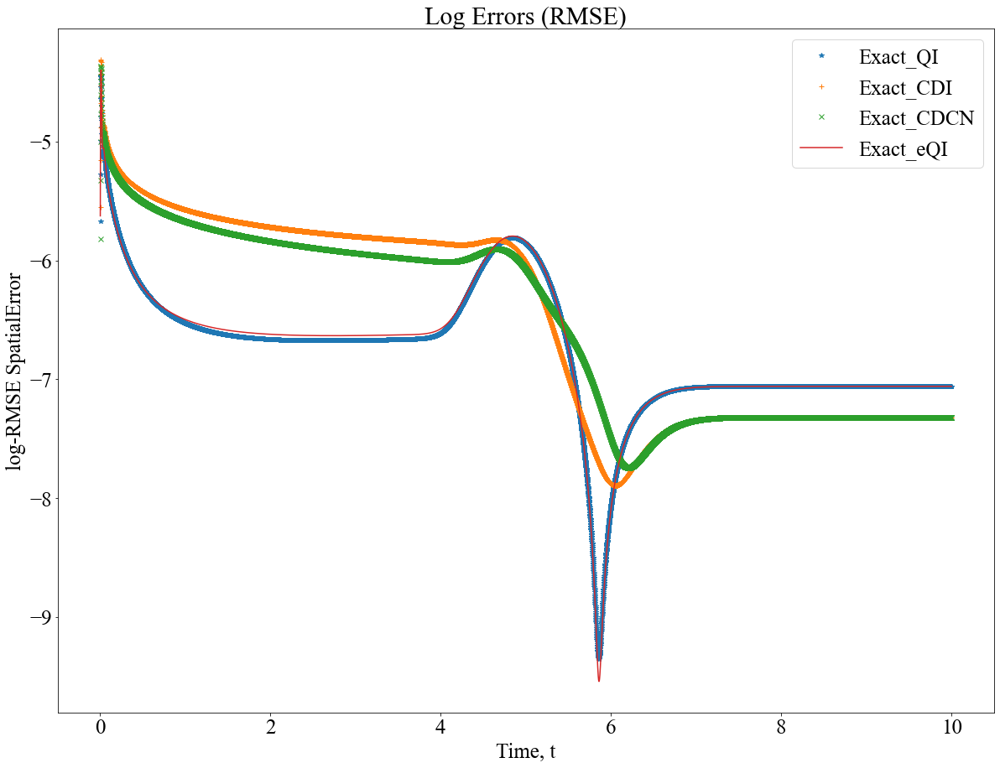

In [110]:
# Define the grid
a = -0.2;
b = 0.001;
c = 0.0;
d = 0.2;



nx = 101
nt = 10001
L = 1.0
T = 10.0
# Define x & t
x = np.linspace(0, L, nx)
t = np.linspace(0, T, nt)


# Dirichlet Boundary Condition
left = 1.0*np.ones(nt)
# right = np.zeros(nt)

fig = plt.figure()  
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


# Discretization of space and time
dx = L/(nx-1)
dt = T/(nt-1)
u = np.zeros(nx);
def numerical_scheme_CDI(u_CDI, dx, dt, l):
    alpha = a*dt/dx
    beta = b*dt/dx**2
    A = np.zeros((len(u_CDI), len(u_CDI)))
    bi = d*dt+u_CDI;

    for j in range(1, len(u_CDI)-1):

        A[j, j-1] = -(beta-alpha/2)
        A[j, j] = 1+2*beta-c*dt
        A[j, j+1] = -(beta+alpha/2)

    N = len(u_CDI)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0
    
    
    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r


    u_CDI = solve(A, bi)

    return u_CDI

def numerical_scheme_e_CDI(u_eCDI, dx, dt,a, b, c, d, l):

    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDI*frac)
    N = len(u_eCDI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((len(u_eCDI), len(u_eCDI)))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b
    #plt.legend()
    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    ce = -wk/(dx**2) + v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    be = -vk/(2*dx) - wk/(dx**2) - v2t*v2k/(4*(dx**2));
    ae = -u2k*np.exp(ke)/2 + 2*wk/(dx**2)

    de = np.zeros(N+1);

    for t in range(0, (N+1)):
        if(t==N):
            de[t] = ke[t];
        else:
            de[t] = ke[t]*(-u2k[t]*np.exp(ke[t])/2+1)+uk[t]+u2k[t]*np.exp(ke[t])

    bi = de;

    for j in range(1, len(u_eCDI)-1):
        A[j, j-1] = ce[j]
        A[j, j] = 1+ae[j]
        A[j, j+1] = be[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0


    bi[0] = le
    # bi[N] = r


    ke = solve(A, bi)
    u_eCDI = ((1-np.exp(-ke))/frac)
    return u_eCDI

def numerical_scheme_eCDCN(u_eCDCN, dx, dt,a, b, c, d, l):

    # frac = 0.1


    # ke = -np.log(1-u_eCDCN*frac)
    # N = len(u_eCDCN)-1

    # A = np.zeros((len(u_eCDCN), len(u_eCDCN)))
    # udterm = -c
    # ydterm = d
    # vdterm = -a
    # wdterm = b


    # uk = udterm*dt*np.ones(N+1); # f
    # u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    # vk = -vdterm*dt*np.ones(N+1); # a
    # v2k = -wdterm*dt*np.ones(N+1); #d
    # wk = wdterm*dt*np.ones(N+1); # b


    # v2t = np.zeros(N+1)

    # v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    # ccn = -wk/(dx**2)+ v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    # bcn = -vk/(2*dx)-wk/(dx**2)-v2t*v2k/(4*(dx**2));
    # acn = -u2k*np.exp(ke)/2 + 2*wk/((dx**2))

    # dcn = np.zeros(N+1);
    # for t in range(0, N+1):
    #     if(t==(N)):
    #         dcn[t] = ke[t];
    #     elif(t==0):
    #         dcn[t] = ke[t];
    #     else:
    #         dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDCN*frac)
    N = len(u_eCDCN)-1

    A = np.zeros((len(u_eCDCN), len(u_eCDCN)))

    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1]) 

    bcn = ((-a*dt)/(4*dx)) - ((b*dt)/(2*(dx**2))) + ((b*dt)/(8*(dx**2)))*(v2t)
    acn = ((b*dt)/(dx**2)) - ((d*frac + c)*dt*np.exp(ke)/4)
    ccn = (a*dt)/(4*dx) - ((b*dt)/(2*(dx**2))) -  ((b*dt)/(8*(dx**2)))*(v2t)

    dcn = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==(N)):
            dcn[t] = ke[t];
        elif(t==0):
            dcn[t] = ke[t];
        else:
            dcn[t] = ke[t] - c*dt + ((d*frac + c)*dt*np.exp(ke[t]))*(1-ke[t]/4)+ (1/2)*(((a*dt)/(2*dx))*(ke[t+1] - ke[t-1]) + ((b*dt)/(dx**2))*(ke[t+1]+ke[t-1]-2*ke[t]) - ((b*dt)/(4*(dx**2)))*((ke[t+1] - ke[t-1])**2))
            #dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    bi = dcn;

    for j in range(1, N):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = ccn[j]
        A[j, j] = 1+acn[j]
        A[j, j+1] = bcn[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r

    # print(A)
    ke = solve(A, bi)
    u_eCDCN = ((1-np.exp(-ke))/frac)
    return u_eCDCN

def numerical_scheme_CDCN(u_CDCN, dx, dt, l):
    alpha = a*dt/(4*dx)
    beta = b*dt/(2*dx**2)

    A = np.zeros((len(u_CDCN), len(u_CDCN)))

    bi = np.zeros(len(u_CDCN))
    for j in range(1, len(u_CDCN)-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = -(beta - alpha)
        A[j, j] = 1+(2*beta - c*dt/2)
        A[j, j+1] = -(beta + alpha)

        bi[j] = d*dt + u_CDCN[j]*(1-(2*beta - c*dt/2))+u_CDCN[j+1]*(alpha+beta)+u_CDCN[j-1]*(beta-alpha)

    N = len(u)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_CDCN = solve(A, bi)

    return u_CDCN

def numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, l):
    frac = 0.1
    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eQI*frac)
    N = len(u_eQI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((N+1, N+1))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b

    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    # yk = (bia*frac)*dt;#c+e+uk   *np.ones((1, int(N/2)+1)) #d
    v2t = np.zeros(N+1)
    # print(np.shape(v2t))
    v2t[1:N-1] = (7*ke[2:N]-3*ke[1:N-1] - ke[3:N+1] - 3*ke[0:N-2])

    v2t[N-1] = (3*ke[N]+3*ke[N-1]-7*ke[N-2]+ke[N-3])
    # v2t = (ke[1:int(N/2)+1]-ke[0:int(N/2)])
    # print(np.shape(v2t))
    #v2t = np.concatenate((v2t, v2t[0]))
    #print(np.shape(v2t))


    cq = 3*vk/(8*dx) - wk/(dx**2) + 3*v2k*v2t/((8*dx)**2)
    bq = -7*vk/(8*dx) - wk/(dx**2) - 7*v2k*v2t/((8*dx)**2)
    aq = 3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 + 3*v2k*v2t/((8*dx)**2)
    fq = vk/(8*dx) + v2k*v2t/((8*dx)**2)

    # USING LAST node Q with other side variation
    cnq = 7*vk/(8*dx) - wk/(dx**2) + 7*v2k*v2t/((8*dx)**2)
    bnq = -3*vk/(8*dx) - wk/(dx**2) - 3*v2k*v2t/((8*dx)**2)
    anq = -3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 - 3*v2k*v2t/((8*dx)**2)
    fnq = -vk/(8*dx) - v2k*v2t/((8*dx)**2)

    dq = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==N):
            dq[t] = (ke[t])#*((-u2k[0, t]*np.log(ke[t]))/2+1)+(uk[0, t])+(u2k[0, t]*np.exp(ke[t])) ; # currenty CD - I - CN terms - + (1/2)*(u2k[0, t]*np.exp(ke[t]) + 2*uk[0, t])+(ke[t+1]/2)*(vk[0, t]/(2*dx[t])+wk[0, t]/(dx[t]**2))+(v2k[0, t]/2)*(((ke[t+1]-ke[t-1])/2*dx[t])**2)+(ke[t]/2)*(1+ ((u2k[0, t]/(2*dx[t]))*np.exp(ke[t])) - (2*wk[0, t]/(dx[t]**2)))+(ke[t-1]/2)*(-vk[0, t]/(2*dx[t]) + wk[0, t]/(dx[t]**2))
        else:
            dq[t] = ke[t]*((-u2k[t]*np.exp(ke[t])/2)+1)+uk[t]+u2k[t]*np.exp(ke[t]) #(-c[t]*tau[0, t-1])+(1-b[t])*tau[0, t]-a[t]*tau[0, t+1]-e[t]*tau[0, t+2]


    bi = dq;

    for j in range(1, N-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cq[j]
        A[j, j] = 1+aq[j]
        A[j, j+1] = bq[j]
        A[j, j+2] = fq[j]


    A[N-1, N-2] = cnq[N-1] # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anq[N-1]
    A[N-1, N] = bnq[N-1]
    A[N-1, N-3] = fnq[N-1]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r


    # print(A)
    
    ke = solve(A, bi)
    u_eQI = ((1-np.exp(-ke))/frac)
    return u_eQI

def numerical_scheme_QI(u_QI, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QI), len(u_QI)))
    bi = d*dt+u_QI;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QI)-2):

        A[j, j-1] = cQ
        A[j, j] = 1+aQ
        A[j, j+1] = bQ
        A[j, j+2] = eQ

    N = len(u_QI)-1

    A[N-1, N-2] = cnQ  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ
    A[N-1, N] = bnQ
    A[N-1, N-3] = enQ


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QI = solve(A, bi)

    return u_QI


def numerical_scheme_QCN(u_QCN, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QCN), len(u_QCN)))
    bi = d*dt+u_QCN;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QCN)-2):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cQ/2
        A[j, j] = 1+aQ/2
        A[j, j+1] = bQ/2
        A[j, j+2] = eQ/2
        bi[j] = bi[j] - cQ*u_QCN[j-1]/2 - aQ*u_QCN[j]/2 - bQ*u_QCN[j+1]/2 - eQ*u_QCN[j+2]/2

    N = len(u_QCN)-1

    A[N-1, N-2] = cnQ/2  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ/2
    A[N-1, N] = bnQ/2
    A[N-1, N-3] = enQ/2
    bi[N-1] = bi[N-1] - cnQ*u_QCN[N-2]/2 - anQ*u_QCN[N-1]/2 - bnQ*u_QCN[N]/2 - enQ*u_QCN[N-3]/2


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QCN = solve(A, bi)

    return u_QCN


# u_init = u_exact(x, 1.0)

# Apply the numerical scheme

# U_FD = np.zeros((nx, nt))
U_CDI = np.zeros((nx, nt))
U_CDCN = np.zeros((nx, nt))
U_QI = np.zeros((nx, nt))
U_QCN = np.zeros((nx, nt))
U_eCDI = np.zeros((nx, nt))
U_eQI = np.zeros((nx, nt))

U_eCDCN = np.zeros((nx, nt))


# error_2norm_FD_CDI = np.zeros(nt)
error_2norm_CDI_CDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_CDCN_eCDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_QI_eQI = np.zeros(nt)

error_2norm_CDI_eCDI = np.zeros(nt)
error_2norm_CDI_QI = np.zeros(nt)
error_2norm_QI_QCN = np.zeros(nt)
error_2norm_CDCN_QCN = np.zeros(nt)
error_2norm_CDI_QCN = np.zeros(nt)


error_2norm_eCDCN_eCDI = np.zeros(nt)
error_2norm_eCDCN_eQI = np.zeros(nt)
error_2norm_eCDI_eQI = np.zeros(nt)

error_2norm_Qexact_QI = np.zeros(nt)
error_2norm_Qexact_eQI = np.zeros(nt)

error_2norm_Qexact_CDCN = np.zeros(nt)

error_2norm_Qexact_CDI = np.zeros(nt)
#error_2norm_FD_CDI = np.zeros(nt)


# u_FD = u;
u_CDI=u;
u_CDCN = u;
u_eQI = u;
u_eCDI = u;

u_QI=u;
u_QCN=u;
u_eCDCN=u;

for n in range(nt):
    # print(n)
    # u_FD = numerical_scheme(u_FD, dx, dt)
    # #print(u)
    # #print(str(n*dt)+" "+str(max(u)))
    # U_FD[:, n] = u_FD
    u_CDI = numerical_scheme_CDI(u_CDI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDI[:, n] = u_CDI

    #error = u_FD - u_CDI
    #error_2norm_FD_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)




    u_eCDI = numerical_scheme_e_CDI(u_eCDI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDI[:, n] = u_eCDI

    error = u_CDI - u_eCDI
    error_2norm_CDI_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_CDCN = numerical_scheme_CDCN(u_CDCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDCN[:, n] = u_CDCN
    error = u_CDI - u_CDCN
    error_2norm_CDI_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    u_eCDCN = numerical_scheme_eCDCN(u_eCDCN, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDCN[:, n] = u_eCDCN
    error = u_CDCN - u_eCDCN
    error_2norm_CDCN_eCDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QI = numerical_scheme_QI(u_QI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QI[:, n] = u_QI
    error = u_CDCN - u_QI
    error_2norm_CDCN_QI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QI
    error_2norm_CDI_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_eQI = numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eQI[:, n] = u_eQI

    error = u_QI - u_eQI
    error_2norm_QI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDI - u_eQI
    error_2norm_eCDI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eQI
    error_2norm_eCDCN_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eCDI
    error_2norm_eCDCN_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QCN = numerical_scheme_QCN(u_QCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QCN[:, n] = u_QCN
    error = u_CDCN - u_QCN
    error_2norm_CDCN_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QCN
    error_2norm_CDI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_QI - u_QCN
    error_2norm_QI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    # Comparing with the exact solution
    error = U_exact[:, n] - u_QI
    error_2norm_Qexact_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDCN
    error_2norm_Qexact_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDI
    error_2norm_Qexact_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)
    
    error = U_exact[:, n] - u_eQI
    error_2norm_Qexact_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    
# plt.rcParams['font.size'] = 18
# fig = plt.figure()  
# plt.imshow(U_FD, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
# plt.colorbar()
# plt.title("FD")
# plt.xlabel('Time')
# plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_FD.png', dpi = 900)
# plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_CDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eCDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eCDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_CDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eCDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eQI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eQI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eQI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_QI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_QI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_QCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_QCN.png', dpi = 900)
plt.show()



fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
#plt.plot(error_2norm_CDI_CDCN, '-+', label = 'CDI_CDCN')
#plt.plot(error_2norm_CDCN_QI,'-*', label = 'CDCN_QI')
#plt.plot(error_2norm_CDI_QI, '--' ,label = 'CDI_QI')
#plt.plot(error_2norm_CDI_eCDI, '+' ,label = 'CDI_eCDI')
#plt.plot(error_2norm_CDCN_eCDCN, 'x' ,label = 'CDCN_eCDCN')

#plt.plot(error_2norm_QI_QCN, '-', label = 'QI_QCN')
#plt.plot(error_2norm_CDCN_QCN, '.', label='CDCN_QCN')
#plt.plot(error_2norm_QI_eQI, 'o', label='QI_eQI')
plt.plot(error_2norm_eCDI_eQI, '.-', label='eCDI_eQI')
plt.plot(error_2norm_eCDCN_eQI, '--', label='eCDCN_eQI')
#plt.plot(error_2norm_eCDCN_eCDI, '.', label='eCDCN_eCDI')

plt.plot(error_2norm_Qexact_QI, '*', label = 'Exact_QI')


plt.plot(error_2norm_Qexact_CDI, '+', label = 'Exact_CDI')
plt.plot(error_2norm_Qexact_CDCN, 'x', label = 'Exact_CDDCN')

plt.plot(error_2norm_Qexact_eQI, '-', label = 'Exact_eQI')
plt.title("Errors")
plt.legend(loc='best')
plt.xlabel('Iterations in Time')
plt.ylabel('Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Error_Norm.png', dpi = 900)
plt.show()
ntt = np.linspace(0,T,nt)
fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(ntt, np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(ntt, np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(ntt, np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(ntt, np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log Errors (RMSE)")
plt.xlabel('Time, t')
plt.ylabel('log-RMSE SpatialError')

fig.set_size_inches(20.,15.)
plt.savefig('Log-ErrorNorm_CJ_Pe200.png', dpi = 900)
plt.show()


#fig = plt.figure() 
#plt.plot(U_exact[:, -1], '-+',label = 'U_exact')
#plt.plot(U_CDI[:, -1], '-*',label = 'U_CDI')
#plt.legend()
#plt.title("Comparison of U_exact and U_CDI")
#plt.xlabel('Length')
#plt.ylabel('U')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
#plt.show()


Text(0.5, 1.0, 'At 5 seconds - Pe = 100')

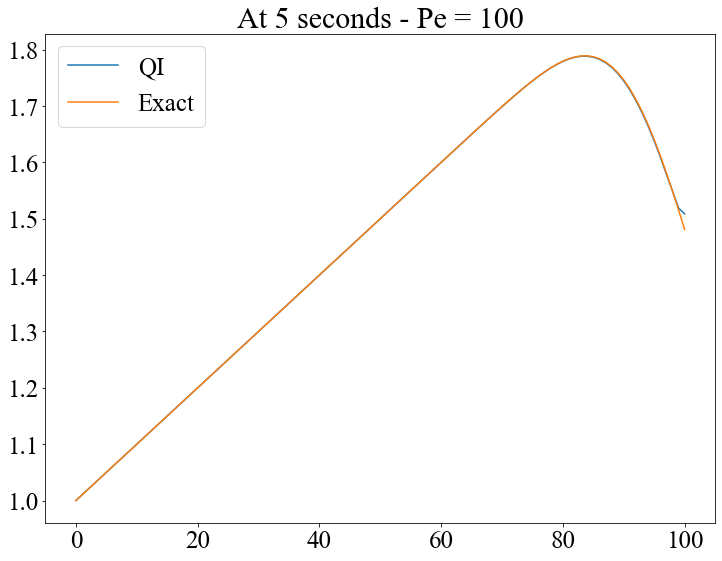

In [111]:
plt.plot(U_QI[:, -5000], label='QI'); plt.plot(U_exact[:, -5000], label='Exact'); plt.legend(); plt.title("At 5 seconds - Pe = 100")

Text(0.5, 1.0, 'At 5 seconds - Pe = 100')

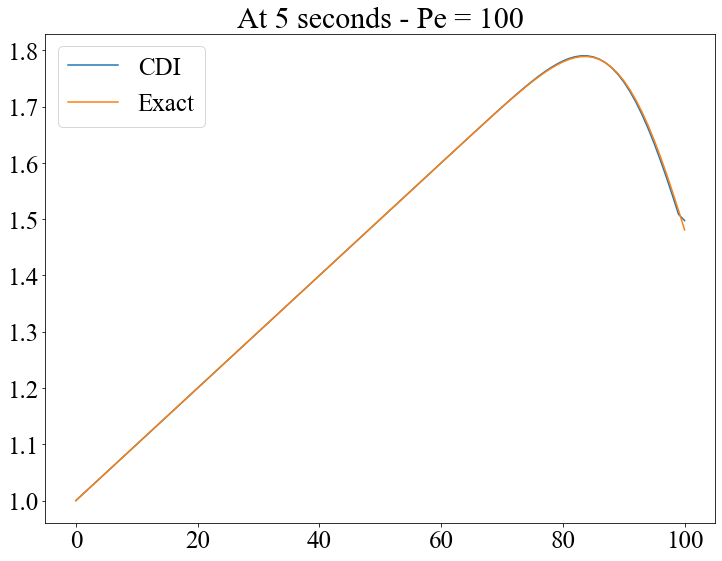

In [112]:
plt.plot(U_CDI[:, -5000], label='CDI'); plt.plot(U_exact[:, -5000], label='Exact'); plt.legend(); plt.title("At 5 seconds - Pe = 100")

## Solutions for Simultaneous Zero-Order and First Order Production
van Genuchten 1981, Bear 1972, Pg. 630


$$ \frac {\partial U}{\partial t} = D\frac {\partial^2 U}{\partial x^2} - v\frac {\partial U}{\partial x} + c*U + d $$
$$ IC: U(x, 0) = C_i $$
$$ BC - Left: U(0, t) = C_o $$
$$ BC - Right: \frac {dU(Inf, t)}{dx} = 0 $$ 
$$ c \not= 0 $$
$$ d \not= 0 $$

<ipython-input-113-756971497775>:25: RuntimeWarning: invalid value encountered in double_scalars
  An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-113-756971497775>:27: RuntimeWarning: invalid value encountered in double_scalars
  Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] + un*t[i])/(2*np.sqrt(D*R*t[i]))))
<ipython-input-113-756971497775>:25: RuntimeWarning: divide by zero encountered in double_scalars
  An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-113-756971497775>:27: RuntimeWarning: divide by zero encountered in double_scalars
  Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] +

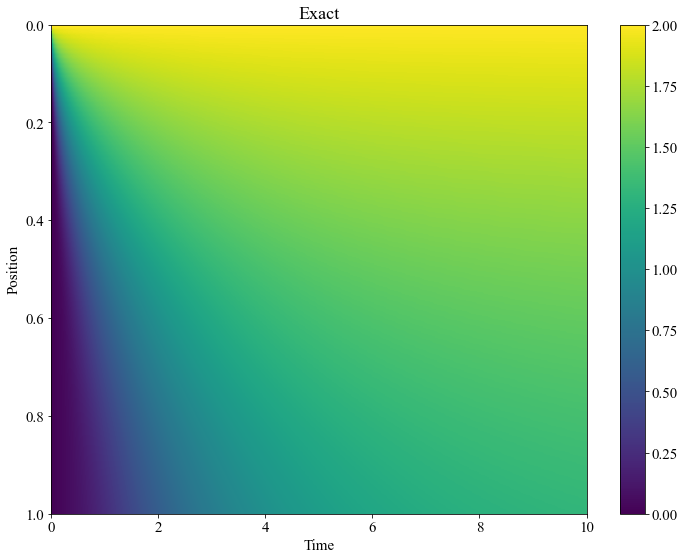

In [113]:
# Analytical - du/dt = -v*du/dx+D*d2u/dx2 - c*u +d

Ci = 0; 
Co = 2;
# dCinf/dx = 0;
R = 1; 
c = 0.2
D = 0.1
v = 0.1
d = 0.2
nx = 101;
nt = 5001;

L = 1.0;
T = 10.0;

x = np.linspace(0, L, nx);
t = np.linspace(0, T, nt);


C = np.zeros((nt, nx))

for i in range(nt):  
    for j in range(nx):
        An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))       
        un = v*(np.sqrt(1+ (4*c*D)/(v**2)))
        Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] + un*t[i])/(2*np.sqrt(D*R*t[i]))))
        # print(np.shape(An), np.shape(Bn))
        C[i, j] = d/c + (Ci - d/c)*An + (Co-d/c)*Bn

U_exact = np.transpose(C);

fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 15})
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()

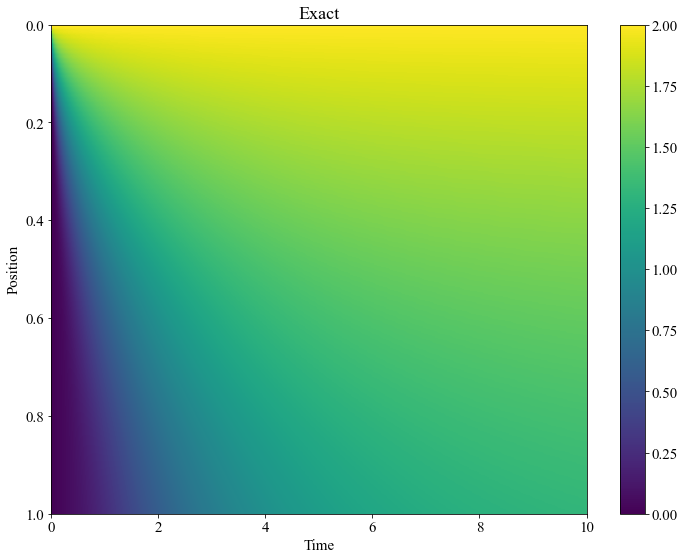

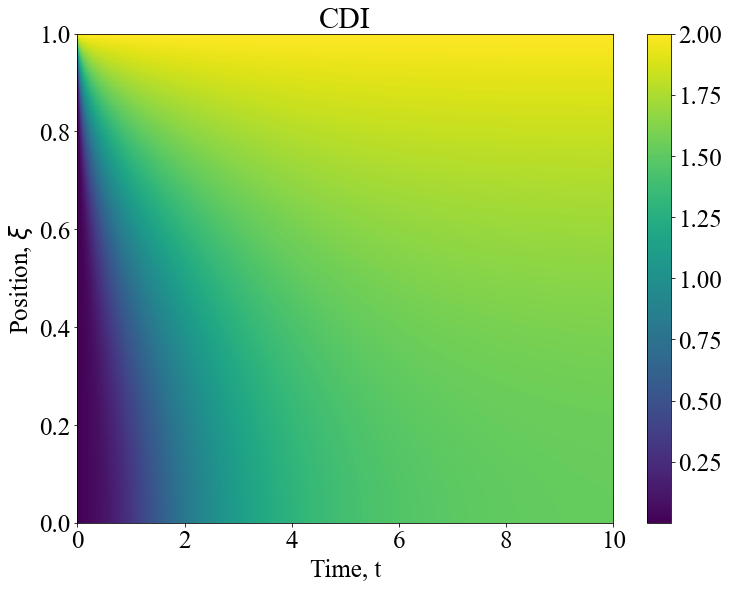

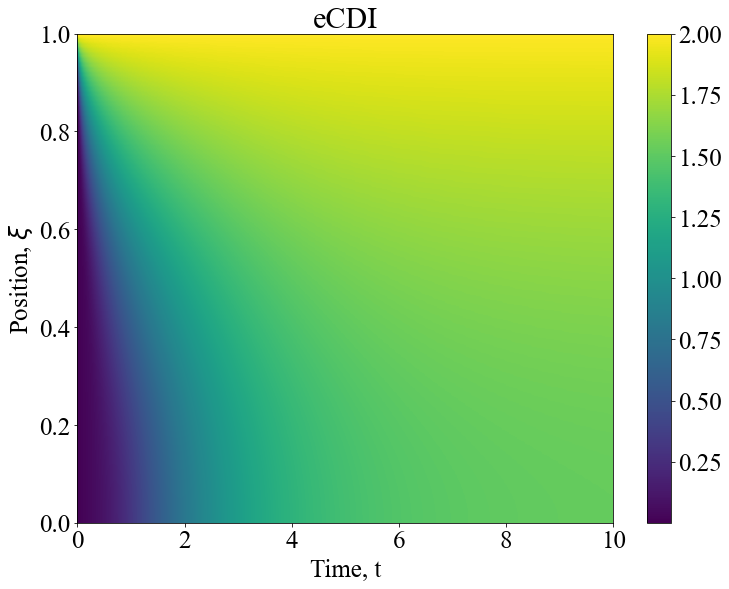

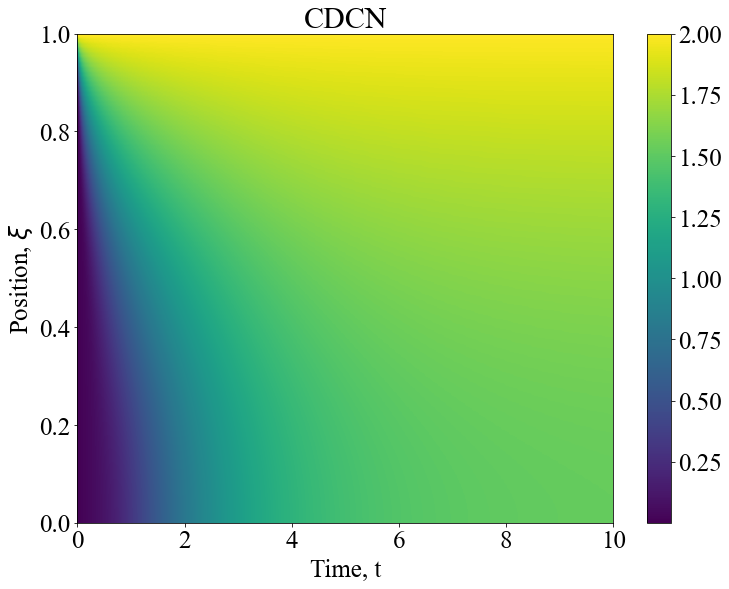

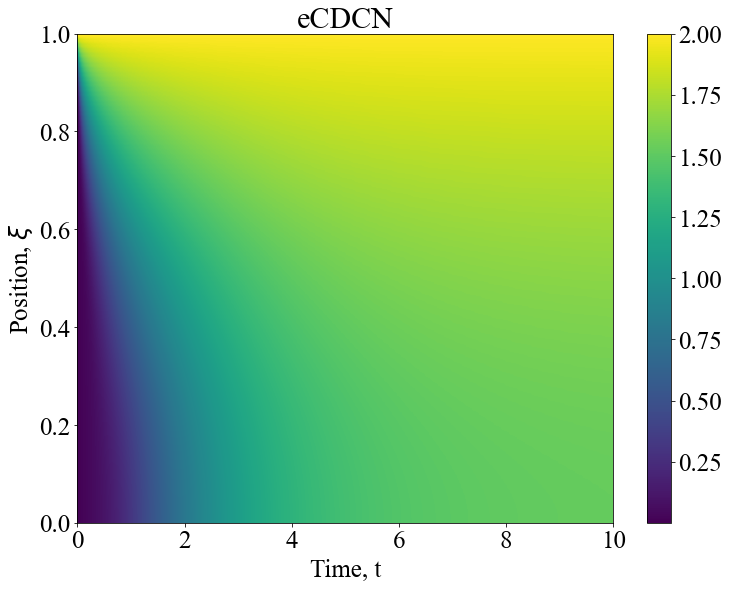

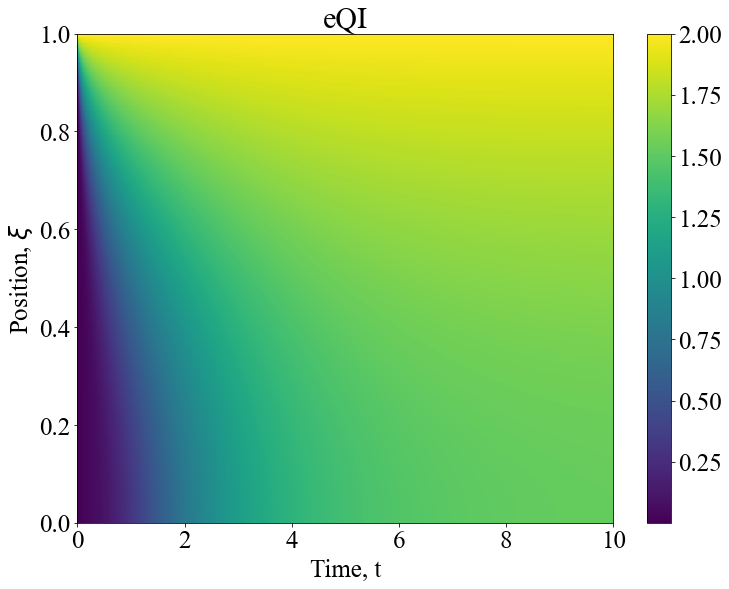

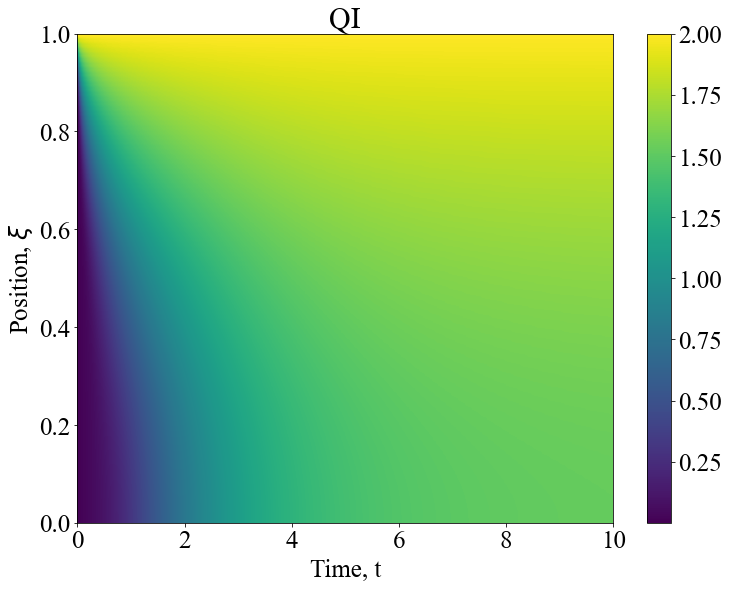

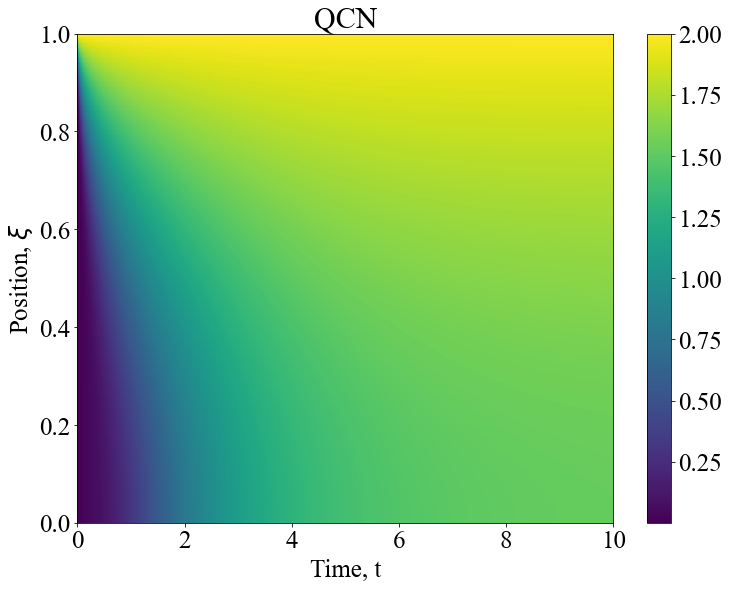

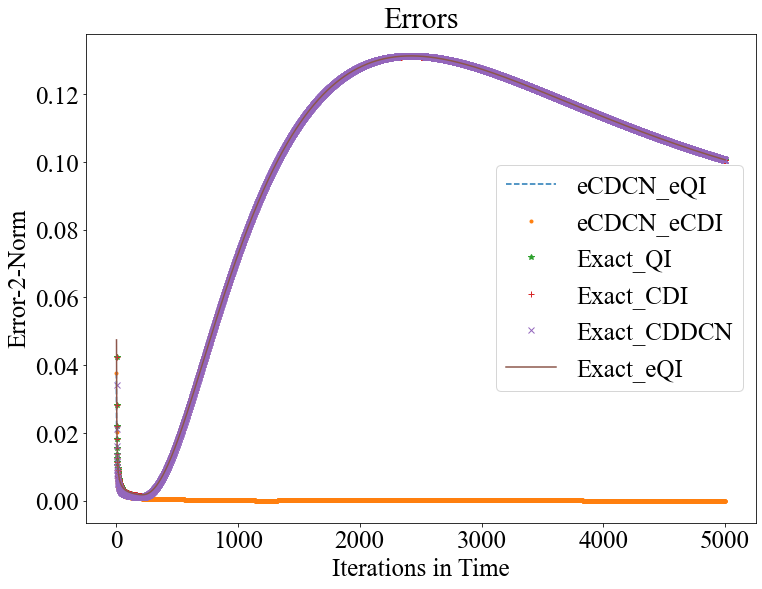

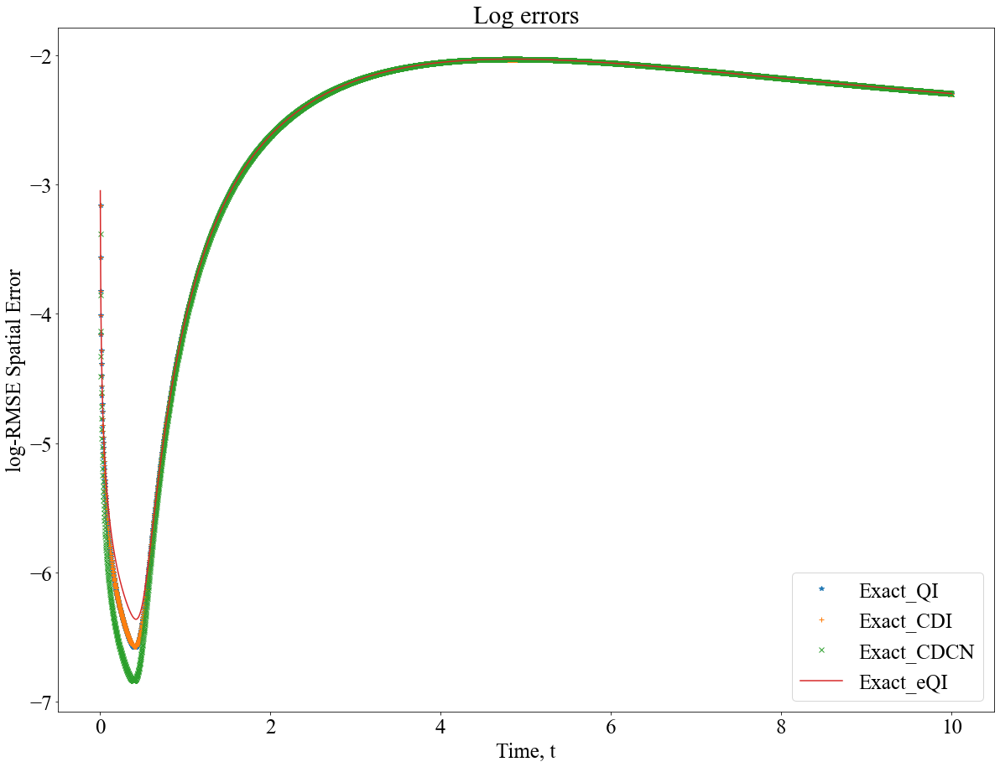

In [114]:
# Define the grid
a = -0.1;
b = 0.1;
c = -0.2;
d = 0.2;



nx = 101
nt = 5001
L = 1.0
T = 10.0
# Define x & t
x = np.linspace(0, L, nx)
t = np.linspace(0, T, nt)


# Dirichlet Boundary Condition
left = 2.0*np.ones(nt)
# right = np.zeros(nt)

fig = plt.figure()  
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


# Discretization of space and time
dx = L/(nx-1)
dt = T/(nt-1)
u = np.zeros(nx);
def numerical_scheme_CDI(u_CDI, dx, dt, l):
    alpha = a*dt/dx
    beta = b*dt/dx**2
    A = np.zeros((len(u_CDI), len(u_CDI)))
    bi = d*dt+u_CDI;

    for j in range(1, len(u_CDI)-1):

        A[j, j-1] = -(beta-alpha/2)
        A[j, j] = 1+2*beta-c*dt
        A[j, j+1] = -(beta+alpha/2)

    N = len(u_CDI)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0
    
    
    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r


    u_CDI = solve(A, bi)

    return u_CDI

def numerical_scheme_e_CDI(u_eCDI, dx, dt,a, b, c, d, l):

    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDI*frac)
    N = len(u_eCDI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((len(u_eCDI), len(u_eCDI)))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b
    #plt.legend()
    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    ce = -wk/(dx**2) + v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    be = -vk/(2*dx) - wk/(dx**2) - v2t*v2k/(4*(dx**2));
    ae = -u2k*np.exp(ke)/2 + 2*wk/(dx**2)

    de = np.zeros(N+1);

    for t in range(0, (N+1)):
        if(t==N):
            de[t] = ke[t];
        else:
            de[t] = ke[t]*(-u2k[t]*np.exp(ke[t])/2+1)+uk[t]+u2k[t]*np.exp(ke[t])

    bi = de;

    for j in range(1, len(u_eCDI)-1):
        A[j, j-1] = ce[j]
        A[j, j] = 1+ae[j]
        A[j, j+1] = be[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0


    bi[0] = le
    # bi[N] = r


    ke = solve(A, bi)
    u_eCDI = ((1-np.exp(-ke))/frac)
    return u_eCDI

def numerical_scheme_eCDCN(u_eCDCN, dx, dt,a, b, c, d, l):

    # frac = 0.1


    # ke = -np.log(1-u_eCDCN*frac)
    # N = len(u_eCDCN)-1

    # A = np.zeros((len(u_eCDCN), len(u_eCDCN)))
    # udterm = -c
    # ydterm = d
    # vdterm = -a
    # wdterm = b


    # uk = udterm*dt*np.ones(N+1); # f
    # u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    # vk = -vdterm*dt*np.ones(N+1); # a
    # v2k = -wdterm*dt*np.ones(N+1); #d
    # wk = wdterm*dt*np.ones(N+1); # b


    # v2t = np.zeros(N+1)

    # v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    # ccn = -wk/(dx**2)+ v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    # bcn = -vk/(2*dx)-wk/(dx**2)-v2t*v2k/(4*(dx**2));
    # acn = -u2k*np.exp(ke)/2 + 2*wk/((dx**2))

    # dcn = np.zeros(N+1);
    # for t in range(0, N+1):
    #     if(t==(N)):
    #         dcn[t] = ke[t];
    #     elif(t==0):
    #         dcn[t] = ke[t];
    #     else:
    #         dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDCN*frac)
    N = len(u_eCDCN)-1

    A = np.zeros((len(u_eCDCN), len(u_eCDCN)))

    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1]) 

    bcn = ((-a*dt)/(4*dx)) - ((b*dt)/(2*(dx**2))) + ((b*dt)/(8*(dx**2)))*(v2t)
    acn = ((b*dt)/(dx**2)) - ((d*frac + c)*dt*np.exp(ke)/4)
    ccn = (a*dt)/(4*dx) - ((b*dt)/(2*(dx**2))) -  ((b*dt)/(8*(dx**2)))*(v2t)

    dcn = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==(N)):
            dcn[t] = ke[t];
        elif(t==0):
            dcn[t] = ke[t];
        else:
            dcn[t] = ke[t] - c*dt + ((d*frac + c)*dt*np.exp(ke[t]))*(1-ke[t]/4)+ (1/2)*(((a*dt)/(2*dx))*(ke[t+1] - ke[t-1]) + ((b*dt)/(dx**2))*(ke[t+1]+ke[t-1]-2*ke[t]) - ((b*dt)/(4*(dx**2)))*((ke[t+1] - ke[t-1])**2))
            #dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    bi = dcn;

    for j in range(1, N):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = ccn[j]
        A[j, j] = 1+acn[j]
        A[j, j+1] = bcn[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r

    # print(A)
    ke = solve(A, bi)
    u_eCDCN = ((1-np.exp(-ke))/frac)
    return u_eCDCN

def numerical_scheme_CDCN(u_CDCN, dx, dt, l):
    alpha = a*dt/(4*dx)
    beta = b*dt/(2*dx**2)

    A = np.zeros((len(u_CDCN), len(u_CDCN)))

    bi = np.zeros(len(u_CDCN))
    for j in range(1, len(u_CDCN)-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = -(beta - alpha)
        A[j, j] = 1+(2*beta - c*dt/2)
        A[j, j+1] = -(beta + alpha)

        bi[j] = d*dt + u_CDCN[j]*(1-(2*beta - c*dt/2))+u_CDCN[j+1]*(alpha+beta)+u_CDCN[j-1]*(beta-alpha)

    N = len(u)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_CDCN = solve(A, bi)

    return u_CDCN

def numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, l):
    frac = 0.1
    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eQI*frac)
    N = len(u_eQI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((N+1, N+1))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b

    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    # yk = (bia*frac)*dt;#c+e+uk   *np.ones((1, int(N/2)+1)) #d
    v2t = np.zeros(N+1)
    # print(np.shape(v2t))
    v2t[1:N-1] = (7*ke[2:N]-3*ke[1:N-1] - ke[3:N+1] - 3*ke[0:N-2])

    v2t[N-1] = (3*ke[N]+3*ke[N-1]-7*ke[N-2]+ke[N-3])
    # v2t = (ke[1:int(N/2)+1]-ke[0:int(N/2)])
    # print(np.shape(v2t))
    #v2t = np.concatenate((v2t, v2t[0]))
    #print(np.shape(v2t))


    cq = 3*vk/(8*dx) - wk/(dx**2) + 3*v2k*v2t/((8*dx)**2)
    bq = -7*vk/(8*dx) - wk/(dx**2) - 7*v2k*v2t/((8*dx)**2)
    aq = 3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 + 3*v2k*v2t/((8*dx)**2)
    fq = vk/(8*dx) + v2k*v2t/((8*dx)**2)

    # USING LAST node Q with other side variation
    cnq = 7*vk/(8*dx) - wk/(dx**2) + 7*v2k*v2t/((8*dx)**2)
    bnq = -3*vk/(8*dx) - wk/(dx**2) - 3*v2k*v2t/((8*dx)**2)
    anq = -3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 - 3*v2k*v2t/((8*dx)**2)
    fnq = -vk/(8*dx) - v2k*v2t/((8*dx)**2)

    dq = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==N):
            dq[t] = (ke[t])#*((-u2k[0, t]*np.log(ke[t]))/2+1)+(uk[0, t])+(u2k[0, t]*np.exp(ke[t])) ; # currenty CD - I - CN terms - + (1/2)*(u2k[0, t]*np.exp(ke[t]) + 2*uk[0, t])+(ke[t+1]/2)*(vk[0, t]/(2*dx[t])+wk[0, t]/(dx[t]**2))+(v2k[0, t]/2)*(((ke[t+1]-ke[t-1])/2*dx[t])**2)+(ke[t]/2)*(1+ ((u2k[0, t]/(2*dx[t]))*np.exp(ke[t])) - (2*wk[0, t]/(dx[t]**2)))+(ke[t-1]/2)*(-vk[0, t]/(2*dx[t]) + wk[0, t]/(dx[t]**2))
        else:
            dq[t] = ke[t]*((-u2k[t]*np.exp(ke[t])/2)+1)+uk[t]+u2k[t]*np.exp(ke[t]) #(-c[t]*tau[0, t-1])+(1-b[t])*tau[0, t]-a[t]*tau[0, t+1]-e[t]*tau[0, t+2]


    bi = dq;

    for j in range(1, N-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cq[j]
        A[j, j] = 1+aq[j]
        A[j, j+1] = bq[j]
        A[j, j+2] = fq[j]


    A[N-1, N-2] = cnq[N-1] # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anq[N-1]
    A[N-1, N] = bnq[N-1]
    A[N-1, N-3] = fnq[N-1]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r


    # print(A)
    ke = solve(A, bi)
    u_eQI = ((1-np.exp(-ke))/frac)
    return u_eQI

def numerical_scheme_QI(u_QI, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QI), len(u_QI)))
    bi = d*dt+u_QI;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QI)-2):

        A[j, j-1] = cQ
        A[j, j] = 1+aQ
        A[j, j+1] = bQ
        A[j, j+2] = eQ

    N = len(u_QI)-1

    A[N-1, N-2] = cnQ  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ
    A[N-1, N] = bnQ
    A[N-1, N-3] = enQ


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QI = solve(A, bi)

    return u_QI


def numerical_scheme_QCN(u_QCN, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QCN), len(u_QCN)))
    bi = d*dt+u_QCN;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QCN)-2):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cQ/2
        A[j, j] = 1+aQ/2
        A[j, j+1] = bQ/2
        A[j, j+2] = eQ/2
        bi[j] = bi[j] - cQ*u_QCN[j-1]/2 - aQ*u_QCN[j]/2 - bQ*u_QCN[j+1]/2 - eQ*u_QCN[j+2]/2

    N = len(u_QCN)-1

    A[N-1, N-2] = cnQ/2  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ/2
    A[N-1, N] = bnQ/2
    A[N-1, N-3] = enQ/2
    bi[N-1] = bi[N-1] - cnQ*u_QCN[N-2]/2 - anQ*u_QCN[N-1]/2 - bnQ*u_QCN[N]/2 - enQ*u_QCN[N-3]/2


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QCN = solve(A, bi)

    return u_QCN


# u_init = u_exact(x, 1.0)

# Apply the numerical scheme

# U_FD = np.zeros((nx, nt))
U_CDI = np.zeros((nx, nt))
U_CDCN = np.zeros((nx, nt))
U_QI = np.zeros((nx, nt))
U_QCN = np.zeros((nx, nt))
U_eCDI = np.zeros((nx, nt))
U_eQI = np.zeros((nx, nt))

U_eCDCN = np.zeros((nx, nt))


# error_2norm_FD_CDI = np.zeros(nt)
error_2norm_CDI_CDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_CDCN_eCDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_QI_eQI = np.zeros(nt)

error_2norm_CDI_eCDI = np.zeros(nt)
error_2norm_CDI_QI = np.zeros(nt)
error_2norm_QI_QCN = np.zeros(nt)
error_2norm_CDCN_QCN = np.zeros(nt)
error_2norm_CDI_QCN = np.zeros(nt)


error_2norm_eCDCN_eCDI = np.zeros(nt)
error_2norm_eCDCN_eQI = np.zeros(nt)
error_2norm_eCDI_eQI = np.zeros(nt)

error_2norm_Qexact_QI = np.zeros(nt)
error_2norm_Qexact_eQI = np.zeros(nt)

error_2norm_Qexact_CDCN = np.zeros(nt)

error_2norm_Qexact_CDI = np.zeros(nt)
#error_2norm_FD_CDI = np.zeros(nt)


# u_FD = u;
u_CDI=u;
u_CDCN = u;
u_eQI = u;
u_eCDI = u;

u_QI=u;
u_QCN=u;
u_eCDCN=u;

for n in range(nt):
    # print(n)
    # u_FD = numerical_scheme(u_FD, dx, dt)
    # #print(u)
    # #print(str(n*dt)+" "+str(max(u)))
    # U_FD[:, n] = u_FD
    u_CDI = numerical_scheme_CDI(u_CDI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDI[:, n] = u_CDI

    #error = u_FD - u_CDI
    #error_2norm_FD_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)




    u_eCDI = numerical_scheme_e_CDI(u_eCDI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDI[:, n] = u_eCDI

    error = u_CDI - u_eCDI
    error_2norm_CDI_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_CDCN = numerical_scheme_CDCN(u_CDCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDCN[:, n] = u_CDCN
    error = u_CDI - u_CDCN
    error_2norm_CDI_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    u_eCDCN = numerical_scheme_eCDCN(u_eCDCN, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDCN[:, n] = u_eCDCN
    error = u_CDCN - u_eCDCN
    error_2norm_CDCN_eCDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QI = numerical_scheme_QI(u_QI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QI[:, n] = u_QI
    error = u_CDCN - u_QI
    error_2norm_CDCN_QI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QI
    error_2norm_CDI_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_eQI = numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eQI[:, n] = u_eQI

    error = u_QI - u_eQI
    error_2norm_QI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDI - u_eQI
    error_2norm_eCDI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eQI
    error_2norm_eCDCN_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eCDI
    error_2norm_eCDCN_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QCN = numerical_scheme_QCN(u_QCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QCN[:, n] = u_QCN
    error = u_CDCN - u_QCN
    error_2norm_CDCN_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QCN
    error_2norm_CDI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_QI - u_QCN
    error_2norm_QI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    # Comparing with the exact solution
    error = U_exact[:, n] - u_QI
    error_2norm_Qexact_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDCN
    error_2norm_Qexact_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDI
    error_2norm_Qexact_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)
    
    error = U_exact[:, n] - u_eQI
    error_2norm_Qexact_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    
# plt.rcParams['font.size'] = 18
# fig = plt.figure()  
# plt.imshow(U_FD, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
# plt.colorbar()
# plt.title("FD")
# plt.xlabel('Time')
# plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_FD.png', dpi = 900)
# plt.show()

fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
plt.imshow(U_CDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
plt.imshow(U_eCDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eCDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
plt.imshow(U_CDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
plt.imshow(U_eCDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
plt.imshow(U_eQI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eQI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eQI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
plt.imshow(U_QI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_QI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
plt.imshow(U_QCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_QCN.png', dpi = 900)
plt.show()



fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
#plt.plot(error_2norm_CDI_CDCN, '-+', label = 'CDI_CDCN')
#plt.plot(error_2norm_CDCN_QI,'-*', label = 'CDCN_QI')
#plt.plot(error_2norm_CDI_QI, '--' ,label = 'CDI_QI')
#plt.plot(error_2norm_CDI_eCDI, '+' ,label = 'CDI_eCDI')
#plt.plot(error_2norm_CDCN_eCDCN, 'x' ,label = 'CDCN_eCDCN')

#plt.plot(error_2norm_QI_QCN, '-', label = 'QI_QCN')
#plt.plot(error_2norm_CDCN_QCN, '.', label='CDCN_QCN')
#plt.plot(error_2norm_QI_eQI, 'o', label='QI_eQI')
#plt.plot(error_2norm_eCDI_eQI, '.-', label='eCDI_eQI')
plt.plot(error_2norm_eCDCN_eQI, '--', label='eCDCN_eQI')
plt.plot(error_2norm_eCDCN_eCDI, '.', label='eCDCN_eCDI')

plt.plot(error_2norm_Qexact_QI, '*', label = 'Exact_QI')


plt.plot(error_2norm_Qexact_CDI, '+', label = 'Exact_CDI')
plt.plot(error_2norm_Qexact_CDCN, 'x', label = 'Exact_CDDCN')

plt.plot(error_2norm_Qexact_eQI, '-', label = 'Exact_eQI')
plt.title("Errors")
plt.legend(loc='best')
plt.xlabel('Iterations in Time')
plt.ylabel('Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Error_Norm.png', dpi = 900)
plt.show()
ntt = np.linspace(0,T, nt)
fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(ntt, np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(ntt, np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(ntt, np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(ntt, np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log errors")
plt.xlabel('Time, t')
plt.ylabel('log-RMSE Spatial Error')

fig.set_size_inches(20.,15.)
plt.savefig('LogError_GN_Pe1.png', dpi=900) 

#fig = plt.figure() 
#plt.plot(U_exact[:, -1], '-+',label = 'U_exact')
#plt.plot(U_CDI[:, -1], '-*',label = 'U_CDI')
#plt.legend()
#plt.title("Comparison of U_exact and U_CDI")
#plt.xlabel('Length')
#plt.ylabel('U')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
#plt.show()


Text(0.5, 1.0, 'At 5 seconds - Pe = 100')

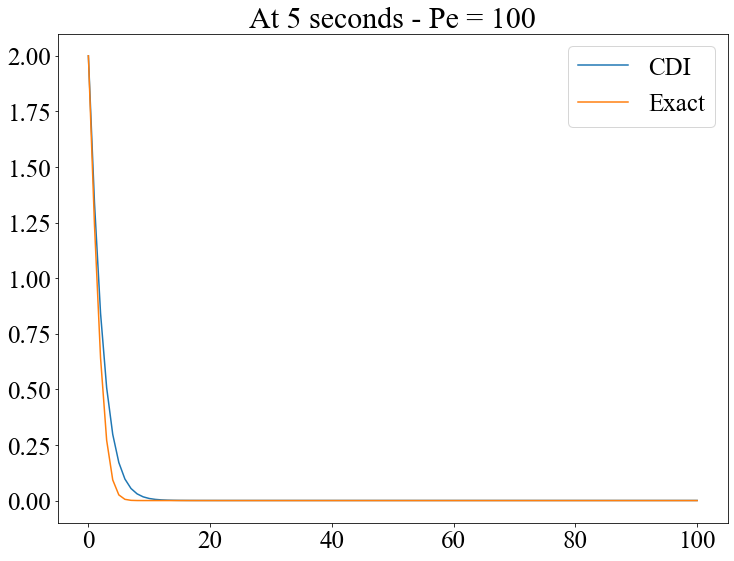

In [115]:
plt.plot(U_CDI[:, -5000], label='CDI'); plt.plot(U_exact[:, -5000], label='Exact'); plt.legend(); plt.title("At 5 seconds - Pe = 100")

For lower Pe =10.


<ipython-input-116-6f60df17ae05>:25: RuntimeWarning: invalid value encountered in double_scalars
  An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-116-6f60df17ae05>:27: RuntimeWarning: invalid value encountered in double_scalars
  Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] + un*t[i])/(2*np.sqrt(D*R*t[i]))))
<ipython-input-116-6f60df17ae05>:25: RuntimeWarning: divide by zero encountered in double_scalars
  An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-116-6f60df17ae05>:27: RuntimeWarning: divide by zero encountered in double_scalars
  Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] +

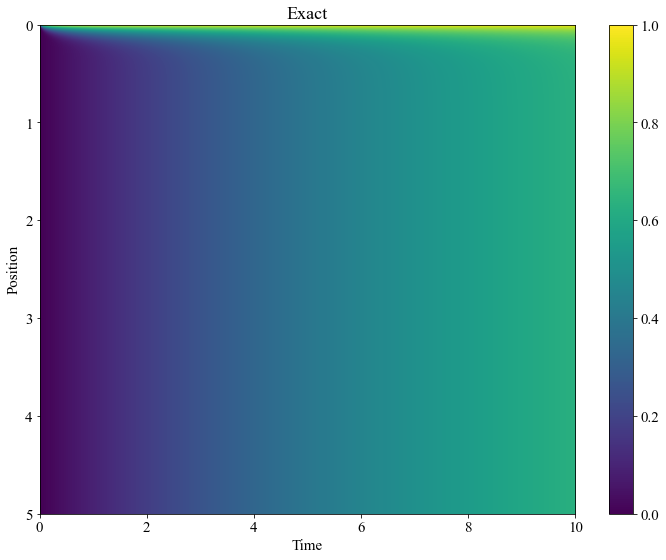

In [116]:
# Analytical - du/dt = -v*du/dx+D*d2u/dx2 - c*u + d

Ci = 0; 
Co = 1;
# dCinf/dx = 0;
R = 1; 
c = 0.1
D = 0.01
v = -0.1
d = 0.1
nx = 501;
nt = 10001;

L = 5.0;
T = 10.0;

x = np.linspace(0, L, nx);
t = np.linspace(0, T, nt);


C = np.zeros((nt, nx))

for i in range(nt):  
    for j in range(nx):
        An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))       
        un = v*(np.sqrt(1+ (4*c*D)/(v**2)))
        Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] + un*t[i])/(2*np.sqrt(D*R*t[i]))))
        # print(np.shape(An), np.shape(Bn))
        C[i, j] = d/c + (Ci - d/c)*An + (Co-d/c)*Bn

U_exact = np.transpose(C);

fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 15})
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()

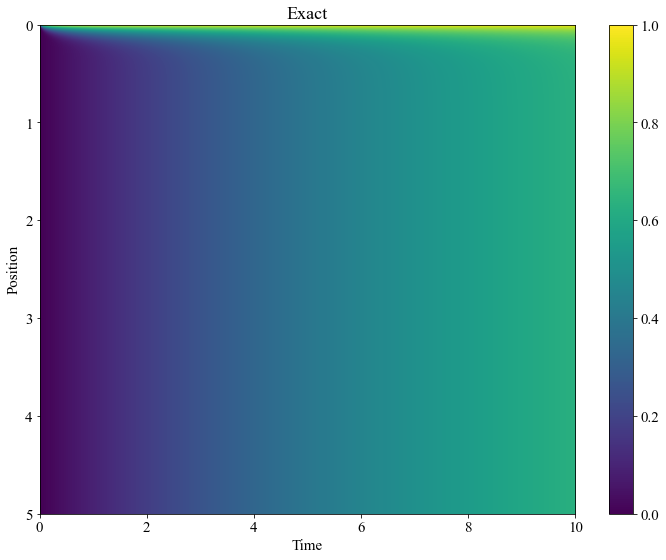

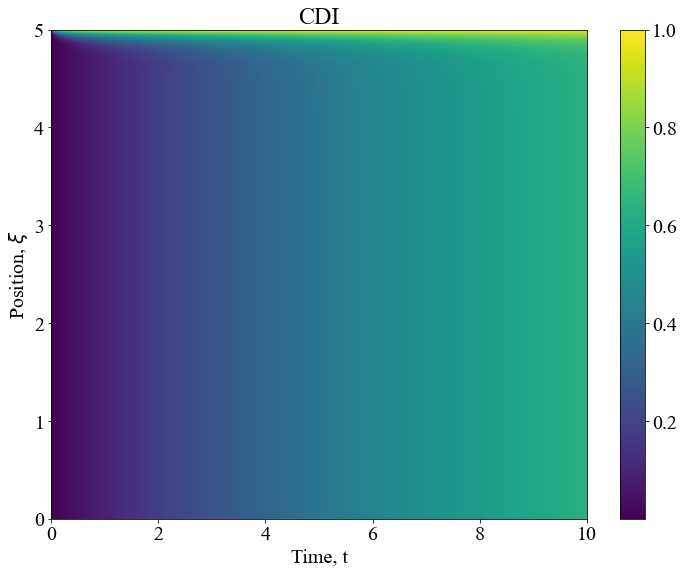

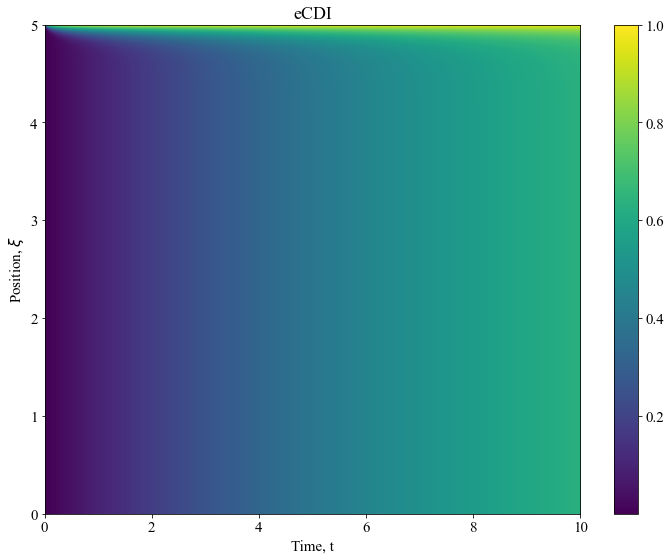

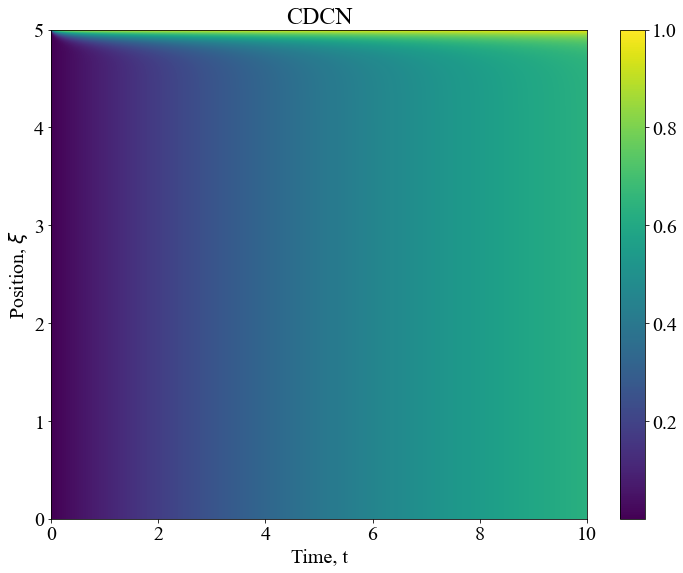

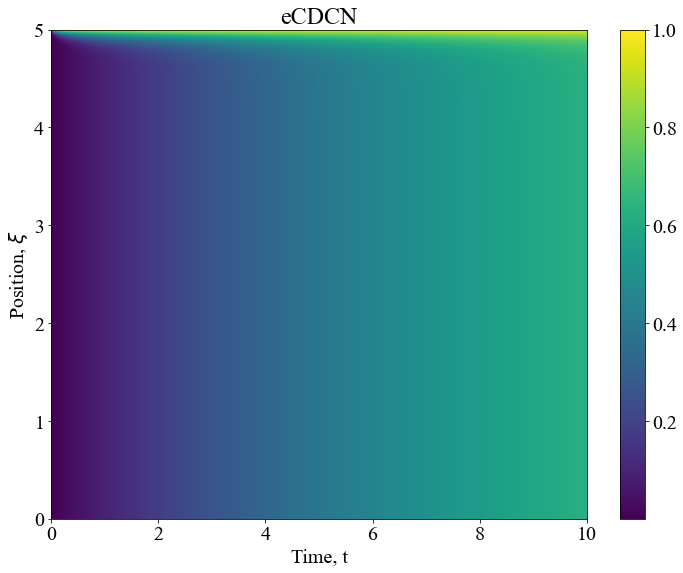

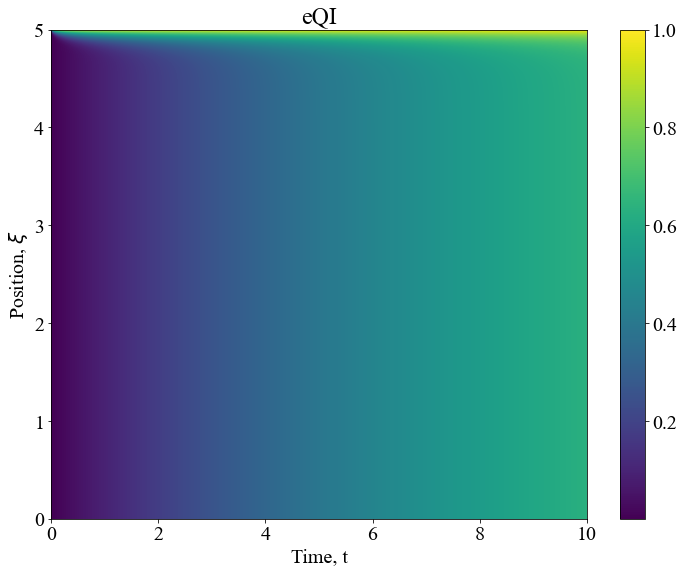

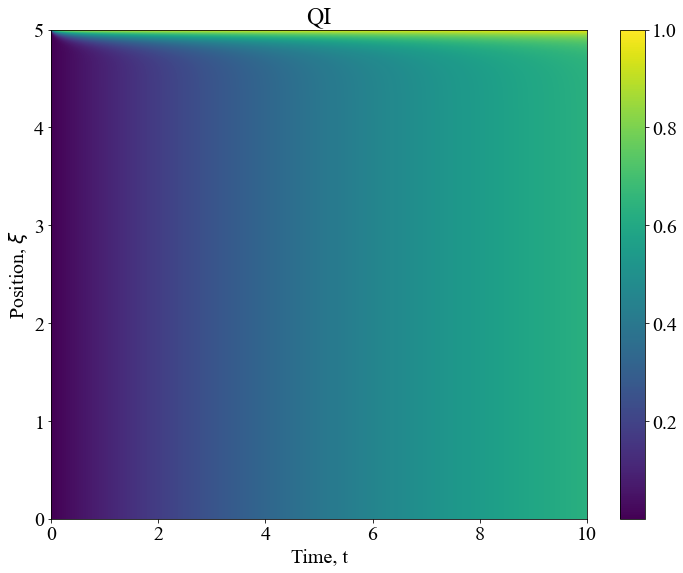

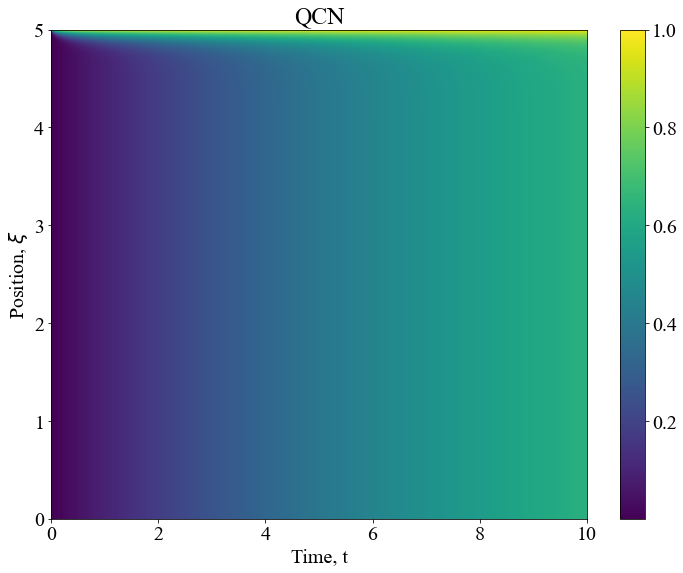

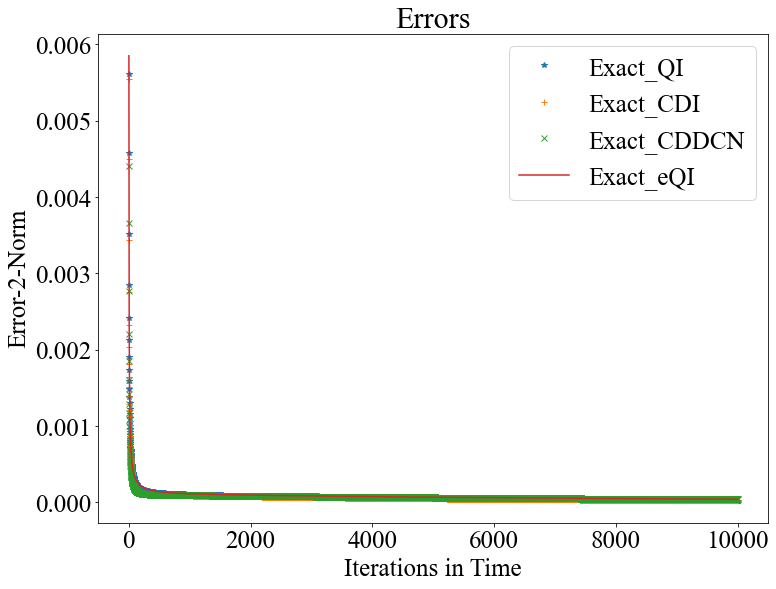

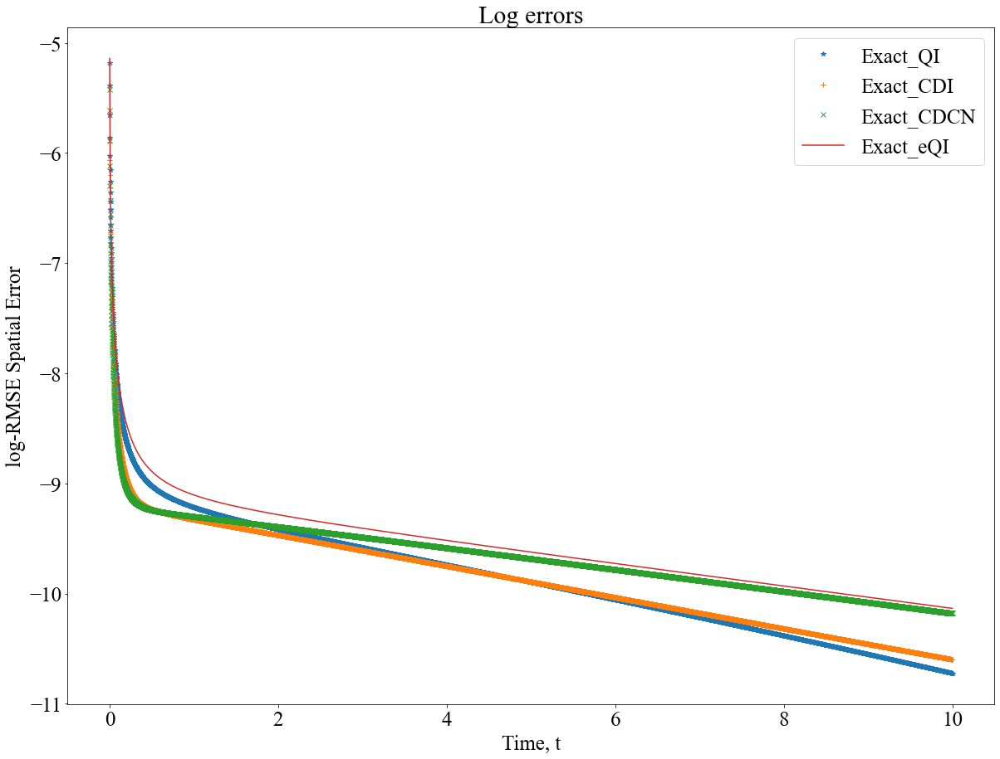

In [117]:
# Define the grid
a = 0.1;
b = 0.01;
c = -0.1;
d = 0.1;



nx = 501
nt = 10001
L = 5.0
T = 10.0

# Define x & t
x = np.linspace(0, L, nx)
t = np.linspace(0, T, nt)


# Dirichlet Boundary Condition
left = 1.0*np.ones(nt)
# right = np.zeros(nt)

fig = plt.figure()  
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


# Discretization of space and time
dx = L/(nx-1)
dt = T/(nt-1)
u = np.zeros(nx);
def numerical_scheme_CDI(u_CDI, dx, dt, l):
    alpha = a*dt/dx
    beta = b*dt/dx**2
    A = np.zeros((len(u_CDI), len(u_CDI)))
    bi = d*dt+u_CDI;

    for j in range(1, len(u_CDI)-1):

        A[j, j-1] = -(beta-alpha/2)
        A[j, j] = 1+2*beta-c*dt
        A[j, j+1] = -(beta+alpha/2)

    N = len(u_CDI)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0
    
    
    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r


    u_CDI = solve(A, bi)

    return u_CDI

def numerical_scheme_e_CDI(u_eCDI, dx, dt,a, b, c, d, l):

    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDI*frac)
    N = len(u_eCDI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((len(u_eCDI), len(u_eCDI)))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b
    #plt.legend()
    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    ce = -wk/(dx**2) + v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    be = -vk/(2*dx) - wk/(dx**2) - v2t*v2k/(4*(dx**2));
    ae = -u2k*np.exp(ke)/2 + 2*wk/(dx**2)

    de = np.zeros(N+1);

    for t in range(0, (N+1)):
        if(t==N):
            de[t] = ke[t];
        else:
            de[t] = ke[t]*(-u2k[t]*np.exp(ke[t])/2+1)+uk[t]+u2k[t]*np.exp(ke[t])

    bi = de;

    for j in range(1, len(u_eCDI)-1):
        A[j, j-1] = ce[j]
        A[j, j] = 1+ae[j]
        A[j, j+1] = be[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0


    bi[0] = le
    # bi[N] = r


    ke = solve(A, bi)
    u_eCDI = ((1-np.exp(-ke))/frac)
    return u_eCDI

def numerical_scheme_eCDCN(u_eCDCN, dx, dt,a, b, c, d, l):
    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDCN*frac)
    N = len(u_eCDCN)-1

    A = np.zeros((len(u_eCDCN), len(u_eCDCN)))

    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1]) 

    bcn = ((-a*dt)/(4*dx)) - ((b*dt)/(2*(dx**2))) + ((b*dt)/(8*(dx**2)))*(v2t)
    acn = ((b*dt)/(dx**2)) - ((d*frac + c)*dt*np.exp(ke)/4)
    ccn = (a*dt)/(4*dx) - ((b*dt)/(2*(dx**2))) -  ((b*dt)/(8*(dx**2)))*(v2t)

    dcn = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==(N)):
            dcn[t] = ke[t];
        elif(t==0):
            dcn[t] = ke[t];
        else:
            dcn[t] = ke[t] - c*dt + ((d*frac + c)*dt*np.exp(ke[t]))*(1-ke[t]/4)+ (1/2)*(((a*dt)/(2*dx))*(ke[t+1] - ke[t-1]) + ((b*dt)/(dx**2))*(ke[t+1]+ke[t-1]-2*ke[t]) - ((b*dt)/(4*(dx**2)))*((ke[t+1] - ke[t-1])**2))
            #dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    bi = dcn;

    for j in range(1, N):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = ccn[j]
        A[j, j] = 1+acn[j]
        A[j, j+1] = bcn[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r

    # print(A)
    ke = solve(A, bi)
    u_eCDCN = ((1-np.exp(-ke))/frac)
    return u_eCDCN

def numerical_scheme_CDCN(u_CDCN, dx, dt, l):
    alpha = a*dt/(4*dx)
    beta = b*dt/(2*dx**2)

    A = np.zeros((len(u_CDCN), len(u_CDCN)))

    bi = np.zeros(len(u_CDCN))
    for j in range(1, len(u_CDCN)-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = -(beta - alpha)
        A[j, j] = 1+(2*beta - c*dt/2)
        A[j, j+1] = -(beta + alpha)

        bi[j] = d*dt + u_CDCN[j]*(1-(2*beta - c*dt/2))+u_CDCN[j+1]*(alpha+beta)+u_CDCN[j-1]*(beta-alpha)

    N = len(u)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_CDCN = solve(A, bi)

    return u_CDCN

def numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, l):
    frac = 0.1
    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eQI*frac)
    N = len(u_eQI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((N+1, N+1))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b

    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    # yk = (bia*frac)*dt;#c+e+uk   *np.ones((1, int(N/2)+1)) #d
    v2t = np.zeros(N+1)
    # print(np.shape(v2t))
    v2t[1:N-1] = (7*ke[2:N]-3*ke[1:N-1] - ke[3:N+1] - 3*ke[0:N-2])

    v2t[N-1] = (3*ke[N]+3*ke[N-1]-7*ke[N-2]+ke[N-3])
    # v2t = (ke[1:int(N/2)+1]-ke[0:int(N/2)])
    # print(np.shape(v2t))
    #v2t = np.concatenate((v2t, v2t[0]))
    #print(np.shape(v2t))


    cq = 3*vk/(8*dx) - wk/(dx**2) + 3*v2k*v2t/((8*dx)**2)
    bq = -7*vk/(8*dx) - wk/(dx**2) - 7*v2k*v2t/((8*dx)**2)
    aq = 3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 + 3*v2k*v2t/((8*dx)**2)
    fq = vk/(8*dx) + v2k*v2t/((8*dx)**2)

    # USING LAST node Q with other side variation
    cnq = 7*vk/(8*dx) - wk/(dx**2) + 7*v2k*v2t/((8*dx)**2)
    bnq = -3*vk/(8*dx) - wk/(dx**2) - 3*v2k*v2t/((8*dx)**2)
    anq = -3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 - 3*v2k*v2t/((8*dx)**2)
    fnq = -vk/(8*dx) - v2k*v2t/((8*dx)**2)

    dq = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==N):
            dq[t] = (ke[t])#*((-u2k[0, t]*np.log(ke[t]))/2+1)+(uk[0, t])+(u2k[0, t]*np.exp(ke[t])) ; # currenty CD - I - CN terms - + (1/2)*(u2k[0, t]*np.exp(ke[t]) + 2*uk[0, t])+(ke[t+1]/2)*(vk[0, t]/(2*dx[t])+wk[0, t]/(dx[t]**2))+(v2k[0, t]/2)*(((ke[t+1]-ke[t-1])/2*dx[t])**2)+(ke[t]/2)*(1+ ((u2k[0, t]/(2*dx[t]))*np.exp(ke[t])) - (2*wk[0, t]/(dx[t]**2)))+(ke[t-1]/2)*(-vk[0, t]/(2*dx[t]) + wk[0, t]/(dx[t]**2))
        else:
            dq[t] = ke[t]*((-u2k[t]*np.exp(ke[t])/2)+1)+uk[t]+u2k[t]*np.exp(ke[t]) #(-c[t]*tau[0, t-1])+(1-b[t])*tau[0, t]-a[t]*tau[0, t+1]-e[t]*tau[0, t+2]


    bi = dq;

    for j in range(1, N-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cq[j]
        A[j, j] = 1+aq[j]
        A[j, j+1] = bq[j]
        A[j, j+2] = fq[j]


    A[N-1, N-2] = cnq[N-1] # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anq[N-1]
    A[N-1, N] = bnq[N-1]
    A[N-1, N-3] = fnq[N-1]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r


    # print(A)
    ke = solve(A, bi)
    u_eQI = ((1-np.exp(-ke))/frac)
    return u_eQI

def numerical_scheme_QI(u_QI, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QI), len(u_QI)))
    bi = d*dt+u_QI;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QI)-2):

        A[j, j-1] = cQ
        A[j, j] = 1+aQ
        A[j, j+1] = bQ
        A[j, j+2] = eQ

    N = len(u_QI)-1

    A[N-1, N-2] = cnQ  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ
    A[N-1, N] = bnQ
    A[N-1, N-3] = enQ


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QI = solve(A, bi)

    return u_QI


def numerical_scheme_QCN(u_QCN, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QCN), len(u_QCN)))
    bi = d*dt+u_QCN;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QCN)-2):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cQ/2
        A[j, j] = 1+aQ/2
        A[j, j+1] = bQ/2
        A[j, j+2] = eQ/2
        bi[j] = bi[j] - cQ*u_QCN[j-1]/2 - aQ*u_QCN[j]/2 - bQ*u_QCN[j+1]/2 - eQ*u_QCN[j+2]/2

    N = len(u_QCN)-1

    A[N-1, N-2] = cnQ/2  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ/2
    A[N-1, N] = bnQ/2
    A[N-1, N-3] = enQ/2
    bi[N-1] = bi[N-1] - cnQ*u_QCN[N-2]/2 - anQ*u_QCN[N-1]/2 - bnQ*u_QCN[N]/2 - enQ*u_QCN[N-3]/2


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QCN = solve(A, bi)

    return u_QCN


# u_init = u_exact(x, 1.0)

# Apply the numerical scheme

# U_FD = np.zeros((nx, nt))
U_CDI = np.zeros((nx, nt))
U_CDCN = np.zeros((nx, nt))
U_QI = np.zeros((nx, nt))
U_QCN = np.zeros((nx, nt))
U_eCDI = np.zeros((nx, nt))
U_eQI = np.zeros((nx, nt))

U_eCDCN = np.zeros((nx, nt))


# error_2norm_FD_CDI = np.zeros(nt)
error_2norm_CDI_CDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_CDCN_eCDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_QI_eQI = np.zeros(nt)

error_2norm_CDI_eCDI = np.zeros(nt)
error_2norm_CDI_QI = np.zeros(nt)
error_2norm_QI_QCN = np.zeros(nt)
error_2norm_CDCN_QCN = np.zeros(nt)
error_2norm_CDI_QCN = np.zeros(nt)


error_2norm_eCDCN_eCDI = np.zeros(nt)
error_2norm_eCDCN_eQI = np.zeros(nt)
error_2norm_eCDI_eQI = np.zeros(nt)

error_2norm_Qexact_QI = np.zeros(nt)
error_2norm_Qexact_eQI = np.zeros(nt)

error_2norm_Qexact_CDCN = np.zeros(nt)

error_2norm_Qexact_CDI = np.zeros(nt)
#error_2norm_FD_CDI = np.zeros(nt)


# u_FD = u;
u_CDI=u;
u_CDCN = u;
u_eQI = u;
u_eCDI = u;

u_QI=u;
u_QCN=u;
u_eCDCN=u;

for n in range(nt):
    # print(n)
    # u_FD = numerical_scheme(u_FD, dx, dt)
    # #print(u)
    # #print(str(n*dt)+" "+str(max(u)))
    # U_FD[:, n] = u_FD
    u_CDI = numerical_scheme_CDI(u_CDI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDI[:, n] = u_CDI

    #error = u_FD - u_CDI
    #error_2norm_FD_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)




    u_eCDI = numerical_scheme_e_CDI(u_eCDI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDI[:, n] = u_eCDI

    error = u_CDI - u_eCDI
    error_2norm_CDI_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_CDCN = numerical_scheme_CDCN(u_CDCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDCN[:, n] = u_CDCN
    error = u_CDI - u_CDCN
    error_2norm_CDI_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    u_eCDCN = numerical_scheme_eCDCN(u_eCDCN, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDCN[:, n] = u_eCDCN
    error = u_CDCN - u_eCDCN
    error_2norm_CDCN_eCDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QI = numerical_scheme_QI(u_QI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QI[:, n] = u_QI
    error = u_CDCN - u_QI
    error_2norm_CDCN_QI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QI
    error_2norm_CDI_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_eQI = numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eQI[:, n] = u_eQI

    error = u_QI - u_eQI
    error_2norm_QI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDI - u_eQI
    error_2norm_eCDI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eQI
    error_2norm_eCDCN_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eCDI
    error_2norm_eCDCN_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QCN = numerical_scheme_QCN(u_QCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QCN[:, n] = u_QCN
    error = u_CDCN - u_QCN
    error_2norm_CDCN_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QCN
    error_2norm_CDI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_QI - u_QCN
    error_2norm_QI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    # Comparing with the exact solution
    error = U_exact[:, n] - u_QI
    error_2norm_Qexact_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDCN
    error_2norm_Qexact_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDI
    error_2norm_Qexact_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)
    
    error = U_exact[:, n] - u_eQI
    error_2norm_Qexact_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    
# plt.rcParams['font.size'] = 18
# fig = plt.figure()  
# plt.imshow(U_FD, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
# plt.colorbar()
# plt.title("FD")
# plt.xlabel('Time')
# plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_FD.png', dpi = 900)
# plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_CDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 15})
plt.imshow(U_eCDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eCDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_CDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eCDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eQI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eQI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eQI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_QI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_QI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size':20})
plt.imshow(U_QCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_QCN.png', dpi = 900)
plt.show()



fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
#plt.plot(error_2norm_CDI_CDCN, '-+', label = 'CDI_CDCN')
#plt.plot(error_2norm_CDCN_QI,'-*', label = 'CDCN_QI')
#plt.plot(error_2norm_CDI_QI, '--' ,label = 'CDI_QI')
#plt.plot(error_2norm_CDI_eCDI, '+' ,label = 'CDI_eCDI')
#plt.plot(error_2norm_CDCN_eCDCN, 'x' ,label = 'CDCN_eCDCN')

#plt.plot(error_2norm_QI_QCN, '-', label = 'QI_QCN')
#plt.plot(error_2norm_CDCN_QCN, '.', label='CDCN_QCN')
#plt.plot(error_2norm_QI_eQI, 'o', label='QI_eQI')
#plt.plot(error_2norm_eCDI_eQI, '.-', label='eCDI_eQI')
#plt.plot(error_2norm_eCDCN_eQI, '--', label='eCDCN_eQI')
#plt.plot(error_2norm_eCDCN_eCDI, '.', label='eCDCN_eCDI')

plt.plot(error_2norm_Qexact_QI, '*', label = 'Exact_QI')


plt.plot(error_2norm_Qexact_CDI, '+', label = 'Exact_CDI')
plt.plot(error_2norm_Qexact_CDCN, 'x', label = 'Exact_CDDCN')

plt.plot(error_2norm_Qexact_eQI, '-', label = 'Exact_eQI')
plt.title("Errors")
plt.legend(loc='best')
plt.xlabel('Iterations in Time')
plt.ylabel('Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Error_Norm.png', dpi = 900)
plt.show()
ntt = np.linspace(0,T, nt);
fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(ntt, np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(ntt, np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(ntt, np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(ntt, np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log errors")
plt.xlabel('Time, t')
plt.ylabel('log-RMSE Spatial Error')

fig.set_size_inches(20.,15.)
plt.savefig('LogError_GN_Pe10.png', dpi = 900)
plt.show()


#fig = plt.figure() 
#plt.plot(U_exact[:, -1], '-+',label = 'U_exact')
#plt.plot(U_CDI[:, -1], '-*',label = 'U_CDI')
#plt.legend()
#plt.title("Comparison of U_exact and U_CDI")
#plt.xlabel('Length')
#plt.ylabel('U')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
#plt.show()


Text(0.5, 1.0, 'At 5 seconds - Pe = 0.1')

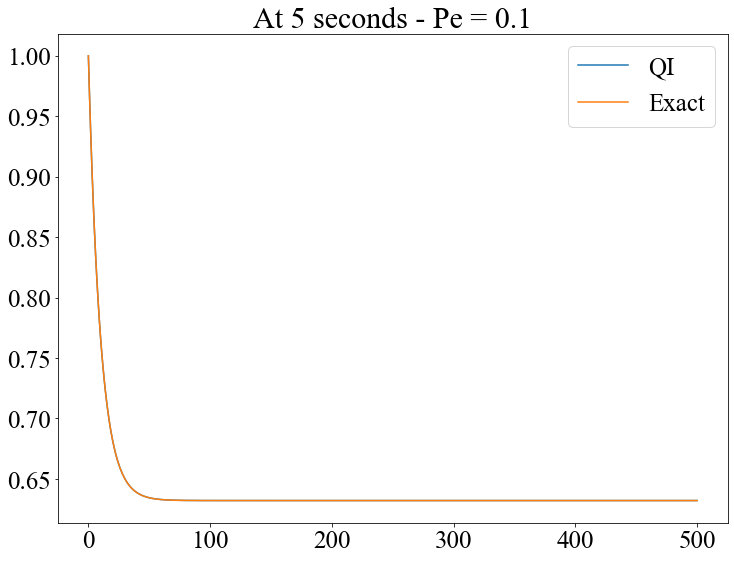

In [118]:
plt.plot(U_QI[:, -1], label='QI'); plt.plot(U_exact[:, -1], label='Exact'); plt.legend(); plt.title("At 5 seconds - Pe = 0.1")

Text(0, 0.5, 'log-Error-2-Norm')

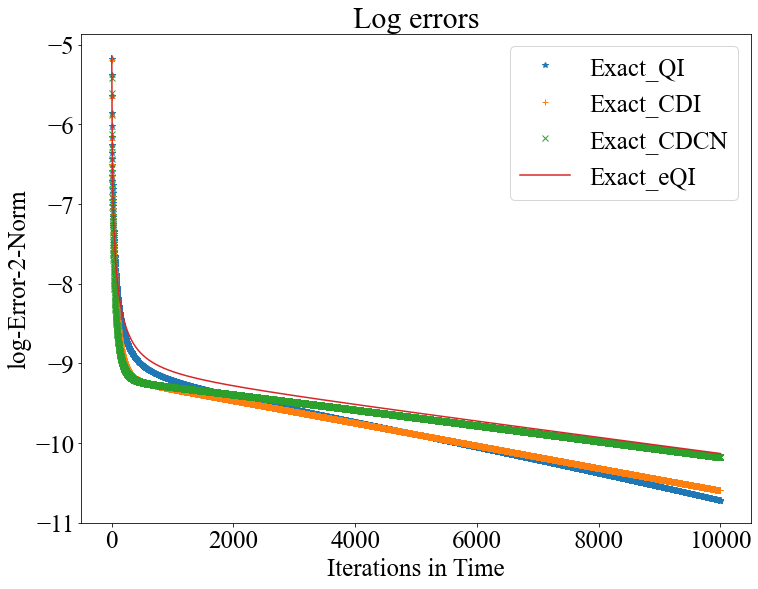

In [119]:

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log errors")
plt.xlabel('Iterations in Time')
plt.ylabel('log-Error-2-Norm')

# The result comparisons at end. 
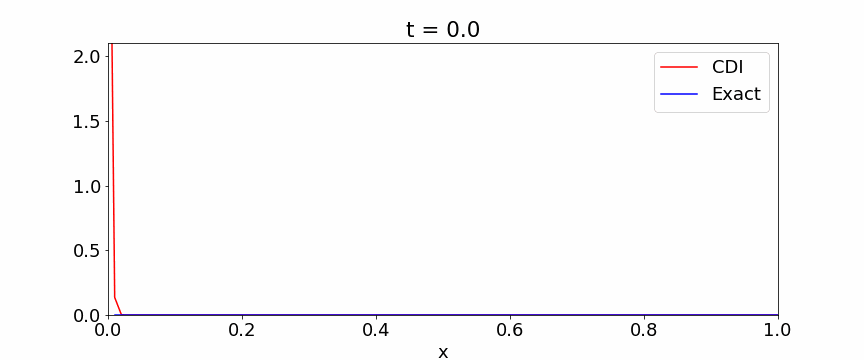

## Pe= 100

<ipython-input-120-6196f6f328f2>:25: RuntimeWarning: invalid value encountered in double_scalars
  An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-120-6196f6f328f2>:27: RuntimeWarning: invalid value encountered in double_scalars
  Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] + un*t[i])/(2*np.sqrt(D*R*t[i]))))
<ipython-input-120-6196f6f328f2>:25: RuntimeWarning: divide by zero encountered in double_scalars
  An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))
<ipython-input-120-6196f6f328f2>:27: RuntimeWarning: divide by zero encountered in double_scalars
  Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] +

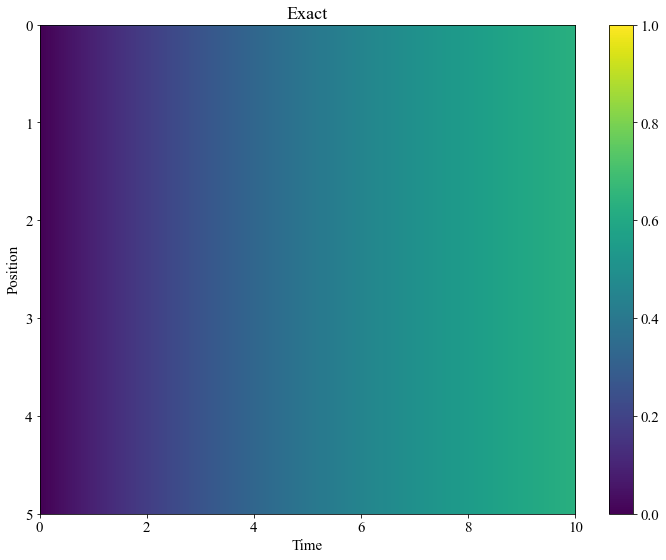

In [120]:
# Analytical - du/dt = -v*du/dx+D*d2u/dx2 - c*u + d

Ci = 0; 
Co = 1;
# dCinf/dx = 0;
R = 1; 
c = 0.1
D = 0.001
v = -0.2
d = 0.1
nx = 501;
nt = 10001;

L = 5.0;
T = 10.0;

x = np.linspace(0, L, nx);
t = np.linspace(0, T, nt);


C = np.zeros((nt, nx))

for i in range(nt):  
    for j in range(nx):
        An = np.exp(-c*t[i]/R)*(1-(erfc((R*x[j]-v*t[i])/(2*np.sqrt(D*R*t[i]))))*0.5 -  0.5*(np.exp(v*x[j]/(D)))*(erfc((R*x[j]+v*t[i])/(2*np.sqrt(D*R*t[i])))))       
        un = v*(np.sqrt(1+ (4*c*D)/(v**2)))
        Bn = 0.5*np.exp(((v-un)*x[j])/(2*D))*(erfc((R*x[j]-un*t[i])/(2*np.sqrt(D*R*t[i])))) + 0.5*np.exp(((v+un)*x[j])/(2*D))*(erfc((R*x[j] + un*t[i])/(2*np.sqrt(D*R*t[i]))))
        # print(np.shape(An), np.shape(Bn))
        C[i, j] = d/c + (Ci - d/c)*An + (Co-d/c)*Bn

U_exact = np.transpose(C);

fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 15})
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()

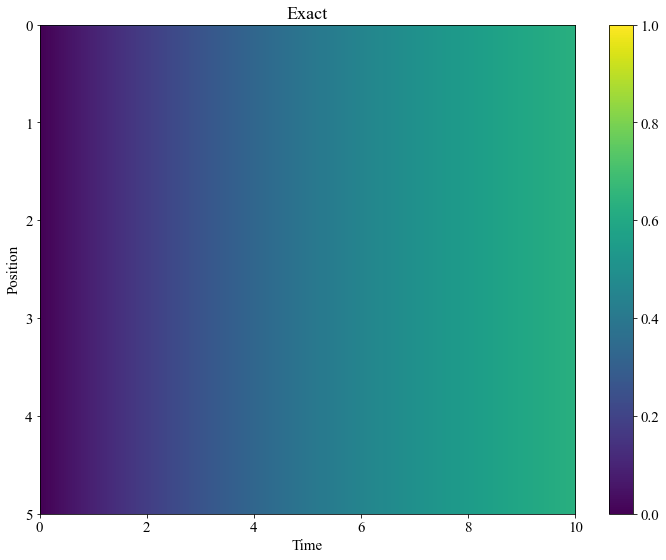

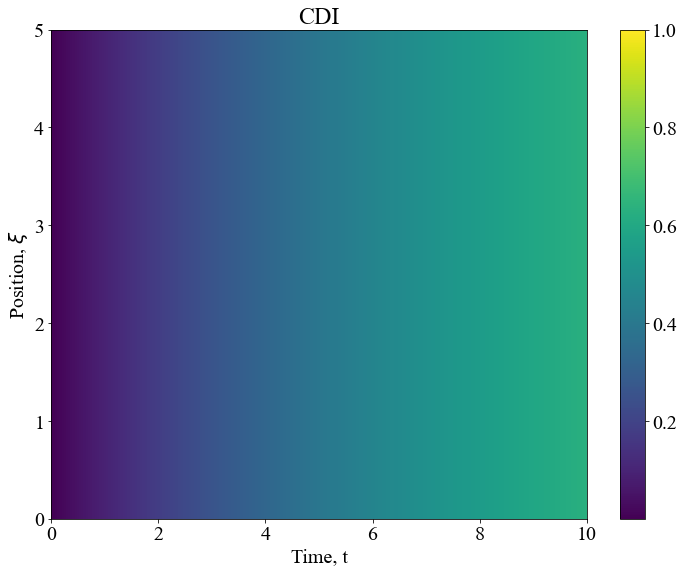

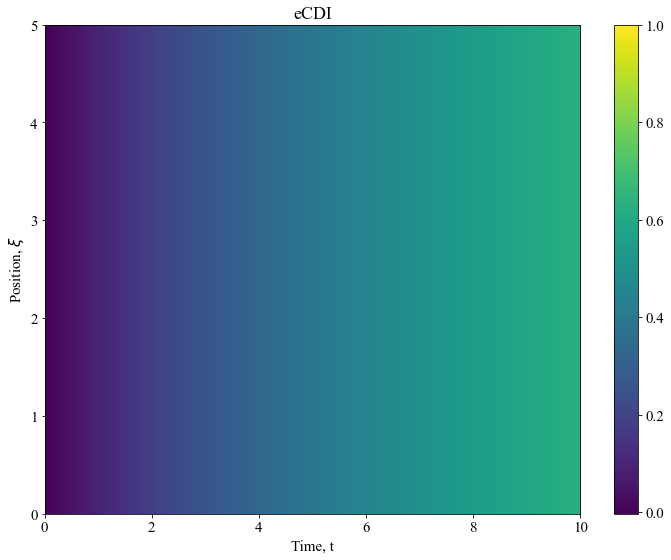

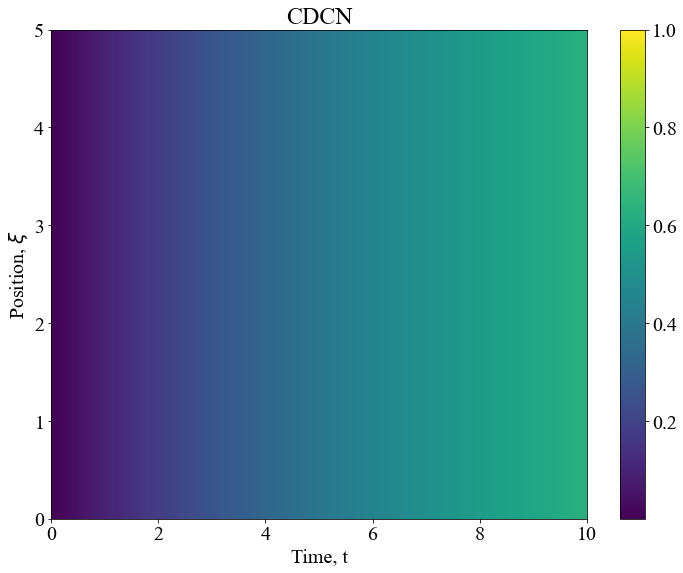

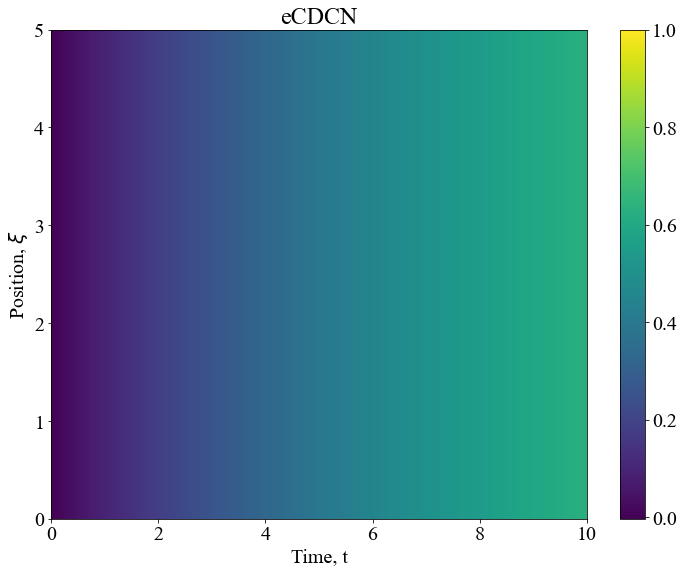

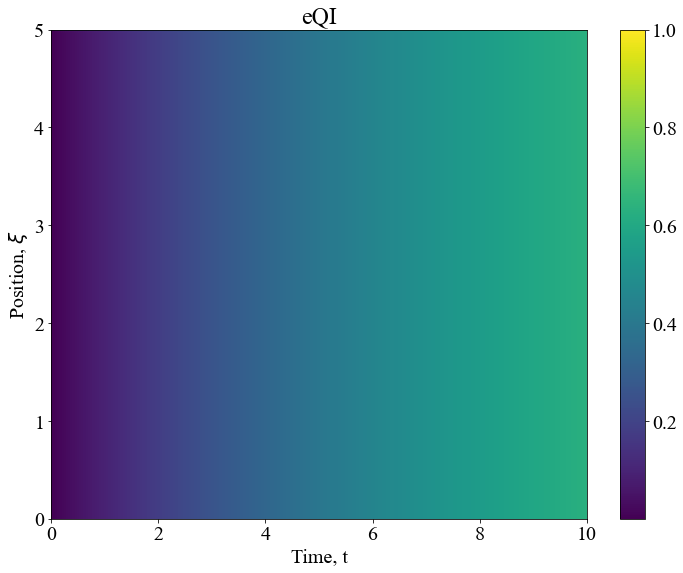

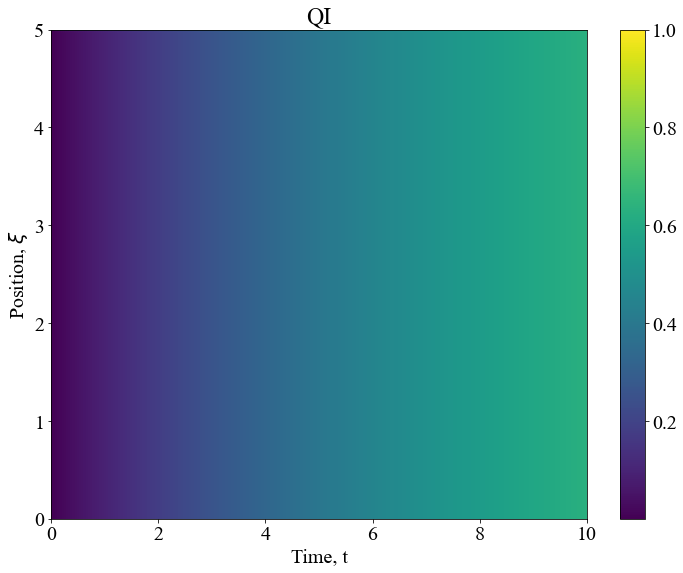

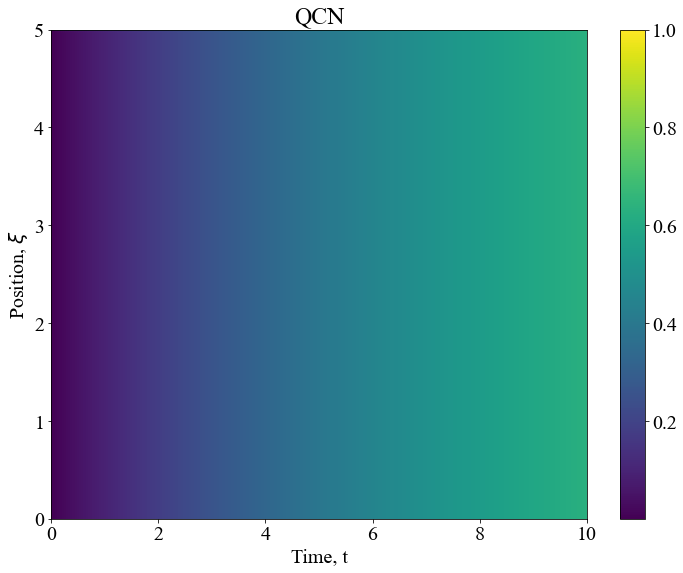

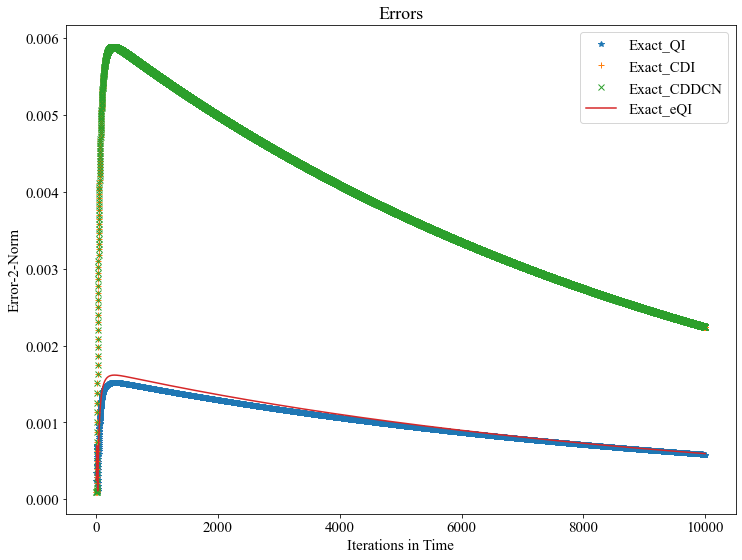

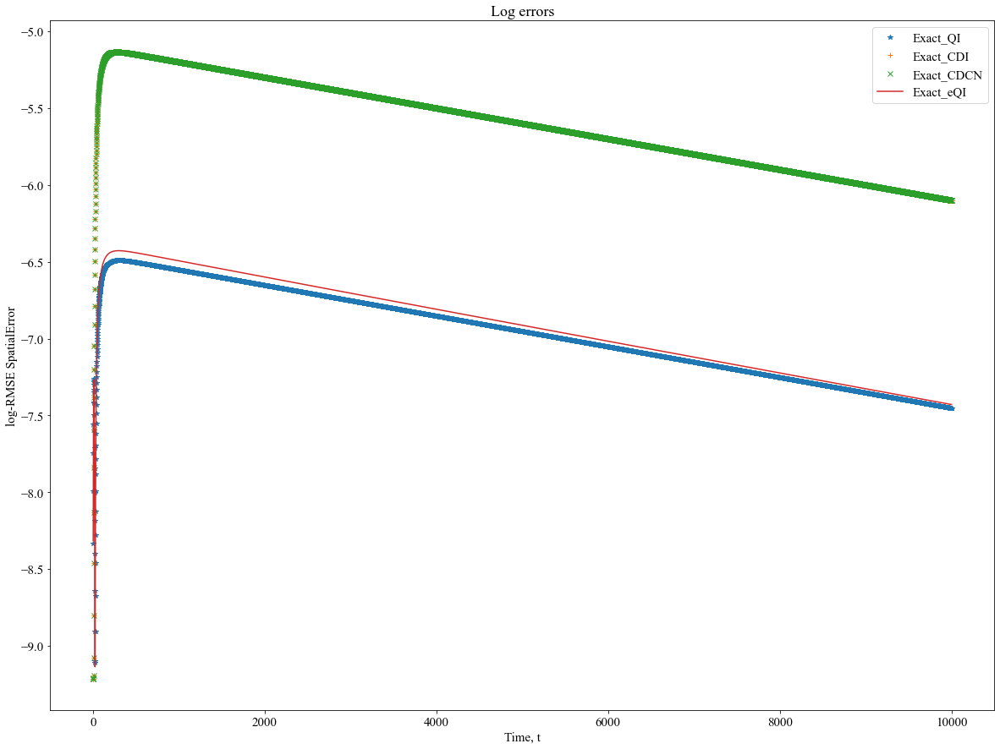

In [121]:
# Define the grid
a = 0.2;
b = 0.001;
c = -0.1;
d = 0.1;



nx = 501
nt = 10001
L = 5.0
T = 10.0

# Define x & t
x = np.linspace(0, L, nx)
t = np.linspace(0, T, nt)


# Dirichlet Boundary Condition
left = 1.0*np.ones(nt)
# right = np.zeros(nt)

fig = plt.figure()  
plt.imshow(np.transpose(C), cmap='viridis',  extent=[0, T, L, 0], aspect='auto')
plt.colorbar()
plt.title("Exact")
plt.xlabel('Time')
plt.ylabel('Position')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


# Discretization of space and time
dx = L/(nx-1)
dt = T/(nt-1)
u = np.zeros(nx);
def numerical_scheme_CDI(u_CDI, dx, dt, l):
    alpha = a*dt/dx
    beta = b*dt/dx**2
    A = np.zeros((len(u_CDI), len(u_CDI)))
    bi = d*dt+u_CDI;

    for j in range(1, len(u_CDI)-1):

        A[j, j-1] = -(beta-alpha/2)
        A[j, j] = 1+2*beta-c*dt
        A[j, j+1] = -(beta+alpha/2)

    N = len(u_CDI)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0
    
    
    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r


    u_CDI = solve(A, bi)

    return u_CDI

def numerical_scheme_e_CDI(u_eCDI, dx, dt,a, b, c, d, l):

    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDI*frac)
    N = len(u_eCDI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((len(u_eCDI), len(u_eCDI)))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b
    #plt.legend()
    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1])

    ce = -wk/(dx**2) + v2k*v2t/(4*(dx**2)) + vk/(2*dx) 
    be = -vk/(2*dx) - wk/(dx**2) - v2t*v2k/(4*(dx**2));
    ae = -u2k*np.exp(ke)/2 + 2*wk/(dx**2)

    de = np.zeros(N+1);

    for t in range(0, (N+1)):
        if(t==N):
            de[t] = ke[t];
        else:
            de[t] = ke[t]*(-u2k[t]*np.exp(ke[t])/2+1)+uk[t]+u2k[t]*np.exp(ke[t])

    bi = de;

    for j in range(1, len(u_eCDI)-1):
        A[j, j-1] = ce[j]
        A[j, j] = 1+ae[j]
        A[j, j+1] = be[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0


    bi[0] = le
    # bi[N] = r


    ke = solve(A, bi)
    u_eCDI = ((1-np.exp(-ke))/frac)
    return u_eCDI

def numerical_scheme_eCDCN(u_eCDCN, dx, dt,a, b, c, d, l):
    frac = 0.1

    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eCDCN*frac)
    N = len(u_eCDCN)-1

    A = np.zeros((len(u_eCDCN), len(u_eCDCN)))

    v2t = np.zeros(N+1)

    v2t[1:N] = (ke[2:N+1]-ke[0:N-1]) 

    bcn = ((-a*dt)/(4*dx)) - ((b*dt)/(2*(dx**2))) + ((b*dt)/(8*(dx**2)))*(v2t)
    acn = ((b*dt)/(dx**2)) - ((d*frac + c)*dt*np.exp(ke)/4)
    ccn = (a*dt)/(4*dx) - ((b*dt)/(2*(dx**2))) -  ((b*dt)/(8*(dx**2)))*(v2t)

    dcn = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==(N)):
            dcn[t] = ke[t];
        elif(t==0):
            dcn[t] = ke[t];
        else:
            dcn[t] = ke[t] - c*dt + ((d*frac + c)*dt*np.exp(ke[t]))*(1-ke[t]/4)+ (1/2)*(((a*dt)/(2*dx))*(ke[t+1] - ke[t-1]) + ((b*dt)/(dx**2))*(ke[t+1]+ke[t-1]-2*ke[t]) - ((b*dt)/(4*(dx**2)))*((ke[t+1] - ke[t-1])**2))
            #dcn[t] = (ke[t])*((-u2k[t]*np.exp(ke[t]))/4+1)+(uk[t])/2+(u2k[t]*np.exp(ke[t]))/2 + (1/2)*(u2k[t]*np.exp(ke[t]) + uk[t])+(ke[t+1]/2)*(vk[t]/(2*dx)+wk[t]/(dx**2))+(v2k[t]/2)*(((ke[t+1]-ke[t-1])/(2*dx))**2)+(ke[t]/2)*(((u2k[t]/(2*dx))*np.exp(ke[t])) - (2*wk[t]/(dx**2)))+(ke[t-1]/2)*(-vk[t]/(2*dx) + wk[t]/(dx**2))


    bi = dcn;

    for j in range(1, N):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = ccn[j]
        A[j, j] = 1+acn[j]
        A[j, j+1] = bcn[j]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r

    # print(A)
    ke = solve(A, bi)
    u_eCDCN = ((1-np.exp(-ke))/frac)
    return u_eCDCN

def numerical_scheme_CDCN(u_CDCN, dx, dt, l):
    alpha = a*dt/(4*dx)
    beta = b*dt/(2*dx**2)

    A = np.zeros((len(u_CDCN), len(u_CDCN)))

    bi = np.zeros(len(u_CDCN))
    for j in range(1, len(u_CDCN)-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = -(beta - alpha)
        A[j, j] = 1+(2*beta - c*dt/2)
        A[j, j+1] = -(beta + alpha)

        bi[j] = d*dt + u_CDCN[j]*(1-(2*beta - c*dt/2))+u_CDCN[j+1]*(alpha+beta)+u_CDCN[j-1]*(beta-alpha)

    N = len(u)-1
    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_CDCN = solve(A, bi)

    return u_CDCN

def numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, l):
    frac = 0.1
    le = -np.log(1-l*frac)
    ke = -np.log(1-u_eQI*frac)
    N = len(u_eQI)-1
    #plt.plot(u_eCDI, label='u_eCDI')
    #plt.plot(ke, label='ke')
    A = np.zeros((N+1, N+1))
    udterm = -c
    ydterm = d
    vdterm = -a
    wdterm = b

    uk = udterm*dt*np.ones(N+1); # f
    u2k = (-udterm + ydterm*frac)*dt*np.ones(N+1) # c
    vk = -vdterm*dt*np.ones(N+1); # a
    v2k = -wdterm*dt*np.ones(N+1); #d
    wk = wdterm*dt*np.ones(N+1); # b


    # yk = (bia*frac)*dt;#c+e+uk   *np.ones((1, int(N/2)+1)) #d
    v2t = np.zeros(N+1)
    # print(np.shape(v2t))
    v2t[1:N-1] = (7*ke[2:N]-3*ke[1:N-1] - ke[3:N+1] - 3*ke[0:N-2])

    v2t[N-1] = (3*ke[N]+3*ke[N-1]-7*ke[N-2]+ke[N-3])
    # v2t = (ke[1:int(N/2)+1]-ke[0:int(N/2)])
    # print(np.shape(v2t))
    #v2t = np.concatenate((v2t, v2t[0]))
    #print(np.shape(v2t))


    cq = 3*vk/(8*dx) - wk/(dx**2) + 3*v2k*v2t/((8*dx)**2)
    bq = -7*vk/(8*dx) - wk/(dx**2) - 7*v2k*v2t/((8*dx)**2)
    aq = 3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 + 3*v2k*v2t/((8*dx)**2)
    fq = vk/(8*dx) + v2k*v2t/((8*dx)**2)

    # USING LAST node Q with other side variation
    cnq = 7*vk/(8*dx) - wk/(dx**2) + 7*v2k*v2t/((8*dx)**2)
    bnq = -3*vk/(8*dx) - wk/(dx**2) - 3*v2k*v2t/((8*dx)**2)
    anq = -3*vk/(8*dx) + 2*wk/(dx**2) - u2k*np.exp(ke)/2 - 3*v2k*v2t/((8*dx)**2)
    fnq = -vk/(8*dx) - v2k*v2t/((8*dx)**2)

    dq = np.zeros(N+1);
    for t in range(0, N+1):
        if(t==N):
            dq[t] = (ke[t])#*((-u2k[0, t]*np.log(ke[t]))/2+1)+(uk[0, t])+(u2k[0, t]*np.exp(ke[t])) ; # currenty CD - I - CN terms - + (1/2)*(u2k[0, t]*np.exp(ke[t]) + 2*uk[0, t])+(ke[t+1]/2)*(vk[0, t]/(2*dx[t])+wk[0, t]/(dx[t]**2))+(v2k[0, t]/2)*(((ke[t+1]-ke[t-1])/2*dx[t])**2)+(ke[t]/2)*(1+ ((u2k[0, t]/(2*dx[t]))*np.exp(ke[t])) - (2*wk[0, t]/(dx[t]**2)))+(ke[t-1]/2)*(-vk[0, t]/(2*dx[t]) + wk[0, t]/(dx[t]**2))
        else:
            dq[t] = ke[t]*((-u2k[t]*np.exp(ke[t])/2)+1)+uk[t]+u2k[t]*np.exp(ke[t]) #(-c[t]*tau[0, t-1])+(1-b[t])*tau[0, t]-a[t]*tau[0, t+1]-e[t]*tau[0, t+2]


    bi = dq;

    for j in range(1, N-1):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cq[j]
        A[j, j] = 1+aq[j]
        A[j, j+1] = bq[j]
        A[j, j+2] = fq[j]


    A[N-1, N-2] = cnq[N-1] # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anq[N-1]
    A[N-1, N] = bnq[N-1]
    A[N-1, N-3] = fnq[N-1]

    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = le
    # bi[N] = r


    # print(A)
    ke = solve(A, bi)
    u_eQI = ((1-np.exp(-ke))/frac)
    return u_eQI

def numerical_scheme_QI(u_QI, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QI), len(u_QI)))
    bi = d*dt+u_QI;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QI)-2):

        A[j, j-1] = cQ
        A[j, j] = 1+aQ
        A[j, j+1] = bQ
        A[j, j+2] = eQ

    N = len(u_QI)-1

    A[N-1, N-2] = cnQ  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ
    A[N-1, N] = bnQ
    A[N-1, N-3] = enQ


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QI = solve(A, bi)

    return u_QI


def numerical_scheme_QCN(u_QCN, dx, dt, l):
    alpha = a*dt
    beta = b*dt

    A = np.zeros((len(u_QCN), len(u_QCN)))
    bi = d*dt+u_QCN;
    cQ = 3*alpha/(8*dx) - beta/(dx**2)
    bQ = -7*alpha/(8*dx) - beta/(dx**2)
    aQ = 3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    eQ = 1*alpha/(8*dx)

    cnQ = 7*alpha/(8*dx) - beta/(dx**2)
    bnQ = -3*alpha/(8*dx) - beta/(dx**2)
    anQ = -3*alpha/(8*dx) + 2*beta/(dx**2) - c*dt
    enQ = -1*alpha/(8*dx)


    for j in range(1, len(u_QCN)-2):
        # A[j, j-2] = -d[j]*dt
        A[j, j-1] = cQ/2
        A[j, j] = 1+aQ/2
        A[j, j+1] = bQ/2
        A[j, j+2] = eQ/2
        bi[j] = bi[j] - cQ*u_QCN[j-1]/2 - aQ*u_QCN[j]/2 - bQ*u_QCN[j+1]/2 - eQ*u_QCN[j+2]/2

    N = len(u_QCN)-1

    A[N-1, N-2] = cnQ/2  # applied the a>0 terms for this one
    A[N-1, N-1] = 1+anQ/2
    A[N-1, N] = bnQ/2
    A[N-1, N-3] = enQ/2
    bi[N-1] = bi[N-1] - cnQ*u_QCN[N-2]/2 - anQ*u_QCN[N-1]/2 - bnQ*u_QCN[N]/2 - enQ*u_QCN[N-3]/2


    # Boundary condition
    # A[0, 0] = -3
    # A[0, 1] = 4
    # A[0, 2] = -1
    # bi[0] = 0

    A[N, N] = 3
    A[N, N-1] = -4
    A[N, N-2] = 1
    bi[N] = 0

    A[0,0] = 1.0
    # A[N,N] = 1.0

    bi[0] = l
    # bi[N] = r



    u_QCN = solve(A, bi)

    return u_QCN


# u_init = u_exact(x, 1.0)

# Apply the numerical scheme

# U_FD = np.zeros((nx, nt))
U_CDI = np.zeros((nx, nt))
U_CDCN = np.zeros((nx, nt))
U_QI = np.zeros((nx, nt))
U_QCN = np.zeros((nx, nt))
U_eCDI = np.zeros((nx, nt))
U_eQI = np.zeros((nx, nt))

U_eCDCN = np.zeros((nx, nt))


# error_2norm_FD_CDI = np.zeros(nt)
error_2norm_CDI_CDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_CDCN_eCDCN = np.zeros(nt)
error_2norm_CDCN_QI = np.zeros(nt)
error_2norm_QI_eQI = np.zeros(nt)

error_2norm_CDI_eCDI = np.zeros(nt)
error_2norm_CDI_QI = np.zeros(nt)
error_2norm_QI_QCN = np.zeros(nt)
error_2norm_CDCN_QCN = np.zeros(nt)
error_2norm_CDI_QCN = np.zeros(nt)


error_2norm_eCDCN_eCDI = np.zeros(nt)
error_2norm_eCDCN_eQI = np.zeros(nt)
error_2norm_eCDI_eQI = np.zeros(nt)

error_2norm_Qexact_QI = np.zeros(nt)
error_2norm_Qexact_eQI = np.zeros(nt)

error_2norm_Qexact_CDCN = np.zeros(nt)

error_2norm_Qexact_CDI = np.zeros(nt)
#error_2norm_FD_CDI = np.zeros(nt)


# u_FD = u;
u_CDI=u;
u_CDCN = u;
u_eQI = u;
u_eCDI = u;

u_QI=u;
u_QCN=u;
u_eCDCN=u;

for n in range(nt):
    # print(n)
    # u_FD = numerical_scheme(u_FD, dx, dt)
    # #print(u)
    # #print(str(n*dt)+" "+str(max(u)))
    # U_FD[:, n] = u_FD
    u_CDI = numerical_scheme_CDI(u_CDI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDI[:, n] = u_CDI

    #error = u_FD - u_CDI
    #error_2norm_FD_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)




    u_eCDI = numerical_scheme_e_CDI(u_eCDI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDI[:, n] = u_eCDI

    error = u_CDI - u_eCDI
    error_2norm_CDI_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_CDCN = numerical_scheme_CDCN(u_CDCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_CDCN[:, n] = u_CDCN
    error = u_CDI - u_CDCN
    error_2norm_CDI_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    u_eCDCN = numerical_scheme_eCDCN(u_eCDCN, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eCDCN[:, n] = u_eCDCN
    error = u_CDCN - u_eCDCN
    error_2norm_CDCN_eCDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QI = numerical_scheme_QI(u_QI, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QI[:, n] = u_QI
    error = u_CDCN - u_QI
    error_2norm_CDCN_QI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QI
    error_2norm_CDI_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_eQI = numerical_scheme_eQI(u_eQI, dx, dt, a, b, c, d, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_eQI[:, n] = u_eQI

    error = u_QI - u_eQI
    error_2norm_QI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDI - u_eQI
    error_2norm_eCDI_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eQI
    error_2norm_eCDCN_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_eCDCN - u_eCDI
    error_2norm_eCDCN_eCDI[n] = np.linalg.norm(error)/np.sqrt(nx)


    u_QCN = numerical_scheme_QCN(u_QCN, dx, dt, left[n])
    #print(u)
    #print(str(n*dt)+" "+str(max(u)))
    U_QCN[:, n] = u_QCN
    error = u_CDCN - u_QCN
    error_2norm_CDCN_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_CDI - u_QCN
    error_2norm_CDI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    error = u_QI - u_QCN
    error_2norm_QI_QCN[n] = np.linalg.norm(error)/np.sqrt(nx)

    # Comparing with the exact solution
    error = U_exact[:, n] - u_QI
    error_2norm_Qexact_QI[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDCN
    error_2norm_Qexact_CDCN[n] = np.linalg.norm(error)/np.sqrt(nx)


    error = U_exact[:, n] - u_CDI
    error_2norm_Qexact_CDI[n] = np.linalg.norm(error)/np.sqrt(nx)
    
    error = U_exact[:, n] - u_eQI
    error_2norm_Qexact_eQI[n] = np.linalg.norm(error)/np.sqrt(nx)

    
# plt.rcParams['font.size'] = 18
# fig = plt.figure()  
# plt.imshow(U_FD, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
# plt.colorbar()
# plt.title("FD")
# plt.xlabel('Time')
# plt.ylabel('Position')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_FD.png', dpi = 900)
# plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_CDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDI.png', dpi = 900)
plt.show()


fig = plt.figure()  
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 15})
plt.imshow(U_eCDI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eCDI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_CDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("CDCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eCDCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eCDCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_CDCN.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_eQI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("eQI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_eQI.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})
plt.imshow(U_QI, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QI")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

#fig.set_size_inches(30.,18.)
# plt.savefig('U_QI.png', dpi = 900)
plt.show()


fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size':20})
plt.imshow(U_QCN, cmap='viridis', extent=[0, T, 0, L], aspect='auto')
plt.colorbar()
plt.title("QCN")
plt.xlabel('Time, t')
plt.ylabel(r'Position, $\xi$')

# fig.set_size_inches(30.,18.)
# plt.savefig('U_QCN.png', dpi = 900)
plt.show()



fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
#plt.plot(error_2norm_CDI_CDCN, '-+', label = 'CDI_CDCN')
#plt.plot(error_2norm_CDCN_QI,'-*', label = 'CDCN_QI')
#plt.plot(error_2norm_CDI_QI, '--' ,label = 'CDI_QI')
#plt.plot(error_2norm_CDI_eCDI, '+' ,label = 'CDI_eCDI')
#plt.plot(error_2norm_CDCN_eCDCN, 'x' ,label = 'CDCN_eCDCN')

#plt.plot(error_2norm_QI_QCN, '-', label = 'QI_QCN')
#plt.plot(error_2norm_CDCN_QCN, '.', label='CDCN_QCN')
#plt.plot(error_2norm_QI_eQI, 'o', label='QI_eQI')
#plt.plot(error_2norm_eCDI_eQI, '.-', label='eCDI_eQI')
#plt.plot(error_2norm_eCDCN_eQI, '--', label='eCDCN_eQI')
#plt.plot(error_2norm_eCDCN_eCDI, '.', label='eCDCN_eCDI')

plt.plot(error_2norm_Qexact_QI, '*', label = 'Exact_QI')


plt.plot(error_2norm_Qexact_CDI, '+', label = 'Exact_CDI')
plt.plot(error_2norm_Qexact_CDCN, 'x', label = 'Exact_CDDCN')

plt.plot(error_2norm_Qexact_eQI, '-', label = 'Exact_eQI')
plt.title("Errors")
plt.legend(loc='best')
plt.xlabel('Iterations in Time')
plt.ylabel('Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Error_Norm.png', dpi = 900)
plt.show()

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(np.log(error_2norm_Qexact_CDCN), 'x', label = 'Exact_CDCN')
plt.plot(np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log errors")
plt.xlabel('Time, t')
plt.ylabel('log-RMSE SpatialError')

fig.set_size_inches(20.,15.)
plt.savefig('Log-ErrorNorm_GN_Pe200.png', dpi = 900)
plt.show()


#fig = plt.figure() 
#plt.plot(U_exact[:, -1], '-+',label = 'U_exact')
#plt.plot(U_CDI[:, -1], '-*',label = 'U_CDI')
#plt.legend()
#plt.title("Comparison of U_exact and U_CDI")
#plt.xlabel('Length')
#plt.ylabel('U')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
#plt.show()


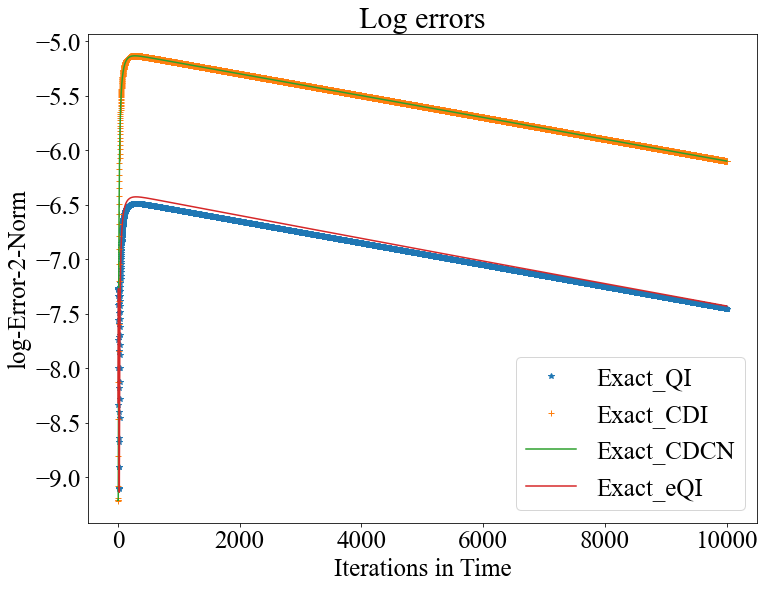

In [122]:

fig = plt.figure() 
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
# plt.plot(np.log(error_2norm_FD_CDI), '-+',label = 'FD_CDI')
#plt.plot(np.log(error_2norm_CDI_CDCN), '-*',label = 'CDI_CDCN')
#plt.plot(np.log(error_2norm_CDCN_QI), '--',label = 'CDCN_QI')
#plt.plot(np.log(error_2norm_CDI_eCDI), '-+' ,label = 'CDI_eCDI')
#plt.plot(np.log(error_2norm_CDCN_eCDCN), '-x' ,label = 'CDCN_eCDCN')

#plt.plot(np.log(error_2norm_CDI_QI), '-',label = 'CDI_QI')
#plt.plot(np.log(error_2norm_QI_QCN), '-.',label = 'QI_QCN')
#plt.plot(np.log(error_2norm_CDCN_QCN), '.',label = 'CDCN_QCN')
#plt.plot(np.log(error_2norm_QI_eQI), 'o', label='QI_eQI')

#plt.plot(np.log(error_2norm_eCDI_eQI), '.-', label='eCDI_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eQI), '--', label='eCDCN_eQI')
#plt.plot(np.log(error_2norm_eCDCN_eCDI), '.', label='eCDCN_eCDI')
plt.plot(np.log(error_2norm_Qexact_QI), '*', label = 'Exact_QI')
plt.plot(np.log(error_2norm_Qexact_CDI), '+', label = 'Exact_CDI')
plt.plot(np.log(error_2norm_Qexact_CDCN), '-', label = 'Exact_CDCN')
plt.plot(np.log(error_2norm_Qexact_eQI), '-', label = 'Exact_eQI')

plt.legend(loc='best')
plt.title("Log errors")
plt.xlabel('Iterations in Time')
plt.ylabel('log-Error-2-Norm')

#fig.set_size_inches(30.,18.)
# plt.savefig('Log-ErrorNorm.png', dpi = 900)
plt.show()
